<a href="https://colab.research.google.com/github/Aakruthi006/Analysis-on-Global-Country-Macro-Data-using-ML/blob/main/World_Data(Regression).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive',force_remount=True)

Mounted at /content/drive


In [ ]:
from google.colab import files

# PPT Link

https://www.canva.com/design/DAGwIO06fA8/4LAaYIFTeidSJ4YCcuoOUg/edit?utm_content=DAGwIO06fA8&utm_campaign=designshare&utm_medium=link2&utm_source=sharebutton

# Libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.formula.api as smf
from sklearn.linear_model import LinearRegression
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

# Data Preprocessing

In [ ]:
df=pd.read_csv('/content/drive/MyDrive/world-data-2023.csv')
df

,Country,Density\n(P/Km2),Abbreviation,Agricultural Land( %),Land Area(Km2),Armed Forces size,Birth Rate,Calling Code,Capital/Major City,Co2-Emissions,...,Out of pocket health expenditure,Physicians per thousand,Population,Population: Labor force participation (%),Tax revenue (%),Total tax rate,Unemployment rate,Urban_population,Latitude,Longitude
0,Afghanistan,60,AF,58.10%,"652,230","323,000",32.49,93.0,Kabul,"8,672",...,78.40%,0.28,"38,041,754",48.90%,9.30%,71.40%,11.12%,"9,797,273",33.939110,67.709953
1,Albania,105,AL,43.10%,"28,748","9,000",11.78,355.0,Tirana,"4,536",...,56.90%,1.20,"2,854,191",55.70%,18.60%,36.60%,12.33%,"1,747,593",41.153332,20.168331
2,Algeria,18,DZ,17.40%,"2,381,741","317,000",24.28,213.0,Algiers,"150,006",...,28.10%,1.72,"43,053,054",41.20%,37.20%,66.10%,11.70%,"31,510,100",28.033886,1.659626
3,Andorra,164,AD,40.00%,468,NaN,7.20,376.0,Andorra la Vella,469,...,36.40%,3.33,"77,142",NaN,NaN,NaN,NaN,"67,873",42.506285,1.521801
4,Angola,26,AO,47.50%,"1,246,700","117,000",40.73,244.0,Luanda,"34,693",...,33.40%,0.21,"31,825,295",77.50%,9.20%,49.10%,6.89%,"21,061,025",-11.202692,17.873887
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
190,Venezuela,32,VE,24.50%,"912,050","343,000",17.88,58.0,Caracas,"164,175",...,45.80%,1.92,"28,515,829",59.70%,NaN,73.30%,8.80%,"25,162,368",6.423750,-66.589730
191,Vietnam,314,VN,39.30%,"331,210","522,000",16.75,84.0,Hanoi,"192,668",...,43.50%,0.82,"96,462,106",77.40%,19.10%,37.60%,2.01%,"35,332,140",14.058324,108.277199
192,Yemen,56,YE,44.60%,"527,968","40,000",30.45,967.0,Sanaa,"10,609",...,81.00%,0.31,"29,161,922",38.00%,NaN,26.60%,12.91%,"10,869,523",15.552727,48.516388
193,Zambia,25,ZM,32.10%,"752,618","16,000",36.19,260.0,Lusaka,"5,141",...,27.50%,1.19,"17,861,030",74.60%,16.20%,15.60%,11.43%,"7,871,713",-13.133897,27.849332


In [ ]:
df.shape

(195, 35)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 195 entries, 0 to 194
Data columns (total 35 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   Country                                    195 non-null    object 
 1   Density
(P/Km2)                            195 non-null    object 
 2   Abbreviation                               188 non-null    object 
 3   Agricultural Land( %)                      188 non-null    object 
 4   Land Area(Km2)                             194 non-null    object 
 5   Armed Forces size                          171 non-null    object 
 6   Birth Rate                                 189 non-null    float64
 7   Calling Code                               194 non-null    float64
 8   Capital/Major City                         192 non-null    object 
 9   Co2-Emissions                              188 non-null    object 
 10  CPI                       

In [ ]:
df.isnull().sum()

,0
Country,0
Density\n(P/Km2),0
Abbreviation,7
Agricultural Land( %),7
Land Area(Km2),1
Armed Forces size,24
Birth Rate,6
Calling Code,1
Capital/Major City,3
Co2-Emissions,7


In [ ]:
df.drop_duplicates(inplace=True)

In [ ]:
df.duplicated().sum()

np.int64(0)

In [ ]:
## remove the columns
pd.set_option('display.max_columns', None)
df.drop(['Abbreviation','Capital/Major City','Currency-Code','Largest city','Official language','Latitude','Longitude','Calling Code'], axis=1, inplace=True)
df

,Country,Density\n(P/Km2),Agricultural Land( %),Land Area(Km2),Armed Forces size,Birth Rate,Co2-Emissions,CPI,CPI Change (%),Fertility Rate,Forested Area (%),Gasoline Price,GDP,Gross primary education enrollment (%),Gross tertiary education enrollment (%),Infant mortality,Life expectancy,Maternal mortality ratio,Minimum wage,Out of pocket health expenditure,Physicians per thousand,Population,Population: Labor force participation (%),Tax revenue (%),Total tax rate,Unemployment rate,Urban_population
0,Afghanistan,60,58.10%,"652,230","323,000",32.49,"8,672",149.9,2.30%,4.47,2.10%,$0.70,"$19,101,353,833",104.00%,9.70%,47.9,64.5,638.0,$0.43,78.40%,0.28,"38,041,754",48.90%,9.30%,71.40%,11.12%,"9,797,273"
1,Albania,105,43.10%,"28,748","9,000",11.78,"4,536",119.05,1.40%,1.62,28.10%,$1.36,"$15,278,077,447",107.00%,55.00%,7.8,78.5,15.0,$1.12,56.90%,1.20,"2,854,191",55.70%,18.60%,36.60%,12.33%,"1,747,593"
2,Algeria,18,17.40%,"2,381,741","317,000",24.28,"150,006",151.36,2.00%,3.02,0.80%,$0.28,"$169,988,236,398",109.90%,51.40%,20.1,76.7,112.0,$0.95,28.10%,1.72,"43,053,054",41.20%,37.20%,66.10%,11.70%,"31,510,100"
3,Andorra,164,40.00%,468,NaN,7.20,469,NaN,NaN,1.27,34.00%,$1.51,"$3,154,057,987",106.40%,NaN,2.7,NaN,NaN,$6.63,36.40%,3.33,"77,142",NaN,NaN,NaN,NaN,"67,873"
4,Angola,26,47.50%,"1,246,700","117,000",40.73,"34,693",261.73,17.10%,5.52,46.30%,$0.97,"$94,635,415,870",113.50%,9.30%,51.6,60.8,241.0,$0.71,33.40%,0.21,"31,825,295",77.50%,9.20%,49.10%,6.89%,"21,061,025"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
190,Venezuela,32,24.50%,"912,050","343,000",17.88,"164,175","2,740.27",254.90%,2.27,52.70%,$0.00,"$482,359,318,768",97.20%,79.30%,21.4,72.1,125.0,$0.01,45.80%,1.92,"28,515,829",59.70%,NaN,73.30%,8.80%,"25,162,368"
191,Vietnam,314,39.30%,"331,210","522,000",16.75,"192,668",163.52,2.80%,2.05,48.10%,$0.80,"$261,921,244,843",110.60%,28.50%,16.5,75.3,43.0,$0.73,43.50%,0.82,"96,462,106",77.40%,19.10%,37.60%,2.01%,"35,332,140"
192,Yemen,56,44.60%,"527,968","40,000",30.45,"10,609",157.58,8.10%,3.79,1.00%,$0.92,"$26,914,402,224",93.60%,10.20%,42.9,66.1,164.0,NaN,81.00%,0.31,"29,161,922",38.00%,NaN,26.60%,12.91%,"10,869,523"
193,Zambia,25,32.10%,"752,618","16,000",36.19,"5,141",212.31,9.20%,4.63,65.20%,$1.40,"$23,064,722,446",98.70%,4.10%,40.4,63.5,213.0,$0.24,27.50%,1.19,"17,861,030",74.60%,16.20%,15.60%,11.43%,"7,871,713"


In [ ]:
# changing the data type of the columns from object to floats datatype for numeric manipulation.

data1=df
for col in data1.columns:
  if col !='Country':
    data1[col] = data1[col].astype(str).str.replace('%', '')
    data1[col] = data1[col].str.replace('$','')
    data1[col] = data1[col].str.replace(',','').astype(float)
data1

,Country,Density\n(P/Km2),Agricultural Land( %),Land Area(Km2),Armed Forces size,Birth Rate,Co2-Emissions,CPI,CPI Change (%),Fertility Rate,Forested Area (%),Gasoline Price,GDP,Gross primary education enrollment (%),Gross tertiary education enrollment (%),Infant mortality,Life expectancy,Maternal mortality ratio,Minimum wage,Out of pocket health expenditure,Physicians per thousand,Population,Population: Labor force participation (%),Tax revenue (%),Total tax rate,Unemployment rate,Urban_population
0,Afghanistan,60.0,58.1,652230.0,323000.0,32.49,8672.0,149.90,2.3,4.47,2.1,0.70,1.910135e+10,104.0,9.7,47.9,64.5,638.0,0.43,78.4,0.28,38041754.0,48.9,9.3,71.4,11.12,9797273.0
1,Albania,105.0,43.1,28748.0,9000.0,11.78,4536.0,119.05,1.4,1.62,28.1,1.36,1.527808e+10,107.0,55.0,7.8,78.5,15.0,1.12,56.9,1.20,2854191.0,55.7,18.6,36.6,12.33,1747593.0
2,Algeria,18.0,17.4,2381741.0,317000.0,24.28,150006.0,151.36,2.0,3.02,0.8,0.28,1.699882e+11,109.9,51.4,20.1,76.7,112.0,0.95,28.1,1.72,43053054.0,41.2,37.2,66.1,11.70,31510100.0
3,Andorra,164.0,40.0,468.0,NaN,7.20,469.0,NaN,NaN,1.27,34.0,1.51,3.154058e+09,106.4,NaN,2.7,NaN,NaN,6.63,36.4,3.33,77142.0,NaN,NaN,NaN,NaN,67873.0
4,Angola,26.0,47.5,1246700.0,117000.0,40.73,34693.0,261.73,17.1,5.52,46.3,0.97,9.463542e+10,113.5,9.3,51.6,60.8,241.0,0.71,33.4,0.21,31825295.0,77.5,9.2,49.1,6.89,21061025.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
190,Venezuela,32.0,24.5,912050.0,343000.0,17.88,164175.0,2740.27,254.9,2.27,52.7,0.00,4.823593e+11,97.2,79.3,21.4,72.1,125.0,0.01,45.8,1.92,28515829.0,59.7,NaN,73.3,8.80,25162368.0
191,Vietnam,314.0,39.3,331210.0,522000.0,16.75,192668.0,163.52,2.8,2.05,48.1,0.80,2.619212e+11,110.6,28.5,16.5,75.3,43.0,0.73,43.5,0.82,96462106.0,77.4,19.1,37.6,2.01,35332140.0
192,Yemen,56.0,44.6,527968.0,40000.0,30.45,10609.0,157.58,8.1,3.79,1.0,0.92,2.691440e+10,93.6,10.2,42.9,66.1,164.0,NaN,81.0,0.31,29161922.0,38.0,NaN,26.6,12.91,10869523.0
193,Zambia,25.0,32.1,752618.0,16000.0,36.19,5141.0,212.31,9.2,4.63,65.2,1.40,2.306472e+10,98.7,4.1,40.4,63.5,213.0,0.24,27.5,1.19,17861030.0,74.6,16.2,15.6,11.43,7871713.0


In [ ]:
# checking for the rows which most percentage of null values.
df['null_percentage'] = (data1.isnull().mean(axis=1) * 100).round(3)

# Select rows with 80% or more null values
rows_with_high_null_percentage = data1[data1['null_percentage'] >= 50]
display(rows_with_high_null_percentage[['Country','null_percentage']])

data1.drop(rows_with_high_null_percentage.index, inplace=True)
data1


,Country,null_percentage
56,Eswatini,74.074
73,Vatican City,85.185
113,Monaco,55.556
120,Nauru,81.481
128,North Macedonia,77.778
133,Palestinian National Authority,92.593
181,Tuvalu,51.852


,Country,Density\n(P/Km2),Agricultural Land( %),Land Area(Km2),Armed Forces size,Birth Rate,Co2-Emissions,CPI,CPI Change (%),Fertility Rate,Forested Area (%),Gasoline Price,GDP,Gross primary education enrollment (%),Gross tertiary education enrollment (%),Infant mortality,Life expectancy,Maternal mortality ratio,Minimum wage,Out of pocket health expenditure,Physicians per thousand,Population,Population: Labor force participation (%),Tax revenue (%),Total tax rate,Unemployment rate,Urban_population,null_percentage
0,Afghanistan,60.0,58.1,652230.0,323000.0,32.49,8672.0,149.90,2.3,4.47,2.1,0.70,1.910135e+10,104.0,9.7,47.9,64.5,638.0,0.43,78.4,0.28,38041754.0,48.9,9.3,71.4,11.12,9797273.0,0.000
1,Albania,105.0,43.1,28748.0,9000.0,11.78,4536.0,119.05,1.4,1.62,28.1,1.36,1.527808e+10,107.0,55.0,7.8,78.5,15.0,1.12,56.9,1.20,2854191.0,55.7,18.6,36.6,12.33,1747593.0,0.000
2,Algeria,18.0,17.4,2381741.0,317000.0,24.28,150006.0,151.36,2.0,3.02,0.8,0.28,1.699882e+11,109.9,51.4,20.1,76.7,112.0,0.95,28.1,1.72,43053054.0,41.2,37.2,66.1,11.70,31510100.0,0.000
3,Andorra,164.0,40.0,468.0,NaN,7.20,469.0,NaN,NaN,1.27,34.0,1.51,3.154058e+09,106.4,NaN,2.7,NaN,NaN,6.63,36.4,3.33,77142.0,NaN,NaN,NaN,NaN,67873.0,37.037
4,Angola,26.0,47.5,1246700.0,117000.0,40.73,34693.0,261.73,17.1,5.52,46.3,0.97,9.463542e+10,113.5,9.3,51.6,60.8,241.0,0.71,33.4,0.21,31825295.0,77.5,9.2,49.1,6.89,21061025.0,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
190,Venezuela,32.0,24.5,912050.0,343000.0,17.88,164175.0,2740.27,254.9,2.27,52.7,0.00,4.823593e+11,97.2,79.3,21.4,72.1,125.0,0.01,45.8,1.92,28515829.0,59.7,NaN,73.3,8.80,25162368.0,3.704
191,Vietnam,314.0,39.3,331210.0,522000.0,16.75,192668.0,163.52,2.8,2.05,48.1,0.80,2.619212e+11,110.6,28.5,16.5,75.3,43.0,0.73,43.5,0.82,96462106.0,77.4,19.1,37.6,2.01,35332140.0,0.000
192,Yemen,56.0,44.6,527968.0,40000.0,30.45,10609.0,157.58,8.1,3.79,1.0,0.92,2.691440e+10,93.6,10.2,42.9,66.1,164.0,NaN,81.0,0.31,29161922.0,38.0,NaN,26.6,12.91,10869523.0,7.407
193,Zambia,25.0,32.1,752618.0,16000.0,36.19,5141.0,212.31,9.2,4.63,65.2,1.40,2.306472e+10,98.7,4.1,40.4,63.5,213.0,0.24,27.5,1.19,17861030.0,74.6,16.2,15.6,11.43,7871713.0,0.000


In [ ]:
data1.drop(['null_percentage'], axis=1, inplace=True)

In [ ]:
for col in data1.columns:
  if col !='Country':
    print(col,'------------------------->',round(data1[col].mean(),2))

Density
(P/Km2) -------------------------> 209.03
Agricultural Land( %) -------------------------> 39.01
Land Area(Km2) -------------------------> 711404.26
Armed Forces size -------------------------> 159274.85
Birth Rate -------------------------> 20.29
Co2-Emissions -------------------------> 178749.98
CPI -------------------------> 190.46
CPI Change (%) -------------------------> 6.72
Fertility Rate -------------------------> 2.7
Forested Area (%) -------------------------> 32.01
Gasoline Price -------------------------> 1.0
GDP -------------------------> 489876232814.03
Gross primary education enrollment (%) -------------------------> 102.56
Gross tertiary education enrollment (%) -------------------------> 37.96
Infant mortality -------------------------> 21.44
Life expectancy -------------------------> 72.28
Maternal mortality ratio -------------------------> 160.39
Minimum wage -------------------------> 2.13
Out of pocket health expenditure -------------------------> 33.05
Phy

In [ ]:
df['Country']=df['Country'].str.replace('S�����������','Sao Tome and Principe')


In [ ]:
df['Life expectancy'] = df['Life expectancy'].apply(lambda x: np.floor(x) + 1 if x % 1 > 0.5 else np.floor(x))

In [ ]:
display(df['Country'].unique())

array(['Afghanistan', 'Albania', 'Algeria', 'Andorra', 'Angola',
       'Antigua and Barbuda', 'Argentina', 'Armenia', 'Australia',
       'Austria', 'Azerbaijan', 'The Bahamas', 'Bahrain', 'Bangladesh',
       'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin', 'Bhutan',
       'Bolivia', 'Bosnia and Herzegovina', 'Botswana', 'Brazil',
       'Brunei', 'Bulgaria', 'Burkina Faso', 'Burundi', 'Ivory Coast',
       'Cape Verde', 'Cambodia', 'Cameroon', 'Canada',
       'Central African Republic', 'Chad', 'Chile', 'China', 'Colombia',
       'Comoros', 'Republic of the Congo', 'Costa Rica', 'Croatia',
       'Cuba', 'Cyprus', 'Czech Republic',
       'Democratic Republic of the Congo', 'Denmark', 'Djibouti',
       'Dominica', 'Dominican Republic', 'Ecuador', 'Egypt',
       'El Salvador', 'Equatorial Guinea', 'Eritrea', 'Estonia',
       'Ethiopia', 'Fiji', 'Finland', 'France', 'Gabon', 'The Gambia',
       'Georgia', 'Germany', 'Ghana', 'Greece', 'Grenada', 'Guatemala',
       'Guinea'

In [ ]:
display(df['Density\n(P/Km2)'].unique())

array([6.000e+01, 1.050e+02, 1.800e+01, 1.640e+02, 2.600e+01, 2.230e+02,
       1.700e+01, 1.040e+02, 3.000e+00, 1.090e+02, 1.230e+02, 3.900e+01,
       2.239e+03, 1.265e+03, 6.680e+02, 4.700e+01, 3.830e+02, 1.080e+02,
       2.000e+01, 1.100e+01, 6.400e+01, 4.000e+00, 2.500e+01, 8.300e+01,
       7.600e+01, 4.630e+02, 1.380e+02, 9.500e+01, 5.600e+01, 8.000e+00,
       1.300e+01, 1.530e+02, 4.600e+01, 4.670e+02, 1.600e+01, 1.000e+02,
       7.300e+01, 1.060e+02, 1.310e+02, 1.390e+02, 4.000e+01, 1.370e+02,
       4.300e+01, 9.600e+01, 2.250e+02, 7.100e+01, 1.030e+02, 3.130e+02,
       5.000e+01, 3.500e+01, 3.100e+01, 1.150e+02, 4.900e+01, 1.190e+02,
       9.000e+00, 2.390e+02, 5.700e+01, 2.400e+02, 8.100e+01, 3.310e+02,
       1.670e+02, 5.300e+01, 7.000e+01, 4.140e+02, 8.900e+01, 1.070e+02,
       4.640e+02, 1.510e+02, 5.200e+01, 9.300e+01, 7.200e+01, 4.000e+02,
       2.060e+02, 2.730e+02, 3.470e+02, 7.000e+00, 9.400e+01, 1.470e+02,
       3.400e+01, 3.200e+01, 3.000e+01, 6.670e+02, 

In [ ]:
display(df['Agricultural Land( %)'].unique())

array([58.1, 43.1, 17.4, 40. , 47.5, 20.5, 54.3, 58.9, 48.2, 32.4, 57.7,
        1.4, 11.1, 70.6, 23.3, 42. , 44.6,  7. , 33.3, 13.6, 34.8, 45.6,
       33.9,  2.7, 46.3, 44.2, 79.2, 64.8, 19.6, 30.9, 20.6,  6.9,  8.2,
       39.7, 21.2, 56.2, 40.3, 71.5, 31.1, 34.5, 27.6, 59.9, 12.2, 45.2,
       11.6, 62. , 73.4, 48.7, 22.2,  3.8, 76.4, 10.1, 75.2, 23.1, 36.3,
        7.5, 52.4, 20. , 59.8, 47.7, 69. , 47.6, 23.5, 36. , 59. , 58. ,
        8.6, 66.8, 28.9, 58.4, 18.7, 60.4, 31.5, 28.2, 21.4, 64.5, 24.6,
       43.2, 41. , 12.3, 12. , 80.4, 48.5,  8.4, 55. , 10.3, 64.3, 77.6,
       28. ,  8.7, 32.2, 47.2, 53.7, 71.2, 61.4, 26.3, 33.8, 63.9, 38.5,
       42.4, 54.6, 31.4, 74.2, 19. , 68.5, 63.5, 19.5, 47.1, 28.7, 53.3,
       40.5, 42.1, 36.1, 77.7, 21.8,  4.6, 47.8, 10.9, 30.4,  2.6, 55.1,
       18.5, 41.7, 46.9, 39.5,  5.8, 58.8, 13.3, 25.6, 12.4, 16.7, 50.7,
       80.8, 46.1, 39.3,  3.4, 54.7,  0.9, 39.2, 30.7,  3.9, 70.3, 79.8,
        nan, 52.6, 43.7,  0.6,  7.4, 38.4, 75.8, 34

In [ ]:
display(df['Land Area(Km2)'].unique())

array([6.522300e+05, 2.874800e+04, 2.381741e+06, 4.680000e+02,
       1.246700e+06, 4.430000e+02, 2.780400e+06, 2.974300e+04,
       7.741220e+06, 8.387100e+04, 8.660000e+04, 1.388000e+04,
       7.650000e+02, 1.484600e+05, 4.300000e+02, 2.076000e+05,
       3.052800e+04, 2.296600e+04, 1.126220e+05, 3.839400e+04,
       1.098581e+06, 5.119700e+04, 5.817300e+05, 8.515770e+06,
       5.765000e+03, 1.108790e+05, 2.742000e+05, 2.783000e+04,
       3.224630e+05, 4.033000e+03, 1.810350e+05, 4.754400e+05,
       9.984670e+06, 6.229840e+05, 1.284000e+06, 7.560960e+05,
       9.596960e+06, 1.138910e+06, 2.235000e+03, 3.420000e+05,
       5.110000e+04, 5.659400e+04, 1.108600e+05, 9.251000e+03,
       7.886700e+04, 2.344858e+06, 4.309400e+04, 2.320000e+04,
       7.510000e+02, 4.867000e+04, 2.835610e+05, 1.001450e+06,
       2.104100e+04, 2.805100e+04, 1.176000e+05, 4.522800e+04,
       1.104300e+06, 1.827400e+04, 3.381450e+05, 6.438010e+05,
       2.676670e+05, 1.130000e+04, 6.970000e+04, 3.5702

In [ ]:
display(df['Armed Forces size'].unique())

array([3.230e+05, 9.000e+03, 3.170e+05,       nan, 1.170e+05, 0.000e+00,
       1.050e+05, 4.900e+04, 5.800e+04, 2.100e+04, 8.200e+04, 1.000e+03,
       1.900e+04, 2.210e+05, 1.550e+05, 3.200e+04, 2.000e+03, 1.200e+04,
       6.000e+03, 7.100e+04, 1.100e+04, 7.300e+05, 8.000e+03, 3.100e+04,
       2.700e+04, 1.910e+05, 2.400e+04, 7.200e+04, 3.500e+04, 1.220e+05,
       2.695e+06, 4.810e+05, 1.000e+04, 1.800e+04, 7.600e+04, 1.600e+04,
       2.300e+04, 1.340e+05, 1.500e+04, 1.300e+04, 4.100e+04, 8.360e+05,
       4.200e+04, 2.020e+05, 1.380e+05, 4.000e+03, 2.500e+04, 3.070e+05,
       7.000e+03, 2.600e+04, 1.800e+05, 1.460e+05, 4.300e+04, 3.000e+03,
       4.000e+04, 3.031e+06, 6.760e+05, 5.630e+05, 2.090e+05, 1.780e+05,
       3.470e+05, 2.610e+05, 1.160e+05, 2.900e+04, 1.290e+05, 8.000e+04,
       3.400e+04, 2.200e+04, 1.360e+05, 5.000e+03, 3.360e+05, 2.460e+05,
       5.130e+05, 1.120e+05, 2.150e+05, 1.469e+06, 4.700e+04, 9.360e+05,
       1.580e+05, 1.530e+05, 5.200e+04, 1.260e+05, 

In [ ]:
display(df['Birth Rate'].unique())

array([32.49, 11.78, 24.28,  7.2 , 40.73, 15.33, 17.02, 13.99, 12.6 ,
        9.7 , 14.  , 13.97, 18.18, 10.65,  9.9 , 10.3 , 20.79, 36.22,
       17.26, 21.75,  8.11, 24.82, 13.92, 14.9 ,  8.9 , 37.93, 39.01,
       35.74, 19.49, 22.46, 35.39, 10.1 , 35.35, 42.17, 12.43, 10.9 ,
       14.88, 31.88, 32.86,  9.  , 10.17, 10.46, 10.7 , 41.18, 10.6 ,
       21.47, 12.  , 19.51, 19.72, 26.38, 18.25, 33.24, 30.3 , 32.34,
       21.28,  8.6 , 11.3 , 31.61, 38.54, 13.47,  9.5 , 29.41,  8.1 ,
       16.47, 24.56, 36.36, 35.13, 19.97, 24.35, 21.6 ,  9.6 , 17.86,
       18.07, 18.78, 29.08, 12.5 , 20.8 ,  7.3 , 16.1 ,  7.4 , 21.98,
       21.77, 28.75, 27.89, 13.94, 27.1 , 23.55, 10.  , 17.55, 26.81,
       33.04, 18.83, 32.66, 34.12, 16.75, 14.2 , 41.54,  9.2 , 29.03,
       33.69, 10.2 , 17.6 , 22.82, 24.13, 11.73, 18.94, 37.52, 28.64,
       19.89, 11.98, 20.64, 46.08, 37.91, 13.89, 10.4 , 19.19, 28.25,
       18.98, 27.07, 20.57, 17.95, 20.55,  8.5 ,  9.54, 11.5 , 31.7 ,
       14.24, 24.38,

In [ ]:
display(df['Co2-Emissions'].unique())

array([8.672000e+03, 4.536000e+03, 1.500060e+05, 4.690000e+02,
       3.469300e+04, 5.570000e+02, 2.013480e+05, 5.156000e+03,
       3.759080e+05, 6.144800e+04, 3.762000e+04, 1.786000e+03,
       3.169400e+04, 8.424600e+04, 1.276000e+03, 5.828000e+04,
       9.688900e+04, 5.680000e+02, 6.476000e+03, 1.261000e+03,
       2.160600e+04, 2.184800e+04, 6.340000e+03, 4.622990e+05,
       7.664000e+03, 4.170800e+04, 3.418000e+03, 4.950000e+02,
       9.674000e+03, 5.430000e+02, 9.919000e+03, 8.291000e+03,
       5.448940e+05, 2.970000e+02, 1.016000e+03, 8.582200e+04,
       9.893038e+06, 9.781400e+04, 2.020000e+02, 3.282000e+03,
       8.023000e+03, 1.748800e+04, 2.828400e+04, 6.626000e+03,
       1.022180e+05, 2.021000e+03, 3.178600e+04, 6.200000e+02,
       1.800000e+02, 2.525800e+04, 4.115500e+04, 2.385600e+05,
       7.169000e+03, 5.655000e+03, 7.110000e+02, 1.659000e+04,
       1.487000e+04, 2.046000e+03, 4.587100e+04, 3.032760e+05,
       5.321000e+03, 5.320000e+02, 1.012800e+04, 7.2797

In [ ]:
display(df['CPI'].unique())

array([ 149.9 ,  119.05,  151.36,     nan,  261.73,  113.81,  232.75,
        129.18,  119.8 ,  118.06,  156.32,  116.22,  117.59,  179.68,
        134.09,  117.11,  105.68,  110.71,  167.18,  148.32,  104.9 ,
        149.75,  167.4 ,   99.03,  114.42,  106.58,  182.11,  111.61,
        110.5 ,  127.63,  118.65,  116.76,  186.86,  117.7 ,  131.91,
        125.08,  140.95,  103.62,  124.74,  128.85,  109.82,  102.51,
        116.48,  133.85,  110.35,  120.25,  103.87,  135.5 ,  124.14,
        288.57,  111.23,  124.35,  122.14,  143.86,  132.3 ,  112.33,
        110.05,  122.19,  172.73,  133.61,  112.85,  268.36,  101.87,
        107.43,  142.92,  262.95,  111.65,  116.19,  179.29,  150.34,
        121.64,  129.  ,  180.44,  151.18,  550.93,  119.86,  108.15,
        110.62,  162.47,  105.48,  125.6 ,  182.75,  180.51,   99.55,
        126.6 ,  155.68,  135.87,  116.86,  130.02,  155.86,  223.13,
        125.71,  118.38,  115.09,  184.33,  418.34,  121.46,   99.7 ,
        108.73,  113

In [ ]:
display(df['CPI Change (%)'].unique())

array([ 2.300e+00,  1.400e+00,  2.000e+00,        nan,  1.710e+01,
        1.200e+00,  5.350e+01,  1.600e+00,  1.500e+00,  2.600e+00,
        2.500e+00,  2.100e+00,  5.600e+00,  4.100e+00, -9.000e-01,
        2.700e+00,  1.800e+00,  6.000e-01,  2.800e+00,  3.700e+00,
       -4.000e-01,  3.100e+00, -3.200e+00, -7.000e-01,  1.100e+00,
        1.900e+00,  3.710e+01, -1.000e+00,  2.900e+00,  3.500e+00,
       -4.300e+00,  2.200e+00,  8.000e-01,  3.000e-01,  3.300e+00,
        1.000e+00,  9.200e+00,  1.000e-01,  1.580e+01,  7.100e+00,
        4.900e+00,  7.200e+00,  2.000e-01,  9.500e+00,  1.250e+01,
        4.400e+00,  3.000e+00,  7.700e+00,  3.990e+01,  4.000e-01,
        9.000e-01,  3.900e+00,  5.000e-01,  5.200e+00,  4.700e+00,
        2.360e+01,  1.700e+00,  9.400e+00,  7.000e-01, -1.700e+00,
        3.600e+00,  4.800e+00,  7.300e+00,  8.800e+00,  5.400e+00,
       -2.500e+00,  1.140e+01,  1.060e+01,  1.300e+00,  3.800e+00,
        4.500e+00,  3.400e+00,  7.900e+00, -1.200e+00,  1.480e

In [ ]:
display(df['Fertility Rate'].unique())

array([4.47, 1.62, 3.02, 1.27, 5.52, 1.99, 2.26, 1.76, 1.74, 1.47, 1.73,
       1.75, 2.04, 1.45, 2.31, 4.84, 1.98, 2.73, 2.87, 1.85, 1.56, 5.19,
       5.41, 4.65, 2.27, 2.5 , 4.57, 1.5 , 4.72, 5.75, 1.65, 1.69, 1.81,
       4.21, 4.43, 1.33, 5.92, 1.9 , 2.35, 2.43, 3.33, 4.51, 4.06, 1.59,
       4.25, 2.77, 1.41, 1.88, 3.97, 5.22, 2.06, 3.87, 1.35, 4.7 , 4.48,
       2.46, 2.94, 1.54, 1.71, 2.22, 2.14, 3.67, 3.09, 1.29, 1.42, 2.76,
       2.84, 3.49, 3.57, 2.08, 3.3 , 2.67, 1.6 , 2.09, 3.14, 4.32, 2.24,
       1.44, 1.63, 1.37, 4.08, 2.  , 1.87, 5.88, 1.23, 4.05, 4.56, 2.13,
       3.05, 1.26, 2.9 , 2.42, 4.85, 2.15, 3.4 , 1.92, 2.4 , 6.91, 5.39,
       2.89, 3.51, 2.21, 3.56, 2.25, 2.58, 1.46, 1.38, 1.57, 4.04, 2.11,
       1.89, 3.88, 2.32, 4.63, 1.49, 2.41, 4.26, 1.14, 1.52, 4.4 , 6.07,
       0.98, 2.2 , 4.41, 2.81, 3.59, 4.89, 1.53, 4.02, 2.07, 2.79, 4.96,
       1.3 , 1.68, 1.97, 3.78, 2.05, 3.79, 3.62])

In [ ]:
display(df['Forested Area (%)'].unique())

array([ 2.1, 28.1,  0.8, 34. , 46.3, 22.3,  9.8, 11.7, 16.3, 46.9, 14.1,
       51.4, 11. , 14.7, 42.6, 22.6, 59.7, 37.8, 72.5, 50.3, 42.7, 18.9,
       58.9, 72.1, 35.4, 19.3, 10.9, 32.7, 22.5, 52.9, 39.3, 38.2, 35.6,
        3.8, 24.3, 22.4, 52.7, 19.7, 65.4, 54.6, 34.4, 31.3, 18.7, 34.6,
       67.2,  0.2, 57.4, 41.7, 50.2,  0.1, 12.6, 55.5, 14.9, 51.3, 12.5,
       55.9, 73.1, 31.2, 90. , 48.4, 40.6, 41.2, 31.7, 50. , 25.8, 69.8,
       83.9,  3.5, 40. , 22.9,  0.5, 23.8, 49.9,  6.6,  1.9,  7.7, 31.8,
       30.9, 68.5,  1.1,  1.2,  7.8, 15. ,  0.4,  3.3, 82.1, 54. , 13.4,
        1.6, 43.1, 34.8, 35.7, 21.4, 33.2, 67.6, 70.2, 19. , 33.9, 91.9,
        8. , 61.5, 48. , 43.6,  8.3, 25.4, 11.2, 38.6, 25.9,  0.9,  7.2,
       40.7,  0. , 87.6, 61.9, 74.1, 37.7, 57.7, 27.8, 30.1, 49.8, 42.3,
       69.2, 60.4, 55.8, 42.8, 31.1, 88.4, 23.1, 40.4, 62. , 77.9, 10. ,
        7.6, 63.4,  nan, 36.9, 32.9,  8.1, 98.3, 68.9,  2.7,  3. , 51.6,
       32.2, 45.4,  3.1, 46. ,  6.8, 15.4,  8.8,  9

In [ ]:
display(df['Gasoline Price'].unique())

array([0.7 , 1.36, 0.28, 1.51, 0.97, 0.99, 1.1 , 0.77, 0.93, 1.2 , 0.56,
       0.92, 0.43, 1.12, 1.81, 0.6 , 1.43, 1.13, 0.72, 0.98, 0.71, 1.05,
       1.02, 0.37, 1.11, 1.21, 0.9 , 1.03, 0.81, 1.41, 0.78, 0.96, 0.68,
        nan, 1.26, 1.4 , 1.23, 1.17, 1.49, 1.55, 1.32, 1.07, 0.61, 0.4 ,
       0.83, 2.  , 1.14, 0.75, 0.82, 1.45, 1.39, 1.18, 0.76, 1.54, 0.79,
       1.69, 0.63, 1.37, 1.57, 1.61, 1.06, 0.42, 0.95, 0.35, 1.16, 0.74,
       0.8 , 0.11, 1.74, 1.19, 1.15, 0.45, 1.63, 1.44, 0.73, 0.65, 0.54,
       0.91, 1.68, 0.88, 0.46, 0.58, 1.78, 1.04, 0.86, 0.59, 1.3 , 0.24,
       1.08, 1.25, 1.22, 1.29, 1.42, 0.87, 0.29, 0.94, 0.49, 1.46, 1.5 ,
       1.31, 0.  , 1.34])

In [ ]:
display(df['GDP'].unique())

array([1.91013538e+10, 1.52780774e+10, 1.69988236e+11, 3.15405799e+09,
       9.46354159e+10, 1.72775926e+09, 4.49663447e+11, 1.36728022e+10,
       1.39268059e+12, 4.46314740e+11, 3.92070000e+10, 1.28270000e+10,
       3.85740691e+10, 3.02571254e+11, 5.20900000e+09, 6.30804570e+10,
       5.29606710e+11, 1.87961360e+09, 1.43907091e+10, 2.44667410e+09,
       4.08953229e+10, 2.00478484e+10, 1.83405108e+10, 1.83975804e+12,
       1.34694229e+10, 8.60000000e+10, 1.57458102e+10, 3.01233488e+09,
       5.87922056e+10, 1.98184574e+09, 2.70893898e+10, 3.87604670e+10,
       1.73642563e+12, 2.22030737e+09, 1.13149513e+10, 2.82318160e+11,
       1.99100000e+13, 3.23802808e+11, 1.18572868e+09, 1.08205911e+10,
       6.17739442e+10, 6.04155530e+10, 1.00023000e+11, 2.45646479e+10,
       2.46489245e+11, 4.73196242e+10, 3.48078018e+11, 3.31871636e+09,
       5.96033333e+08, 8.89412983e+10, 1.07435665e+11, 3.03175128e+11,
       2.70226400e+10, 1.10267749e+10, 2.06500163e+09, 3.13869500e+10,
      

In [ ]:
display(df['Gross primary education enrollment (%)'].unique())

array([104. , 107. , 109.9, 106.4, 113.5, 105. , 109.7,  92.7, 100.3,
       103.1,  99.7,  81.4,  99.4, 116.5, 100.5, 103.9, 111.7, 122. ,
       100.1,  98.2,   nan, 103.2, 115.4,  89.3,  96.1, 121.4,  99.8,
       107.4, 103.4, 100.9, 102. ,  86.8, 101.4, 100.2, 114.5,  99.5,
       106.6, 113.3,  96.5, 101.9,  99.3, 100.7, 108. , 101.3,  75.3,
       114.7, 105.7, 103.3, 106.3,  94.8,  61.8,  68.4,  97.2, 101. ,
       102.5, 139.9,  98. ,  98.6, 104.8,  99.6, 106.9,  91.5, 118.7,
        97.8, 113.6, 100.8, 100.4, 113. , 110.7, 108.7, 104.9,  91. ,
        98.8,  81.5, 104.4,  92.4, 107.6, 102.4,  95.1, 120.9,  85.1,
       109. , 104.7, 102.3, 142.5, 105.3,  97.1,  75.6,  84.7,  99.9,
       101.1, 105.8,  90.6, 100. , 113.9, 112.6, 112.3, 124.2, 142.1,
       104.2, 120.6,  74.7, 112.8,  94.3,  94.4, 108.5, 107.5, 106.2,
       103.8,  85.2, 102.6, 133. , 113.4, 110.5, 108.1, 106.8,  81. ,
       100.6,  98.7,  23.4,  98.1,  73. , 102.7,  76.8, 108.8, 126.6,
       105.2,  81.7,

In [ ]:
display(df['Gross tertiary education enrollment (%)'].unique())

array([  9.7,  55. ,  51.4,   nan,   9.3,  24.8,  90. ,  54.6, 113.1,
        85.1,  27.7,  15.1,  50.5,  20.6,  65.4,  87.4,  79.7,  24.7,
        12.3,  15.6,  23.3,  24.9,  51.3,  31.4,  71. ,   6.5,   6.1,
        23.6,  13.7,  12.8,  68.9,   3. ,   3.3,  88.5,  50.6,  55.3,
         9. ,  12.7,  55.2,  67.9,  41.4,  75.9,  64.1,   6.6,  80.6,
         5.3,   7.2,  59.9,  44.9,  35.2,  29.4,   1.9,   3.4,  69.6,
         8.1,  16.1,  88.2,  65.6,   8.3,   2.7,  63.9,  70.2,  15.7,
       136.6, 104.6,  21.8,  11.6,   2.6,   1.1,  26.2,  48.5,  71.8,
        28.1,  36.3,  68.1,  16.2,  77.8,  63.4,  61.9,  27.1,  63.2,
        34.4,  61.7,  11.5,  54.4,  41.3,  15. ,  88.1,  26.3,  10.2,
        11.9,  60.5,  35.6,  72.4,  19.2,   5.4,   0.8,  45.1,  31.2,
         4.5,  54.3,  23.7,   5. ,  40.6,  40.2,  14.1,  39.8,  56.1,
        35.9,   7.3,  18.8,  22.9,  12.4,  85. ,  82. ,  17.4,   4.4,
        27. ,  38. ,  54.7,  47.8,   1.8,  34.6,  70.7,  35.5,  67.8,
        17.9,  49.4,

In [ ]:
display(df['Infant mortality'].unique())

array([47.9,  7.8, 20.1,  2.7, 51.6,  5. ,  8.8, 11. ,  3.1,  2.9, 19.2,
        8.3,  6.1, 25.1, 11.3,  2.6, 11.2, 60.5, 24.8, 21.8, 30. , 12.8,
        9.8,  5.9, 49. , 41. , 59.4, 16.7, 24. , 50.6,  4.3, 84.5, 71.4,
        6.2,  7.4, 12.2, 51.3, 36.2,  7.6,  4. ,  3.7,  1.9, 68.2,  3.6,
       49.8, 32.9, 24.1, 18.1, 11.8, 62.6, 31.3,  2.1, 39.1, 21.6,  1.4,
        3.4, 32.7, 39. ,  8.7, 34.9, 13.7, 22.1, 64.9, 54. , 49.5, 15.1,
        1.5, 29.9, 21.1, 12.4, 22.5,  3. ,  1.8, 13.9, 30.6, 41.2,  6.7,
       16.9, 37.6,  3.3,  6.4, 65.7, 53.5, 10.2,  nan, 38.2, 35.3, 62. ,
       27.4, 51.5, 13.6, 25.6, 14. ,  2.3, 36.8, 29. , 26.7,  4.7, 15.7,
       48. , 75.7, 57.2, 16.6, 13.1, 38. , 17.2, 11.1,  3.8,  5.8, 27. ,
       14.9, 14.8,  1.7, 24.4,  6. , 31.8,  4.8, 78.5,  4.6, 17.1, 76.6,
       28.5, 63.7,  2.5, 42.1,  2.2, 30.4, 39.3, 47.4, 13.4, 16.4, 14.6,
        9.1, 33.8,  7.5,  6.5,  5.6, 19.1, 22.3, 21.4, 16.5, 42.9, 40.4,
       33.9])

In [ ]:
display(df['Life expectancy'].unique())

array([64., 78., 77., nan, 61., 76., 75., 83., 82., 73., 74., 72., 79.,
       71., 69., 57., 70., 59., 53., 54., 80., 81., 60., 67., 58., 66.,
       62., 84., 68., 65., 63., 85.])

In [ ]:
display(df['Maternal mortality ratio'].unique())

array([ 638.,   15.,  112.,   nan,  241.,   42.,   39.,   26.,    6.,
          5.,   70.,   14.,  173.,   27.,    2.,   36.,  397.,  183.,
        155.,   10.,  144.,   60.,   31.,  320.,  548.,  617.,   58.,
        160.,  529.,  829., 1140.,   13.,   29.,   83.,  273.,  378.,
          8.,    3.,  473.,    4.,  248.,   95.,   59.,   37.,   46.,
        301.,  480.,    9.,  401.,   34.,  252.,  597.,   25.,    7.,
        308.,  576.,  667.,  169.,   65.,   12.,  145.,  177.,   16.,
         79.,   80.,  342.,   92.,  185.,   19.,  544.,  661.,   72.,
        335.,  349.,   53.,  562.,  766.,   61.,   33.,   88.,   45.,
        289.,  250.,  195.,  186.,   98.,  509.,  917.,   89.,  140.,
         52.,  129.,  121.,   17.,  117.,   68.,   43.,  130.,  315.,
       1120.,  104.,  119.,   11., 1150.,  295.,  120.,  524.,  142.,
        396.,   67.,  375.,  125.,  164.,  213.,  458.])

In [ ]:
display(df['Minimum wage'].unique())

array([4.300e-01, 1.120e+00, 9.500e-01, 6.630e+00, 7.100e-01, 3.040e+00,
       3.350e+00, 6.600e-01, 1.359e+01,       nan, 4.700e-01, 5.250e+00,
       5.100e-01, 3.130e+00, 1.490e+00, 1.031e+01, 1.650e+00, 3.900e-01,
       3.200e-01, 1.360e+00, 1.040e+00, 2.900e-01, 1.530e+00, 1.570e+00,
       3.400e-01, 3.600e-01, 6.800e-01, 3.500e-01, 9.510e+00, 3.700e-01,
       6.000e-01, 2.000e+00, 8.700e-01, 1.230e+00, 8.800e-01, 1.840e+00,
       2.920e+00, 5.000e-02, 3.000e+00, 1.800e-01, 1.480e+00, 4.000e-01,
       2.460e+00, 5.000e-01, 1.050e+00, 3.140e+00, 1.280e+00, 1.116e+01,
       1.460e+00, 1.300e-01, 9.990e+00, 2.700e-01, 4.460e+00, 1.600e+00,
       1.600e-01, 9.800e-01, 2.500e-01, 1.010e+00, 2.620e+00, 3.000e-01,
       4.800e-01, 1.580e+00, 1.240e+00, 1.079e+01, 7.580e+00, 1.330e+00,
       6.770e+00, 4.100e-01, 9.000e-02, 8.300e-01, 2.800e+00, 2.150e+00,
       1.700e-01, 1.880e+00, 2.410e+00, 1.305e+01, 2.100e-01, 1.200e-01,
       9.300e-01, 2.300e-01, 5.070e+00, 5.300e-01, 

In [ ]:
display(df['Out of pocket health expenditure'].unique())

array([78.4, 56.9, 28.1, 36.4, 33.4, 24.3, 17.6, 81.6, 19.6, 17.9, 78.6,
       27.8, 25.1, 71.8, 45.2, 34.5, 22.7, 40.5, 19.8, 25.9, 28.6,  5.3,
       28.3,  6. , 47.7, 36.1, 19.1, 36. , 23.2, 59.4, 69.7, 14.6, 39.6,
       56.4, 32.2, 32.4, 18.3, 74.8, 43.8, 21.5, 15.2,  nan, 43.9, 14.8,
       37.4, 13.7, 20.4, 28.4, 43.7, 62. , 27.9, 72. , 52.4, 22.8, 37.8,
       21.4, 19.9,  6.8, 20.3, 57.3, 12.5, 35.5, 57. , 55.8, 54.5, 37.2,
       36.3, 49.1, 29. , 17. , 65.1, 48.3, 39.7, 76.5, 24.4, 23.7, 13.1,
       38.8,  0.2, 14.4, 48.2, 45.4, 41.6, 32.1, 16.9, 36.7, 10.6, 21.7,
       11. , 16.4, 46.3, 37.1, 10. , 50.7, 41.4,  2.5, 46.2, 39.3, 31.8,
       53.1, 73.9,  8.3, 60.4, 12.3, 12.6, 52.3, 72.2, 14.3,  6.4, 66.5,
       21.8, 30.5,  5.8, 36.5, 30.9, 53.5, 27.7,  6.2, 21.3, 26. , 56.6,
       48.4, 11.5, 11.7, 15. , 44.2, 40.6, 38.2, 18.4,  3.3,  7.7, 36.8,
       61.3, 24.2, 38.4, 63.2, 10.1, 53.7, 63.1, 26.1, 11.8, 10.2, 51. ,
       37.3, 39.8, 71.1, 47.8, 17.8, 11.1, 16.2, 42

In [ ]:
display(df['Physicians per thousand'].unique())

array([0.28, 1.2 , 1.72, 3.33, 0.21, 2.76, 3.96, 4.4 , 3.68, 5.17, 3.45,
       1.94, 0.93, 0.58, 2.48, 5.19, 3.07, 1.12, 0.08, 0.42, 1.59, 2.16,
       0.37, 2.15, 1.61, 4.03, 0.1 , 0.23, 0.77, 0.17, 0.09, 2.61, 0.06,
       0.04, 2.59, 1.98, 2.18, 0.27, 0.12, 2.89, 3.  , 8.42, 1.95, 4.12,
       0.07, 4.01, 0.22, 1.08, 1.56, 2.04, 0.45, 1.57, 0.4 , 4.48, 0.84,
       3.81, 3.27, 0.68, 7.12, 4.25, 0.14, 5.48, 1.41, 0.35, 0.13, 0.8 ,
       0.31, 3.41, 4.08, 0.86, 0.43, 1.58, 0.71, 3.31, 4.62, 3.98, 1.31,
       2.41, 2.32, 3.25, 0.16, 0.2 , 2.58, 1.88, 3.19, 2.1 , 2.09,  nan,
       6.35, 3.01, 0.18, 1.51, 4.56, 2.86, 0.19, 2.53, 2.38, 3.21, 0.73,
       0.75, 3.61, 3.59, 0.98, 0.38, 3.67, 2.92, 2.  , 1.18, 1.35, 1.27,
       0.6 , 5.12, 2.49, 2.98, 2.52, 0.64, 0.66, 0.34, 6.11, 0.05, 3.11,
       0.95, 0.03, 2.29, 3.42, 3.09, 0.02, 0.91, 2.36, 3.87, 1.  , 0.26,
       1.21, 4.3 , 1.22, 1.7 , 0.01, 0.81, 0.72, 0.52, 4.17, 1.3 , 1.85,
       2.22, 2.99, 2.81, 5.05, 2.37, 1.92, 0.82, 1.

In [ ]:
display(df['Population: Labor force participation (%)'].unique())

array([48.9, 55.7, 41.2,  nan, 77.5, 61.3, 55.6, 65.5, 60.7, 66.5, 74.6,
       73.4, 59. , 65.2, 64.1, 53.6, 65.1, 70.9, 66.7, 71.8, 46.4, 70.8,
       63.9, 64.7, 55.4, 66.4, 79.2, 57. , 60.5, 82.3, 76.1, 72. , 70.7,
       62.6, 68. , 68.8, 43.3, 69.4, 62.1, 51.2, 63.1, 60.6, 63.5, 62.2,
       60.2, 64.3, 59.1, 62. , 78.4, 63.6, 79.6, 57.6, 55.1, 52.9, 59.4,
       68.3, 60.8, 67.8, 51.8, 62.3, 61.5, 56.2, 67.2, 56.5, 75. , 49.3,
       67.5, 44.7, 43. , 64. , 49.6, 66. , 61.7, 39.3, 74.7, 73.5, 59.8,
       78.5, 61.4, 47. , 67.9, 76.3, 49.7, 61.6, 59.3, 86.1, 76.7, 69.8,
       45.9, 58.3, 43.1, 59.7, 54.4, 45.3, 78.1, 59.5, 83.8, 69.9, 80.4,
       63.8, 72.4, 52.6, 66.6, 47.2, 72.1, 77.6, 59.6, 56.7, 58.8, 86.8,
       54.7, 61.8, 83.7, 67.1, 65.9, 43.7, 57.8, 55.9, 45.7, 54.9, 57.9,
       70.5, 58.4, 47.4, 56. , 63. , 57.5, 53.9, 48.4, 51.1, 64.6, 44.1,
       42. , 83.4, 67.3, 60. , 46.1, 52.8, 64.5, 70.3, 54.2, 82.1, 62.8,
       77.4, 38. , 83.1])

In [ ]:
display(df['Tax revenue (%)'].unique())

array([ 9.3, 18.6, 37.2,  nan,  9.2, 16.5, 10.1, 20.9, 23. , 25.4, 13. ,
       14.8,  4.2,  8.8, 27.5, 14.7, 24. , 26.3, 10.8, 16. , 17. , 20.4,
       19.5, 14.2, 20.2, 15. , 13.6, 11.8, 20.1, 17.1, 12.8,  8.6, 18.2,
        9.4, 14.4,  9. , 22. , 24.5, 14.9, 10.7, 32.4, 22.1, 12.5, 18.1,
        6.1,  7.5, 24.2, 20.8, 10.2, 21.7, 11.5, 12.6, 26.2, 19.4, 10.6,
       10.3, 17.3, 23.3, 11.2,  7.4,  2. , 18.3, 23.1, 24.3, 26.8, 11.9,
       15.1, 11.7,  1.4, 18. , 12.9, 22.9, 15.3, 31.6, 16.9, 26.5, 12. ,
       11.6, 17.8, 19.1, 13.1, 25.2, 17.7, 16.8, 21.9,  0. ,  5.4, 27.1,
       20.7, 29. , 15.6,  1.5, 23.9,  2.5, 21.3, 10. , 14.3, 14. , 17.4,
       22.8, 14.6, 11.4, 18.5, 25.5,  8.9, 16.3, 34.1, 18.7, 29.5,  8. ,
       27.9,  9.8, 25. , 22.3, 21.1, 17.9,  0.1,  9.6, 16.2])

In [ ]:
display(df['Total tax rate'].unique())

array([ 71.4,  36.6,  66.1,   nan,  49.1,  43. , 106.3,  22.6,  47.4,
        51.4,  40.7,  33.8,  13.8,  33.4,  35.6,  53.3,  55.4,  31.1,
        48.9,  35.3,  83.7,  23.7,  25.1,  65.1,   8. ,  28.3,  41.3,
        41.2,  50.1,  37.5,  23.1,  57.7,  24.5,  73.3,  63.5,  34. ,
        59.2,  71.2, 219.6,  54.3,  58.3,  20.5,  22.4,  46.1,  50.7,
        23.8,  37.9,  32.6,  48.8,  34.4,  44.4,  36.4,  79.4,  47.8,
        37.7,  32.1,  60.7,  47.1,  48.4,   9.9,  51.9,  35.2,  69.3,
        45.5,  30.6,  42.7,  39.1,  31.9,  49.7,  30.1,  44.7,  30.8,
        26.1,  25.3,  59.1,  35.1,  46.7,  28.6,  28.4,  37.2,  32.7,
        13. ,  29. ,  24.1,  38.1,  32.2,  13.6,  46.2,  21.6,  42.6,
        20.4,  38.3,  34.5,  38.7,  30.2,  54.5,  44. ,  65.9,  67. ,
        22.2,  55.1,  60.5,  25.7,  45.8,  36.1,  31.2,  20.7,  41.8,
        34.6,  60.6,  47.2,  34.8,  36.2,  27.4,  33.9,  76.6,  37.1,
        35. ,  36.8,  43.1,  40.8,  39.8,  11.3,  20. ,  33.2,  34.7,
        37. ,  19.3,

In [ ]:
display(df['Unemployment rate'].unique())

array([11.12, 12.33, 11.7 ,   nan,  6.89,  9.79, 16.99,  5.27,  4.67,
        5.51, 10.36,  0.71,  4.19, 10.33,  4.59,  5.59,  6.41,  2.23,
        2.34,  3.5 , 18.42, 18.19, 12.08,  9.12,  4.34,  6.26,  1.43,
        3.32, 12.25,  0.68,  3.38,  5.56,  3.68,  1.89,  7.09,  4.32,
        9.71,  9.47, 11.85,  6.93,  1.64,  7.27,  1.93,  4.24,  4.91,
       10.3 ,  5.84,  3.97, 10.76,  4.11,  6.43,  5.14,  5.11,  2.08,
        4.1 ,  6.59,  8.43, 20.  ,  9.06, 14.4 ,  3.04,  4.33, 17.24,
        2.46,  4.3 ,  2.47, 13.78,  5.39,  3.4 ,  2.84,  5.36,  4.69,
       11.38, 12.82,  4.93,  3.86,  9.89,  8.  ,  2.29, 14.72,  2.64,
        2.18,  6.33,  0.63,  6.52,  6.23, 23.41,  2.81, 18.56,  6.35,
        1.76,  5.65,  6.14,  7.22,  3.47,  9.55,  6.67,  3.42,  5.47,
        6.01, 14.88,  9.02,  3.24,  1.58, 20.27,  1.41,  3.2 ,  4.07,
        6.84,  0.47,  8.1 ,  2.74,  3.35,  2.67,  4.45,  3.9 ,  4.81,
        3.31,  2.15,  0.09,  3.98,  1.03, 20.71, 18.88,  8.36, 13.37,
        5.93,  6.6 ,

In [ ]:
display(df['Urban_population'].unique())

array([9.79727300e+06, 1.74759300e+06, 3.15101000e+07, 6.78730000e+04,
       2.10610250e+07, 2.38000000e+04, 4.13395710e+07, 1.86984800e+06,
       2.18447560e+07, 5.19441600e+06, 5.61616500e+06, 3.23784000e+05,
       1.46710900e+06, 6.09874170e+07, 8.94310000e+04, 7.48298200e+06,
       1.12590820e+07, 1.79039000e+05, 5.64814900e+06, 3.17538000e+05,
       8.03303500e+06, 1.60514400e+06, 1.61655000e+06, 1.83241641e+08,
       3.37711000e+05, 5.25602700e+06, 6.09234900e+06, 1.54117700e+06,
       1.31769000e+07, 3.64029000e+05, 3.92462100e+06, 1.47412560e+07,
       3.06284820e+07, 1.98206400e+06, 3.71227300e+06, 1.66101350e+07,
       8.42933962e+08, 4.08273020e+07, 2.48152000e+05, 3.62501000e+06,
       4.04188500e+06, 2.32831800e+06, 8.73913500e+06, 8.00708000e+05,
       7.88715600e+06, 3.90956790e+07, 5.11997800e+06, 7.58549000e+05,
       5.08300000e+04, 8.78747500e+06, 1.11167110e+07, 4.28958240e+07,
       4.69470200e+06, 9.84812000e+05, 1.14967000e+06, 9.16024000e+05,
      

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 188 entries, 0 to 194
Data columns (total 27 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   Country                                    188 non-null    object 
 1   Density
(P/Km2)                            188 non-null    float64
 2   Agricultural Land( %)                      187 non-null    float64
 3   Land Area(Km2)                             188 non-null    float64
 4   Armed Forces size                          171 non-null    float64
 5   Birth Rate                                 188 non-null    float64
 6   Co2-Emissions                              187 non-null    float64
 7   CPI                                        178 non-null    float64
 8   CPI Change (%)                             179 non-null    float64
 9   Fertility Rate                             188 non-null    float64
 10  Forested Area (%)              

In [ ]:
for col in df.columns:
  if df[col].dtype == 'float64':
    df[col].fillna(df[col].mean(), inplace=True)
  elif df[col] .dtype == 'object':
    df[col].fillna(df[col].mode()[0], inplace=True)

/tmp/ipython-input-3575618550.py:5: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(df[col].mode()[0], inplace=True)
/tmp/ipython-input-3575618550.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try usi

In [ ]:
df.isnull().sum()

,0
Country,0
Density\n(P/Km2),0
Agricultural Land( %),0
Land Area(Km2),0
Armed Forces size,0
Birth Rate,0
Co2-Emissions,0
CPI,0
CPI Change (%),0
Fertility Rate,0


In [ ]:
df.to_csv('world-data-2023.csv', index=False)

In [ ]:
files.download('world-data-2023.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
for col in df.columns:
    print(f"{col}: {df[col].nunique()} unique values")

Country: 188 unique values
Density
(P/Km2): 132 unique values
Agricultural Land( %): 168 unique values
Land Area(Km2): 188 unique values
Armed Forces size: 106 unique values
Birth Rate: 169 unique values
Co2-Emissions: 184 unique values
CPI: 176 unique values
CPI Change (%): 87 unique values
Fertility Rate: 139 unique values
Forested Area (%): 161 unique values
Gasoline Price: 102 unique values
GDP: 188 unique values
Gross primary education enrollment (%): 141 unique values
Gross tertiary education enrollment (%): 172 unique values
Infant mortality: 144 unique values
Life expectancy: 32 unique values
Maternal mortality ratio: 115 unique values
Minimum wage: 114 unique values
Out of pocket health expenditure: 157 unique values
Physicians per thousand: 151 unique values
Population: 188 unique values
Population: Labor force participation (%): 146 unique values
Tax revenue (%): 119 unique values
Total tax rate: 157 unique values
Unemployment rate: 165 unique values
Urban_population: 188 un

# EDA

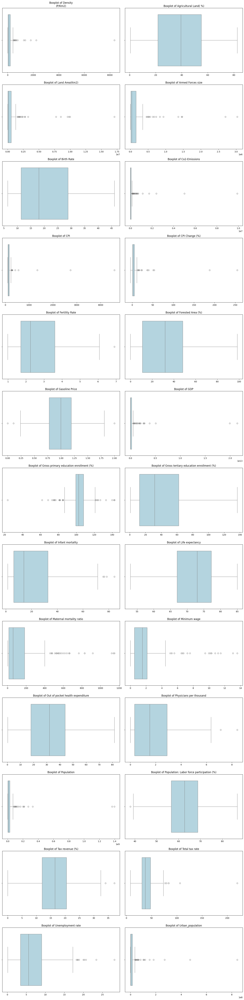

In [ ]:
#Boxplot
numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns
cols=2
rows=(len(numeric_cols)+1) // cols
fig,axes = plt.subplots(rows,cols,figsize=(16,rows*5))
axes=axes.flatten()

for i, col in enumerate(numeric_cols):
  if col in numeric_cols:
    sns.boxplot(x=df[col],ax=axes[i],color='lightblue')
    axes[i].set_title(f'Boxplot of {col}')
    axes[i].set_xlabel('')
for j in range(i + 1,len(axes)):
  fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

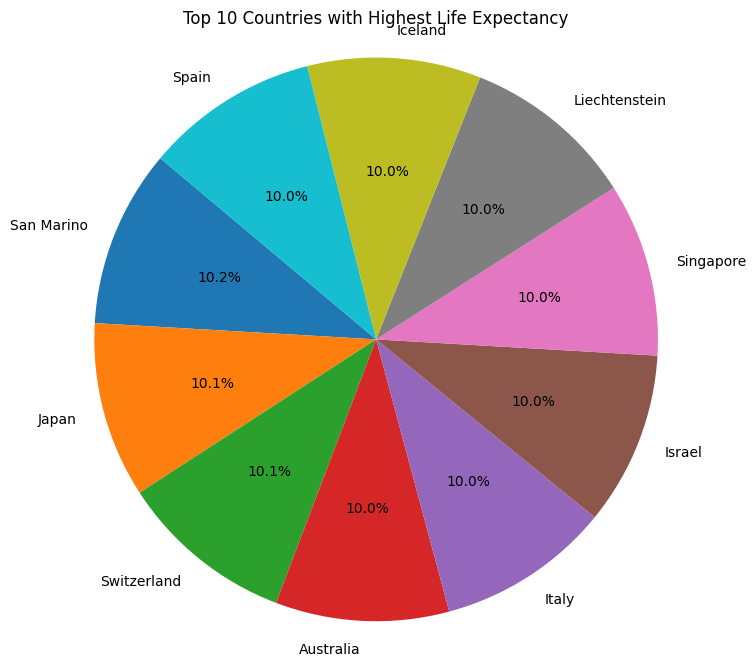

In [ ]:
country_life=df[['Country','Life expectancy']].sort_values(by='Life expectancy', ascending=False)
top10 = country_life.head(10)

plt.figure(figsize=(8,8))
plt.pie(top10['Life expectancy'], labels=top10['Country'], autopct='%1.1f%%', startangle=140)
plt.title('Top 10 Countries with Highest Life Expectancy')
plt.axis('equal')
plt.show()

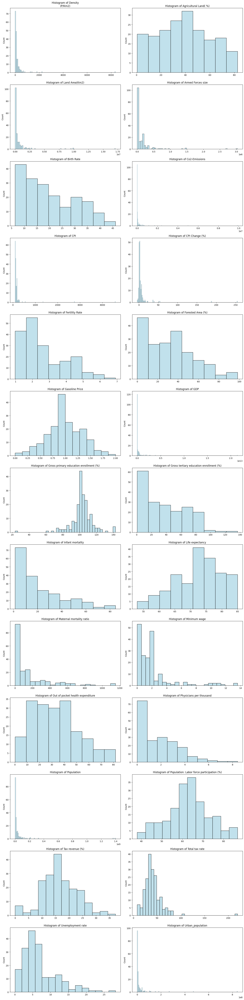

In [ ]:
#Histogram
numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns
cols=2
rows=(len(numeric_cols)+1) // cols
fig,axes = plt.subplots(rows,cols,figsize=(16,rows*5))
axes=axes.flatten()

for i, col in enumerate(numeric_cols):
  if col in numeric_cols:
    sns.histplot(x=df[col],ax=axes[i],color='lightblue')
    axes[i].set_title(f'Histogram of {col}')
    axes[i].set_xlabel('')
for j in range(i + 1,len(axes)):
  fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

/tmp/ipython-input-1360554196.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=corr_sorted.values, y=corr_sorted.index, palette='coolwarm')


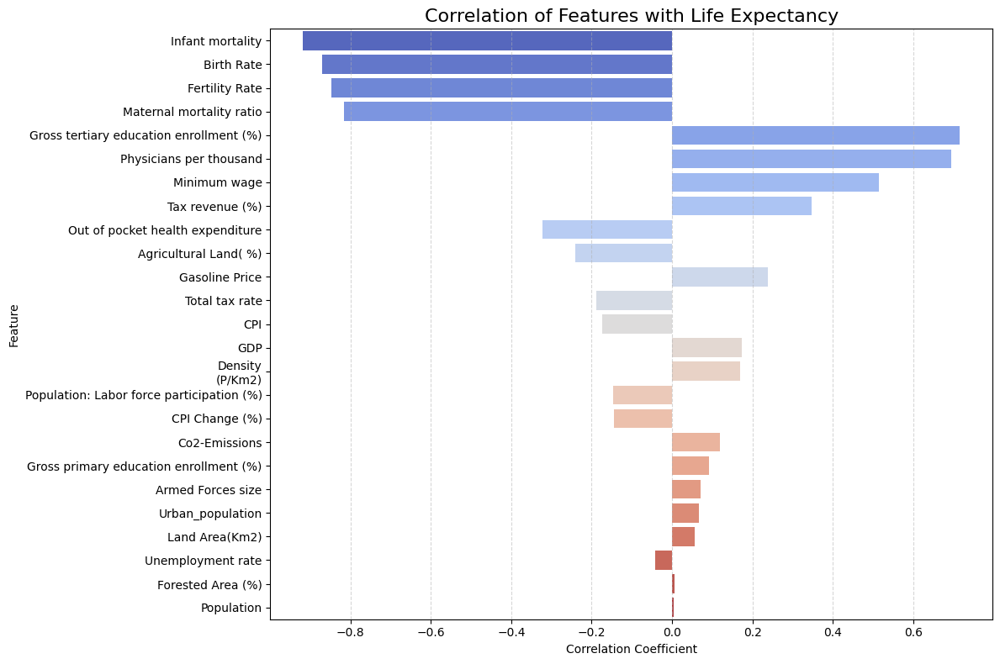

In [ ]:
#Bar plot
numeric_df = df.select_dtypes(include=['int64', 'float64'])

corr_life = numeric_df.corr()['Life expectancy'].drop('Life expectancy')

corr_sorted = corr_life.reindex(corr_life.abs().sort_values(ascending=False).index)

plt.figure(figsize=(12, 8))
sns.barplot(x=corr_sorted.values, y=corr_sorted.index, palette='coolwarm')
plt.title('Correlation of Features with Life Expectancy', fontsize=16)
plt.xlabel('Correlation Coefficient')
plt.ylabel('Feature')
plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


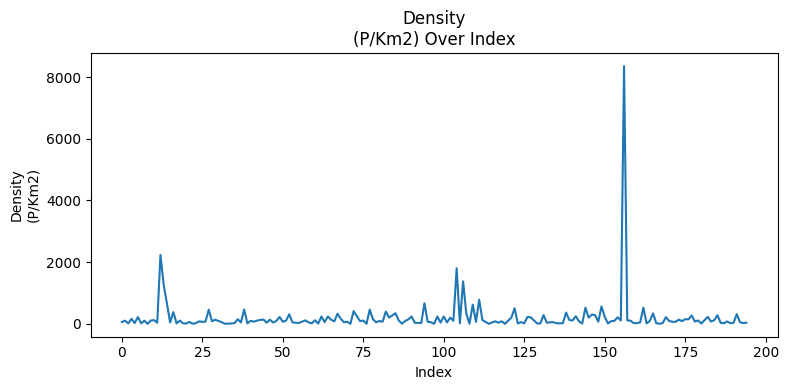

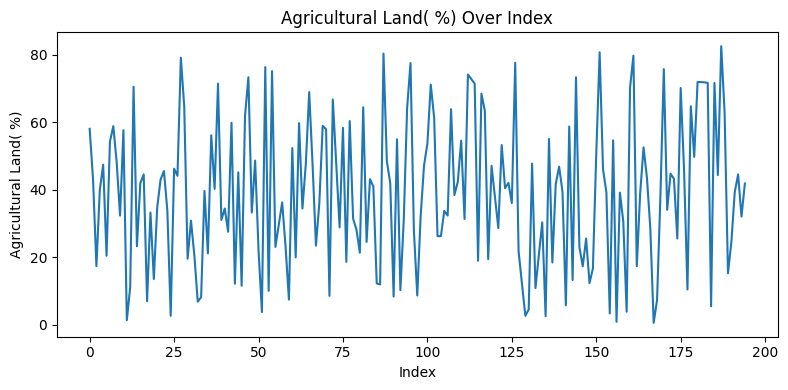

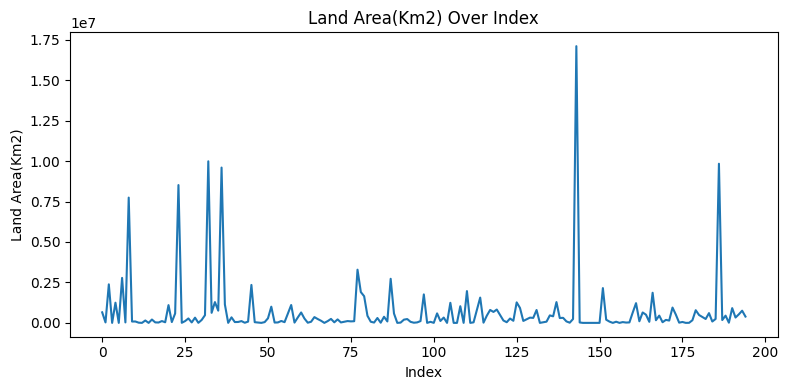

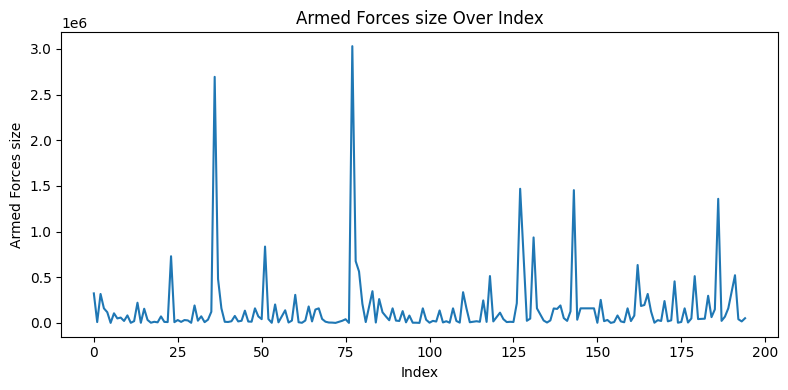

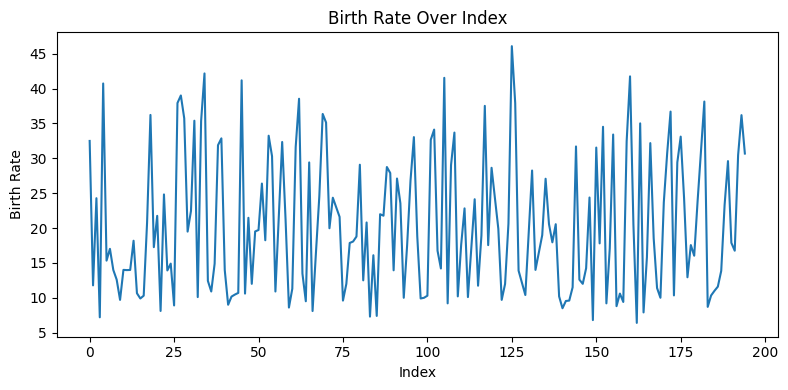

...

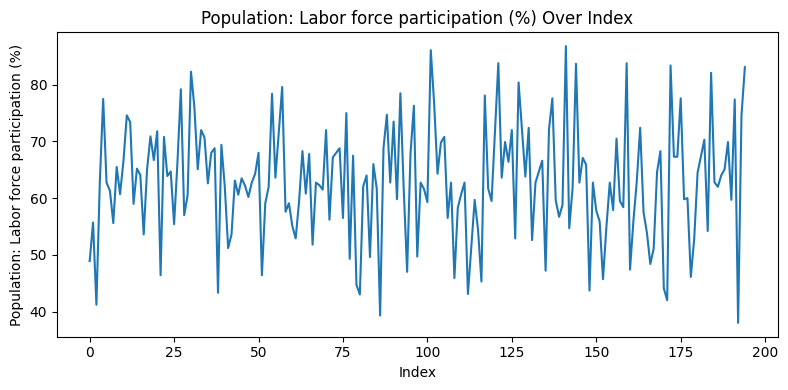

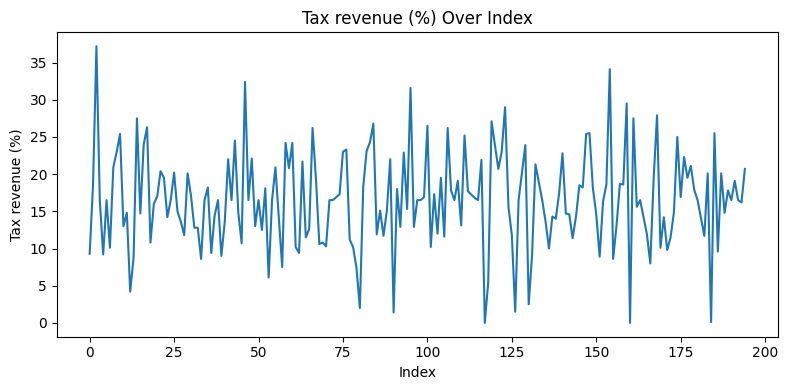

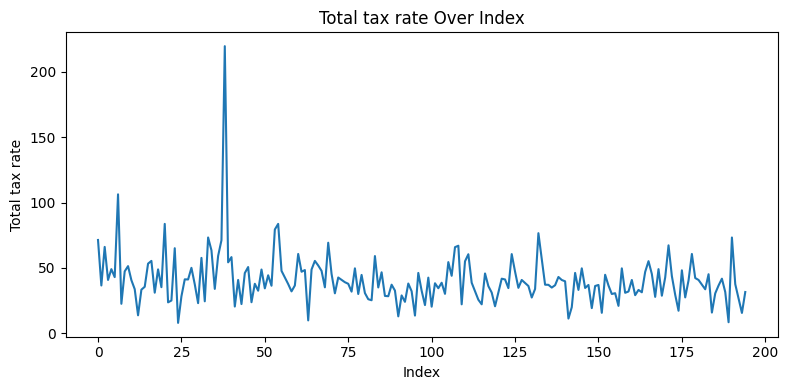

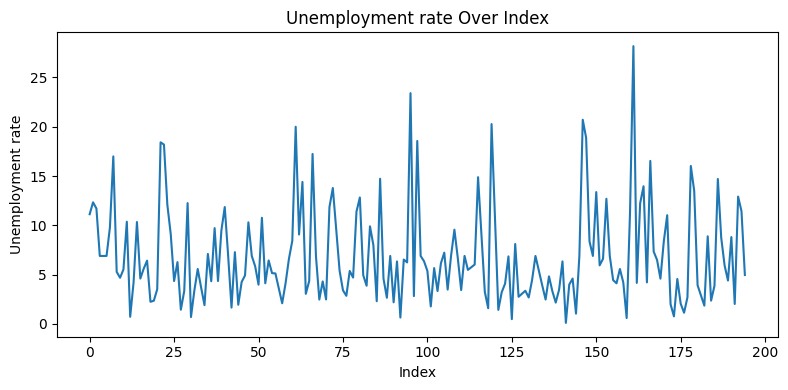

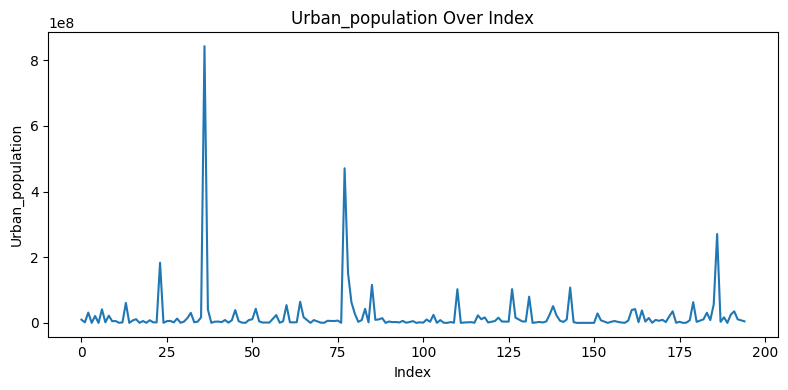

In [ ]:
#Line plot

features = df.select_dtypes(include=['int64','float64']).columns

for col in features:
    plt.figure(figsize=(8, 4))
    sns.lineplot(x=df.index, y=df[col])
    plt.title(f'{col} Over Index')
    plt.xlabel("Index")
    plt.ylabel(col)
    plt.tight_layout()
    plt.show()

/tmp/ipython-input-3567954314.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=column, data=df, ax=axes[i], palette='viridis')
/tmp/ipython-input-3567954314.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=column, data=df, ax=axes[i], palette='viridis')
/tmp/ipython-input-3567954314.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=column, data=df, ax=axes[i], palette='viridis')
/tmp/ipython-input-3567954314.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. 

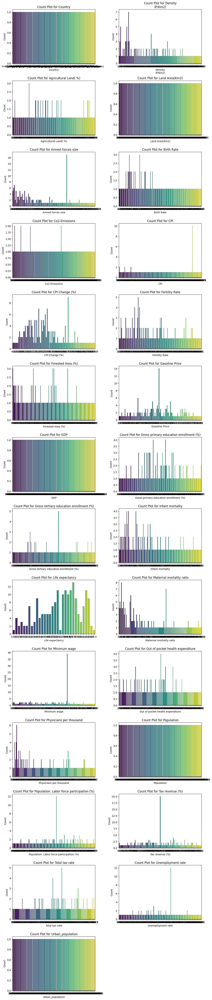

In [ ]:
#Count plot
num_columns = df.shape[1]
num_rows = (num_columns + 1) // 2

fig, axes = plt.subplots(nrows=num_rows, ncols=2, figsize=(12, num_rows * 4))

axes = axes.flatten()

for i, column in enumerate(df.columns):
    sns.countplot(x=column, data=df, ax=axes[i], palette='viridis')
    axes[i].set_title(f"Count Plot for {column}")
    axes[i].set_xlabel(column)
    axes[i].set_ylabel("Count")

if num_columns % 2 != 0:
    fig.delaxes(axes[-1])

plt.tight_layout()
plt.show()

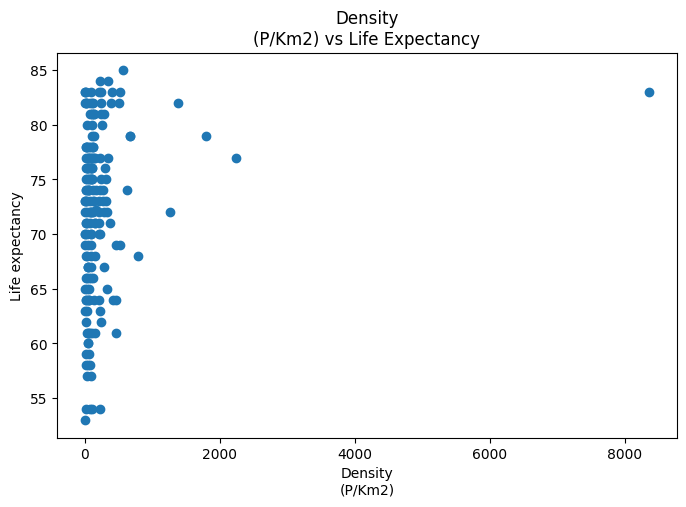

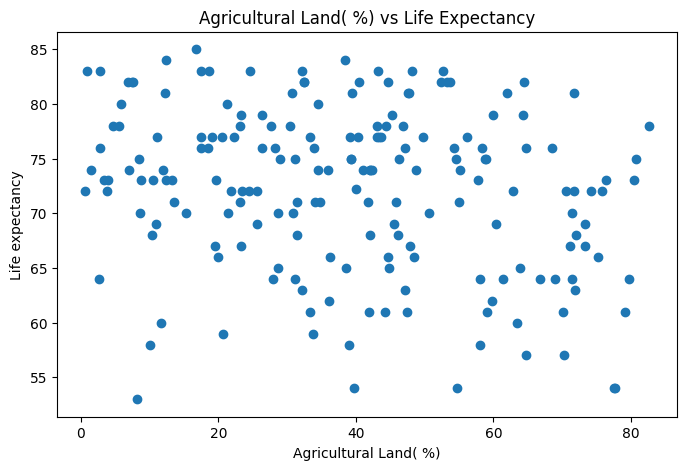

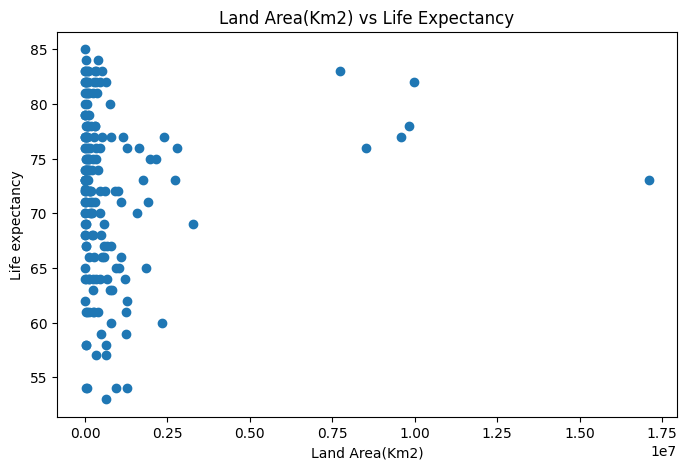

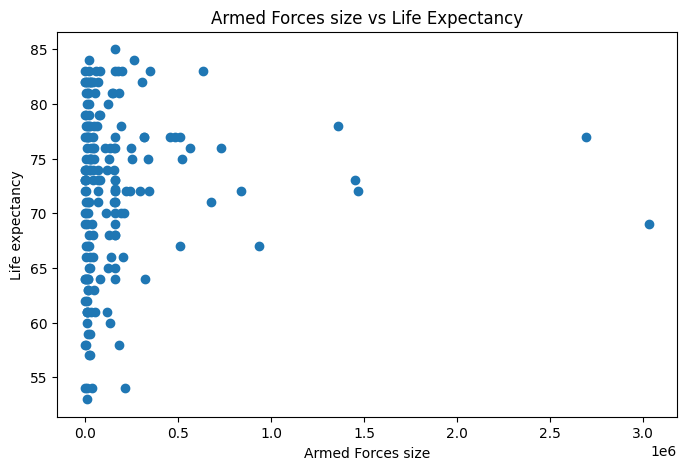

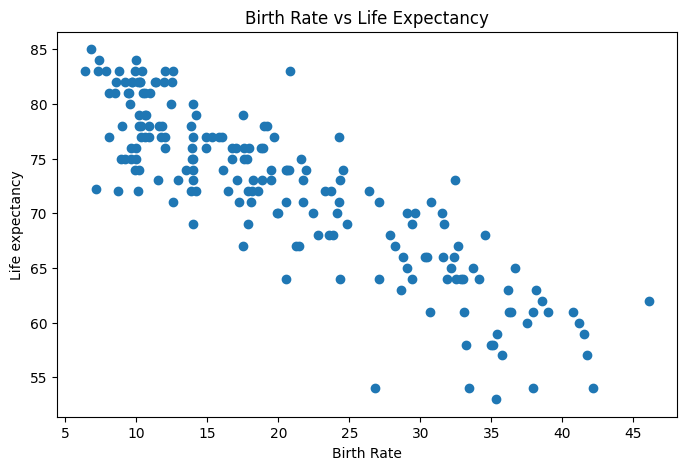

...

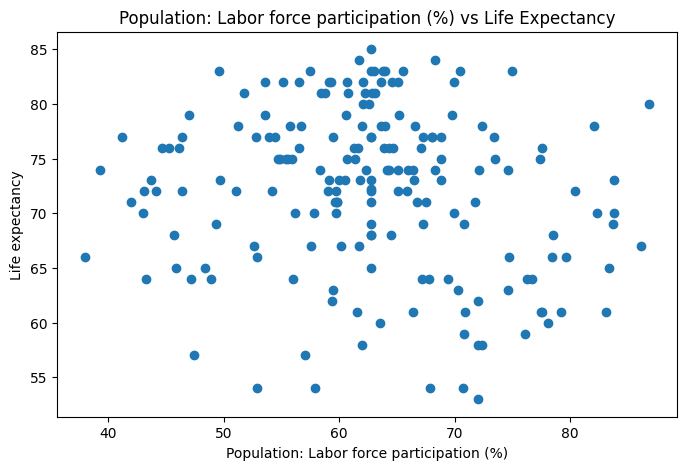

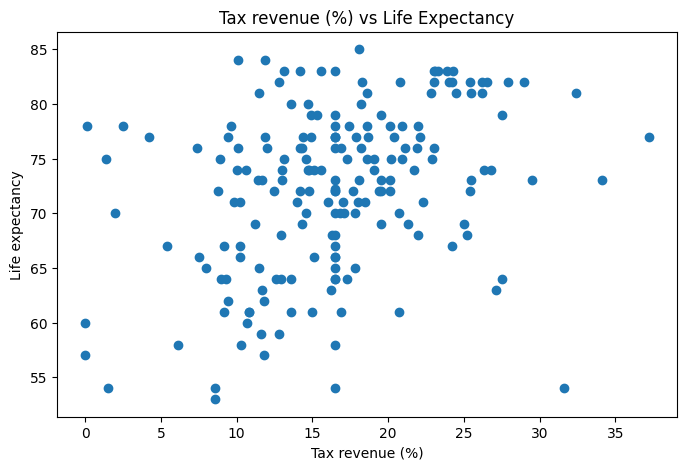

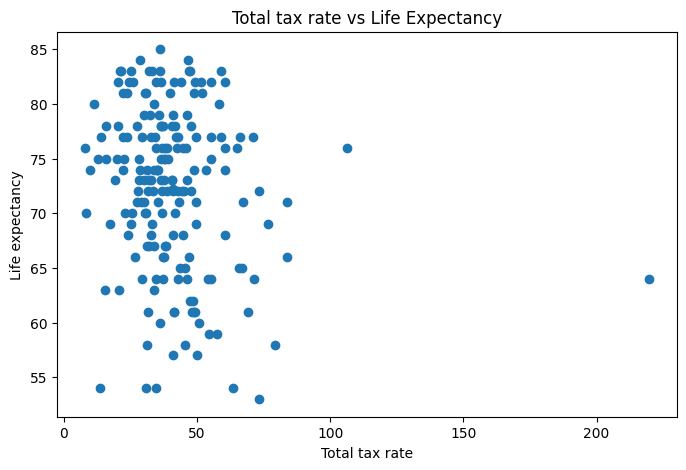

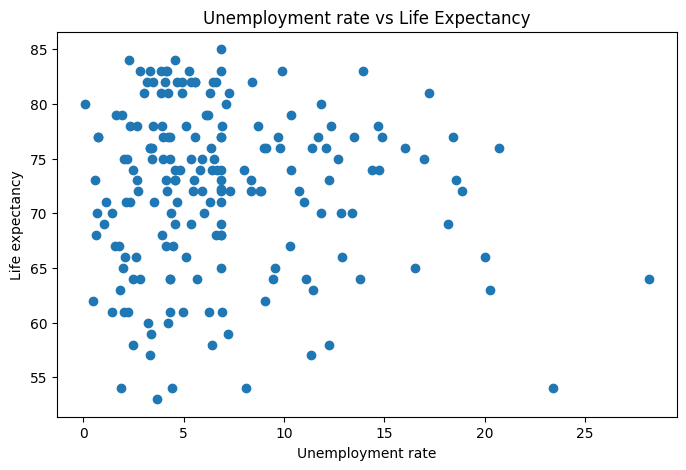

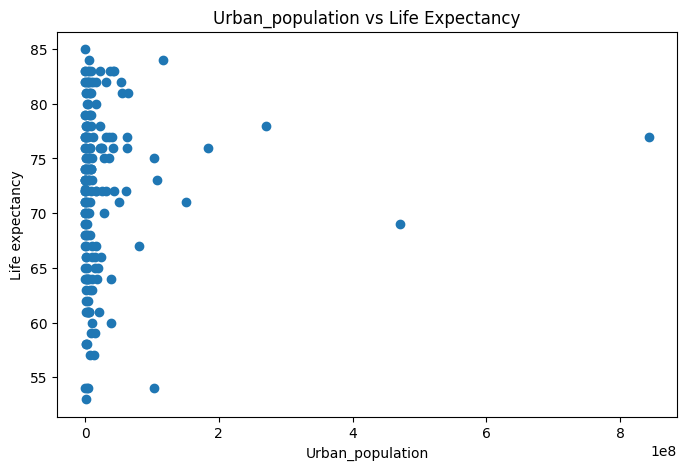

In [ ]:
#Scatter plot
x_cols = df.select_dtypes(include=['int64', 'float64']).columns.drop('Life expectancy')
y = df['Life expectancy']

for col in x_cols:
    plt.figure(figsize=(8, 5))
    plt.scatter(df[col], y)
    plt.xlabel(col)
    plt.ylabel('Life expectancy')
    plt.title(f'{col} vs Life Expectancy')
    plt.show()

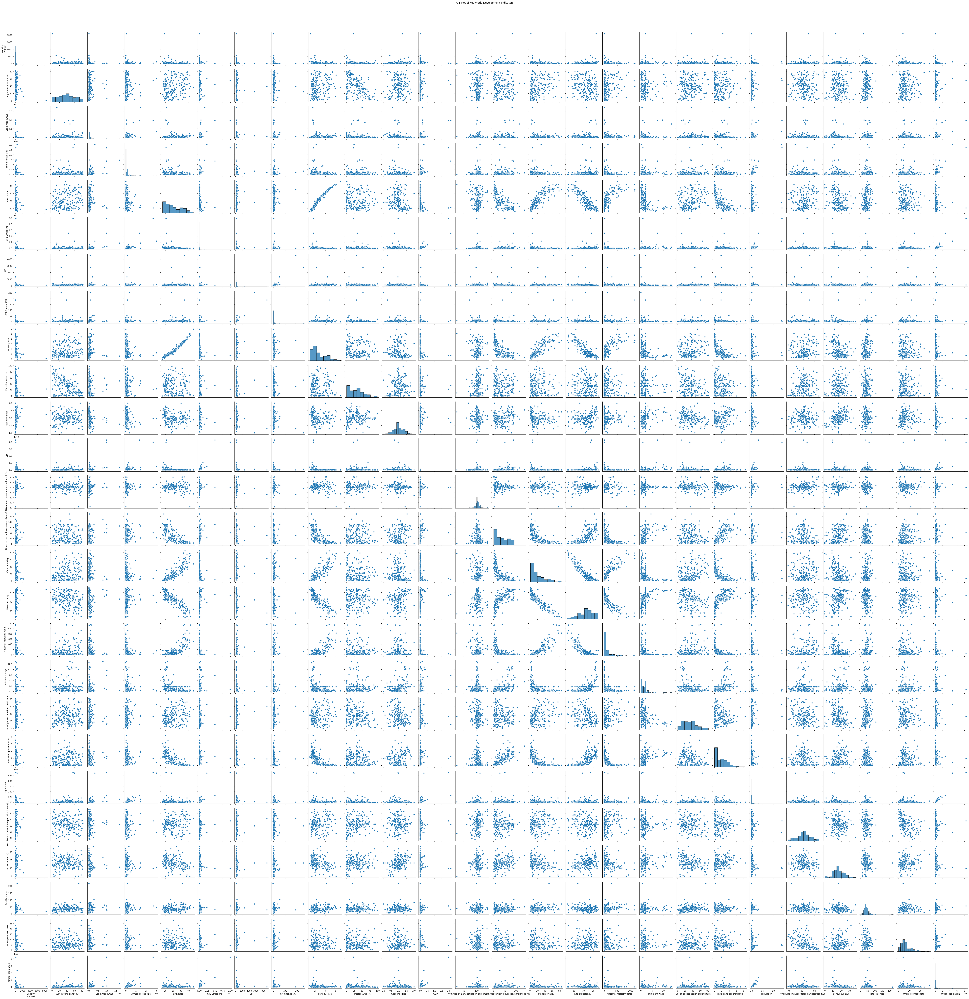

In [ ]:
#Pairplot
df_pair = df.select_dtypes(include=['int64', 'float64'])


sns.pairplot(df_pair)
plt.suptitle('Pair Plot of Key World Development Indicators', y=1.02)
plt.show()

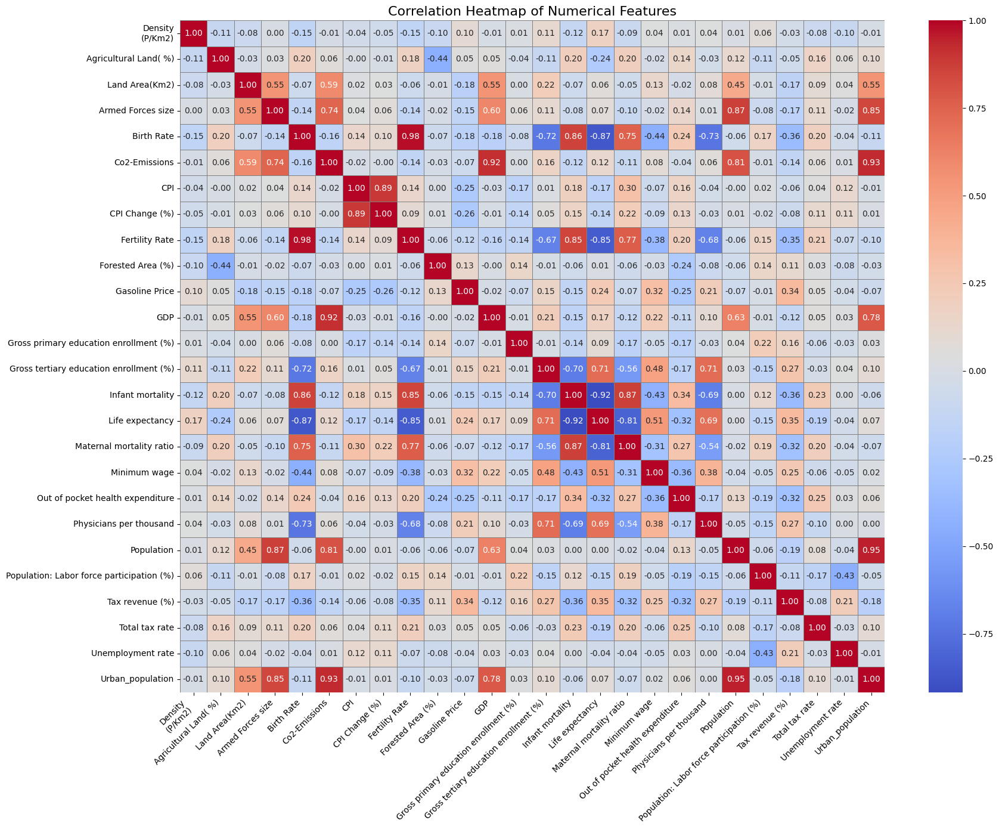

In [ ]:
#Heatmap
plt.figure(figsize=(18, 14))
sns.heatmap(
    numeric_df.corr(),
    annot=True,
    fmt=".2f",
    cmap='coolwarm',
    linewidths=0.5,
    linecolor='gray',
    annot_kws={"size": 10}
)
plt.title('Correlation Heatmap of Numerical Features', fontsize=16)
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()
plt.show()

# Linear Regression

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

In [ ]:
x = df.drop(['Life expectancy', 'Country'], axis=1)
y = df['Life expectancy']

In [ ]:
x

,Density\n(P/Km2),Agricultural Land( %),Land Area(Km2),Armed Forces size,Birth Rate,Co2-Emissions,CPI,CPI Change (%),Fertility Rate,Forested Area (%),Gasoline Price,GDP,Gross primary education enrollment (%),Gross tertiary education enrollment (%),Infant mortality,Maternal mortality ratio,Minimum wage,Out of pocket health expenditure,Physicians per thousand,Population,Population: Labor force participation (%),Tax revenue (%),Total tax rate,Unemployment rate,Urban_population
0,60.0,58.1,652230.0,323000.000000,32.49,8672.0,149.900000,2.300000,4.47,2.1,0.70,1.910135e+10,104.0,9.700000,47.9,638.000000,0.430000,78.4,0.28,38041754.0,48.900000,9.300000,71.400000,11.120000,9797273.0
1,105.0,43.1,28748.0,9000.000000,11.78,4536.0,119.050000,1.400000,1.62,28.1,1.36,1.527808e+10,107.0,55.000000,7.8,15.000000,1.120000,56.9,1.20,2854191.0,55.700000,18.600000,36.600000,12.330000,1747593.0
2,18.0,17.4,2381741.0,317000.000000,24.28,150006.0,151.360000,2.000000,3.02,0.8,0.28,1.699882e+11,109.9,51.400000,20.1,112.000000,0.950000,28.1,1.72,43053054.0,41.200000,37.200000,66.100000,11.700000,31510100.0
3,164.0,40.0,468.0,159274.853801,7.20,469.0,190.460955,6.722346,1.27,34.0,1.51,3.154058e+09,106.4,37.963388,2.7,160.392265,6.630000,36.4,3.33,77142.0,62.738068,16.502381,40.822404,6.886364,67873.0
4,26.0,47.5,1246700.0,117000.000000,40.73,34693.0,261.730000,17.100000,5.52,46.3,0.97,9.463542e+10,113.5,9.300000,51.6,241.000000,0.710000,33.4,0.21,31825295.0,77.500000,9.200000,49.100000,6.890000,21061025.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
190,32.0,24.5,912050.0,343000.000000,17.88,164175.0,2740.270000,254.900000,2.27,52.7,0.00,4.823593e+11,97.2,79.300000,21.4,125.000000,0.010000,45.8,1.92,28515829.0,59.700000,16.502381,73.300000,8.800000,25162368.0
191,314.0,39.3,331210.0,522000.000000,16.75,192668.0,163.520000,2.800000,2.05,48.1,0.80,2.619212e+11,110.6,28.500000,16.5,43.000000,0.730000,43.5,0.82,96462106.0,77.400000,19.100000,37.600000,2.010000,35332140.0
192,56.0,44.6,527968.0,40000.000000,30.45,10609.0,157.580000,8.100000,3.79,1.0,0.92,2.691440e+10,93.6,10.200000,42.9,164.000000,2.130201,81.0,0.31,29161922.0,38.000000,16.502381,26.600000,12.910000,10869523.0
193,25.0,32.1,752618.0,16000.000000,36.19,5141.0,212.310000,9.200000,4.63,65.2,1.40,2.306472e+10,98.7,4.100000,40.4,213.000000,0.240000,27.5,1.19,17861030.0,74.600000,16.200000,15.600000,11.430000,7871713.0


In [ ]:
y

,Life expectancy
0,64.000000
1,78.000000
2,77.000000
3,72.235294
4,61.000000
...,...
190,72.000000
191,75.000000
192,66.000000
193,63.000000


In [ ]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size= .3, random_state= 52)

In [ ]:
x_train

,Density\n(P/Km2),Agricultural Land( %),Land Area(Km2),Armed Forces size,Birth Rate,Co2-Emissions,CPI,CPI Change (%),Fertility Rate,Forested Area (%),Gasoline Price,GDP,Gross primary education enrollment (%),Gross tertiary education enrollment (%),Infant mortality,Maternal mortality ratio,Minimum wage,Out of pocket health expenditure,Physicians per thousand,Population,Population: Labor force participation (%),Tax revenue (%),Total tax rate,Unemployment rate,Urban_population
77,464.0,60.4,3287263.0,3031000.0,17.86,2407672.0,180.44,7.7,2.22,23.8,0.970000,2.611000e+12,113.0,28.1,29.9,145.0,0.30,65.1,0.86,1.366418e+09,49.300000,11.2,49.7,5.360000,471031528.0
143,9.0,13.3,17098240.0,1454000.0,11.50,1732027.0,180.75,4.5,1.57,49.8,0.590000,1.699877e+12,102.6,81.9,6.1,17.0,0.53,36.4,4.01,1.443735e+08,61.800000,11.4,46.2,4.590000,107683889.0
106,1380.0,32.4,316.0,2000.0,9.20,1342.0,113.45,1.6,1.23,1.1,1.360000,1.478616e+10,105.0,54.3,6.1,6.0,5.07,37.1,2.86,5.026530e+05,56.500000,26.2,44.0,3.470000,475902.0
68,167.0,36.0,108889.0,43000.0,24.56,16777.0,142.92,3.7,2.87,32.7,0.790000,7.671039e+10,101.9,21.8,22.1,95.0,1.60,55.8,0.35,1.660403e+07,62.300000,10.6,35.2,2.460000,8540945.0
154,214.0,3.4,455.0,0.0,17.10,605.0,129.96,1.8,2.41,88.4,0.996724,1.698843e+09,100.4,17.1,12.4,53.0,2.00,2.5,0.95,9.762500e+04,62.738068,34.1,30.1,6.886364,55762.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
88,94.0,48.5,580367.0,29000.0,28.75,17910.0,180.51,4.7,3.49,7.8,0.950000,9.550309e+10,103.2,11.5,30.6,342.0,0.25,33.4,0.16,5.257397e+07,74.700000,15.1,37.2,2.640000,14461523.0
157,114.0,39.2,49035.0,16000.0,10.60,32424.0,115.34,2.7,1.52,40.4,1.320000,1.054223e+11,98.7,46.6,4.6,5.0,3.11,18.4,3.42,5.454073e+06,59.500000,18.7,49.7,5.560000,2930419.0
13,1265.0,70.6,148460.0,221000.0,18.18,84246.0,179.68,5.6,2.04,11.0,1.120000,3.025713e+11,116.5,20.6,25.1,173.0,0.51,71.8,0.58,1.673108e+08,59.000000,8.8,33.4,4.190000,60987417.0
11,39.0,1.4,13880.0,1000.0,13.97,1786.0,116.22,2.5,1.75,51.4,0.920000,1.282700e+10,81.4,15.1,8.3,70.0,5.25,27.8,1.94,3.894820e+05,74.600000,14.8,33.8,10.360000,323784.0


In [ ]:
model = LinearRegression()

In [ ]:
model.fit(x_train, y_train)

LinearRegression()

In [ ]:
y_pred = model.predict(x_test)

In [ ]:
linear = pd.DataFrame({'Predicted':y_pred,'Actual':y_test})

In [ ]:
linear

,Predicted,Actual
96,59.417054,64.000000
104,79.741018,79.000000
83,80.897629,83.000000
148,71.966048,73.000000
190,62.489733,72.000000
57,64.883390,66.000000
40,76.191511,80.000000
130,78.181762,78.000000
81,81.613862,82.000000
23,77.551458,76.000000


In [ ]:
from sklearn.metrics import r2_score
r2_score(y_test,y_pred)

0.8594913941375056

In [ ]:
from sklearn.metrics import mean_absolute_error
mean_absolute_error(y_test,y_pred)

2.1213627119390774

In [ ]:
from sklearn.metrics import mean_squared_error
mean_squared_error(y_test,y_pred)

8.391438372630036

In [ ]:
from sklearn.metrics import mean_absolute_percentage_error
mean_absolute_percentage_error(y_test,y_pred)

0.03006563305163199

In [ ]:
model.coef_

array([ 6.66553115e-06, -3.60209394e-02, -9.12778756e-08, -6.89118495e-07,
       -2.13556735e-01, -1.84910371e-06,  1.88857506e-03, -4.78014536e-02,
       -8.97878667e-03, -3.50810608e-02,  2.83309050e+00,  1.25381838e-13,
        7.21706252e-03,  8.32930792e-03, -1.68596136e-01, -5.78145655e-03,
        2.53090549e-01, -6.08204370e-03,  6.86679764e-02, -8.87171359e-09,
       -1.85487881e-02, -8.10376326e-02,  7.65331478e-04, -9.76000586e-02,
        3.59975124e-08])

In [ ]:
model.intercept_

np.float64(82.33915227880776)

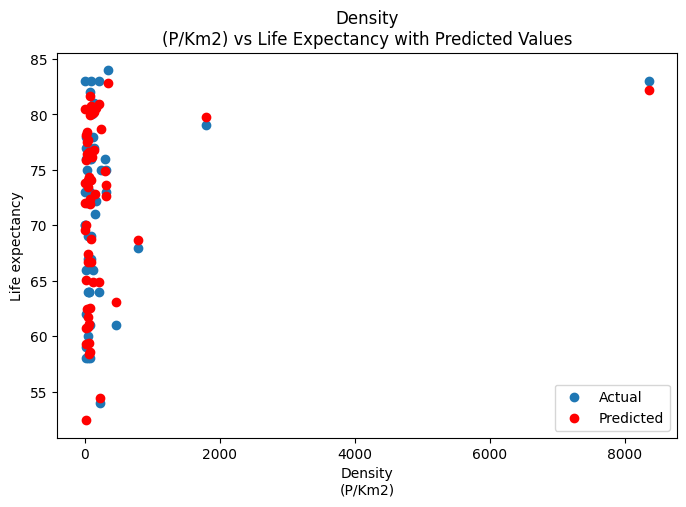

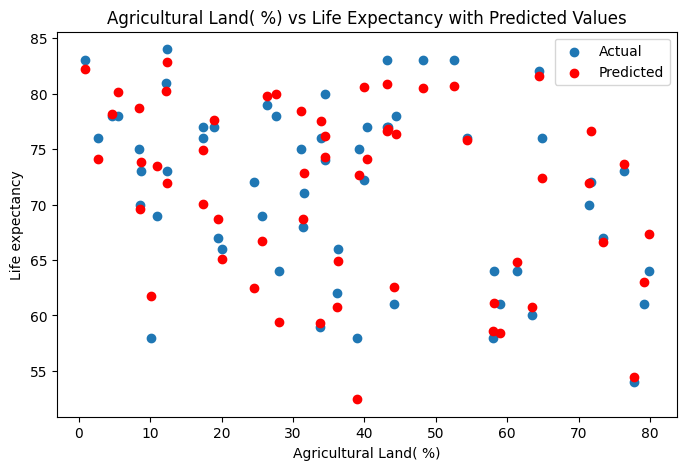

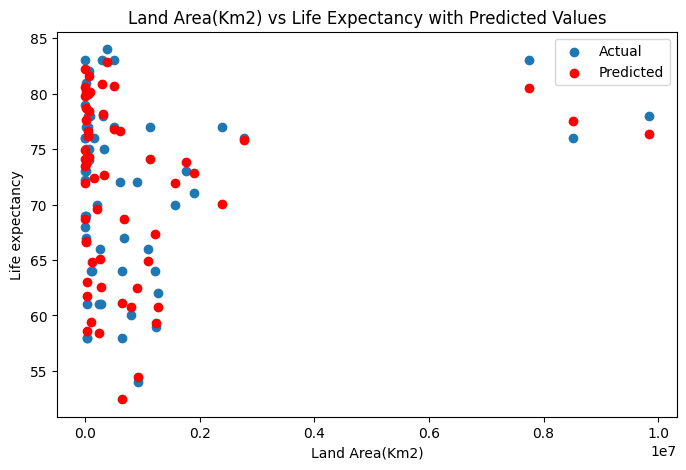

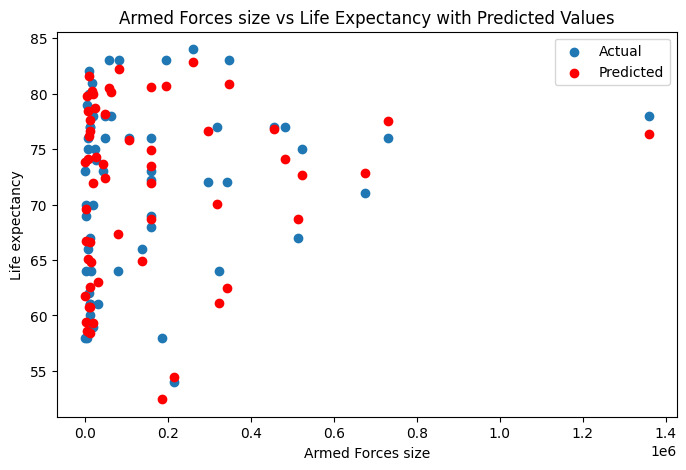

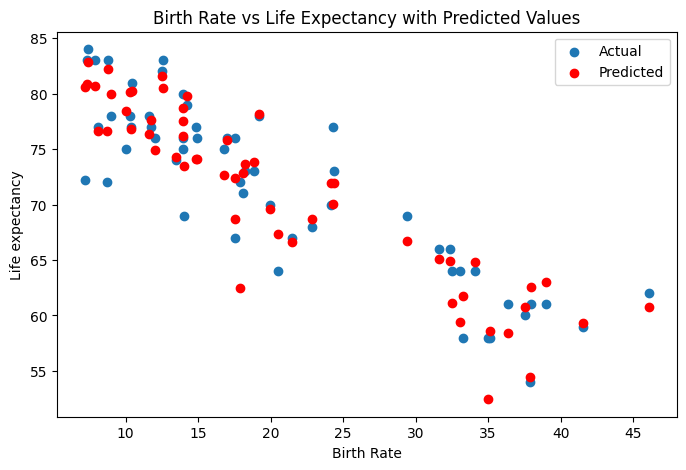

...

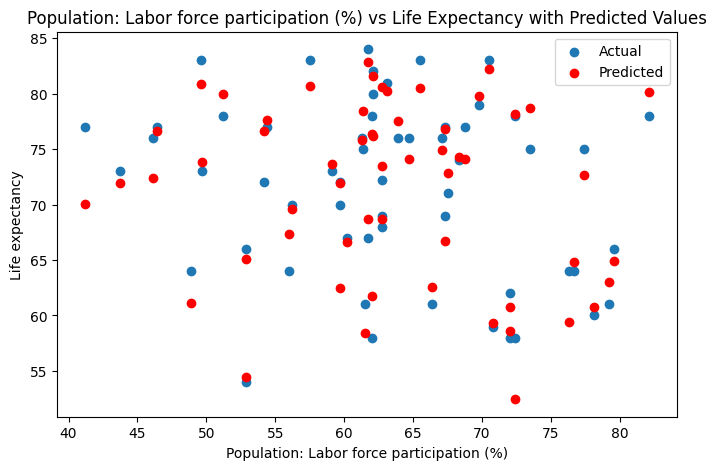

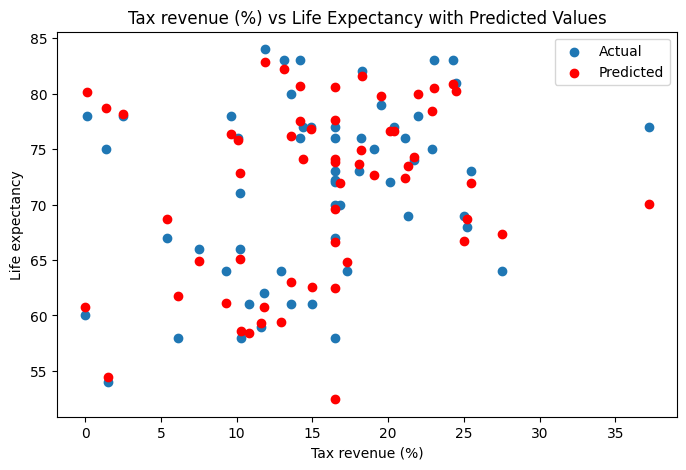

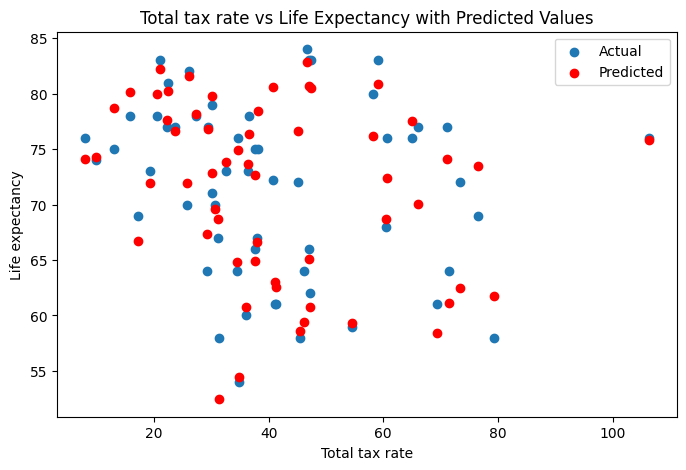

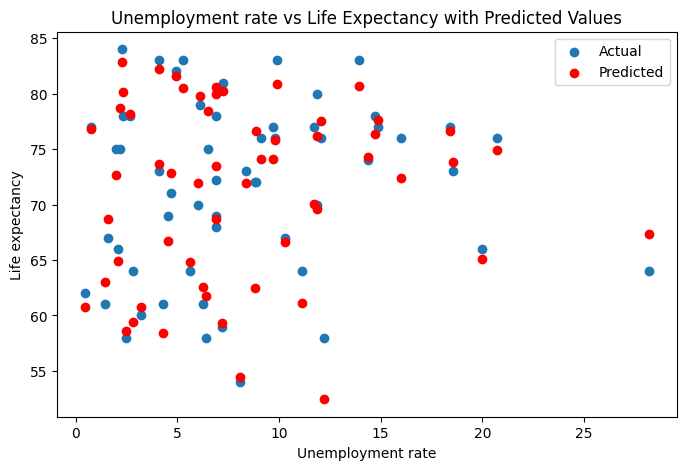

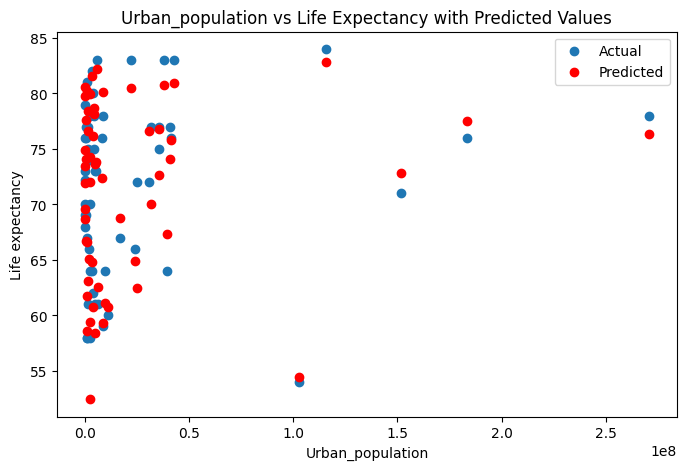

In [ ]:
# Plotting the Least Squares Line for each feature

# Get the list of feature names used in the model
feature_names = x.columns

for i, col in enumerate(feature_names):
    plt.figure(figsize=(8, 5))

    # Scatter plot of actual values
    plt.scatter(x_test[col], y_test, label='Actual')

    # Plot the predicted values
    # The predicted values (y_pred) are for the entire test set, so we plot them against the corresponding feature values
    plt.scatter(x_test[col], y_pred, color='red', label='Predicted')

    plt.xlabel(col)
    plt.ylabel('Life expectancy')
    plt.title(f'{col} vs Life Expectancy with Predicted Values')
    plt.legend()
    plt.show()

# Decision Tree Regressor

In [ ]:
from sklearn.tree import DecisionTreeRegressor

In [ ]:
model = DecisionTreeRegressor()

In [ ]:
model.fit(x_train, y_train)

DecisionTreeRegressor()

In [ ]:
y_pred = model.predict(x_test)

In [ ]:
y_pred

array([67., 78., 81., 70., 74., 65., 78., 73., 81., 75., 65., 59., 61.,
       79., 78., 79., 61., 69., 76., 67., 74., 75., 57., 80., 54., 77.,
       61., 54., 73., 71., 78., 77., 84., 79., 67., 57., 72., 75., 71.,
       77., 73., 83., 72., 74., 82., 65., 80., 81., 74., 77., 59., 54.,
       75., 75., 73., 72., 74.])

In [ ]:
dt = pd.DataFrame({'Predicted':y_pred,'Actual':y_test})
dt

,Predicted,Actual
96,67.0,64.000000
104,78.0,79.000000
83,81.0,83.000000
148,70.0,73.000000
190,74.0,72.000000
57,65.0,66.000000
40,78.0,80.000000
130,73.0,78.000000
81,81.0,82.000000
23,75.0,76.000000


In [ ]:
from sklearn.metrics import r2_score
r2_score(y_test,y_pred)

0.7412681721785935

In [ ]:
from sklearn import metrics
metrics.mean_absolute_error(y_test,y_pred)

3.0835913312693495

In [ ]:
from sklearn.metrics import mean_squared_error
mean_squared_error(y_test,y_pred)

15.45195167850422

In [ ]:
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
rmse

np.float64(3.930897057734305)

In [ ]:
from sklearn.metrics import mean_absolute_percentage_error
mape = mean_absolute_percentage_error(y_test, y_pred)
print(mape)
mape = mape * 100
mape

0.04434787003993597


4.434787003993597

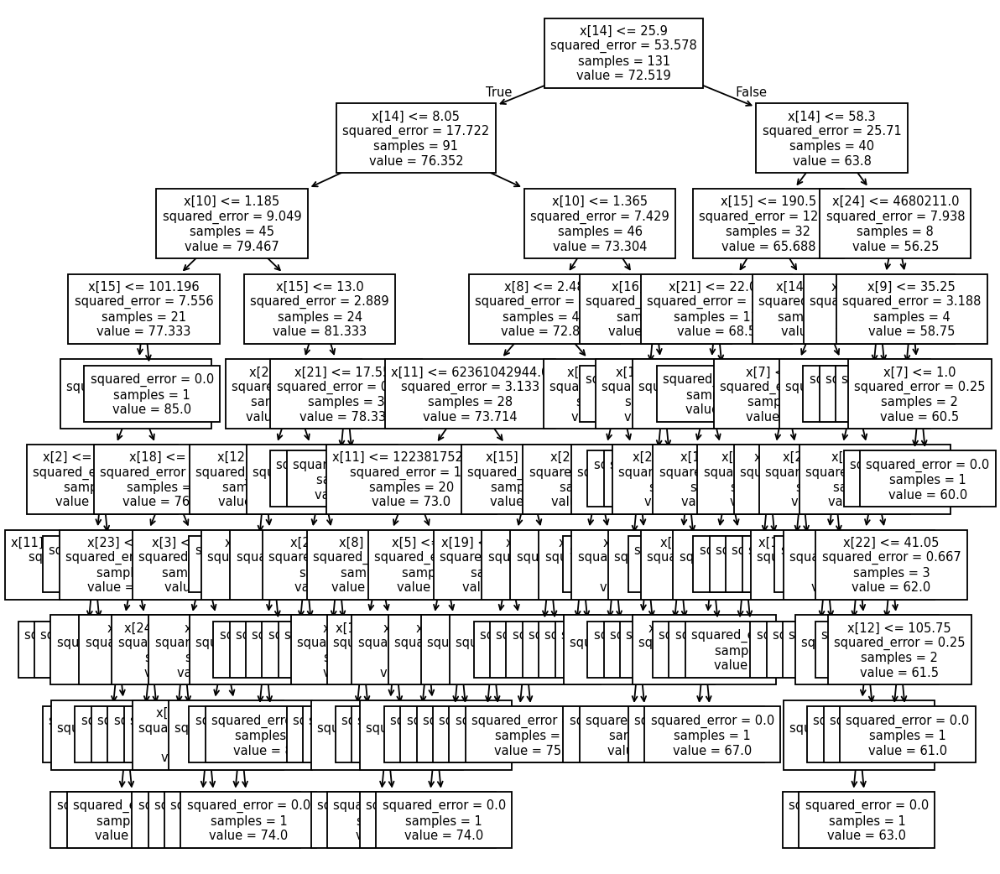

In [ ]:
from sklearn.tree import plot_tree
plt.figure(figsize=(10, 10), dpi=132)
plot_tree(model, fontsize=8)
plt.show()

In [ ]:
help(DecisionTreeRegressor)

Help on class DecisionTreeRegressor in module sklearn.tree._classes:

class DecisionTreeRegressor(sklearn.base.RegressorMixin, BaseDecisionTree)
 |  DecisionTreeRegressor(*, criterion='squared_error', splitter='best', max_depth=None, min_samples_split=2, min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_features=None, random_state=None, max_leaf_nodes=None, min_impurity_decrease=0.0, ccp_alpha=0.0, monotonic_cst=None)
 |
 |  A decision tree regressor.
 |
 |  Read more in the :ref:`User Guide <tree>`.
 |
 |  Parameters
 |  ----------
 |  criterion : {"squared_error", "friedman_mse", "absolute_error",             "poisson"}, default="squared_error"
 |      The function to measure the quality of a split. Supported criteria
 |      are "squared_error" for the mean squared error, which is equal to
 |      variance reduction as feature selection criterion and minimizes the L2
 |      loss using the mean of each terminal node, "friedman_mse", which uses
 |      mean squared error with Fri

**Decision Tree Regressor Parameter**

In [ ]:
# Create Decision Tree Regressor object
clf = DecisionTreeRegressor(criterion="absolute_error", max_depth=3) # 'absolute_error', 'poisson', 'squared_error', 'friedman_mse'

# Train Decision Tree Regressor
clf = clf.fit(x_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(x_test)

In [ ]:
r2_score(y_test,y_pred)

0.864435408596518

In [ ]:
metrics.mean_absolute_error(y_test,y_pred)

2.2853457172342617

In [ ]:
mean_squared_error(y_test,y_pred)

8.09617252473745

In [ ]:
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
rmse

np.float64(2.845377395836526)

In [ ]:
mape = mean_absolute_percentage_error(y_test, y_pred)
print(mape)
mape = mape * 100
mape

0.03310995867443666


3.310995867443666

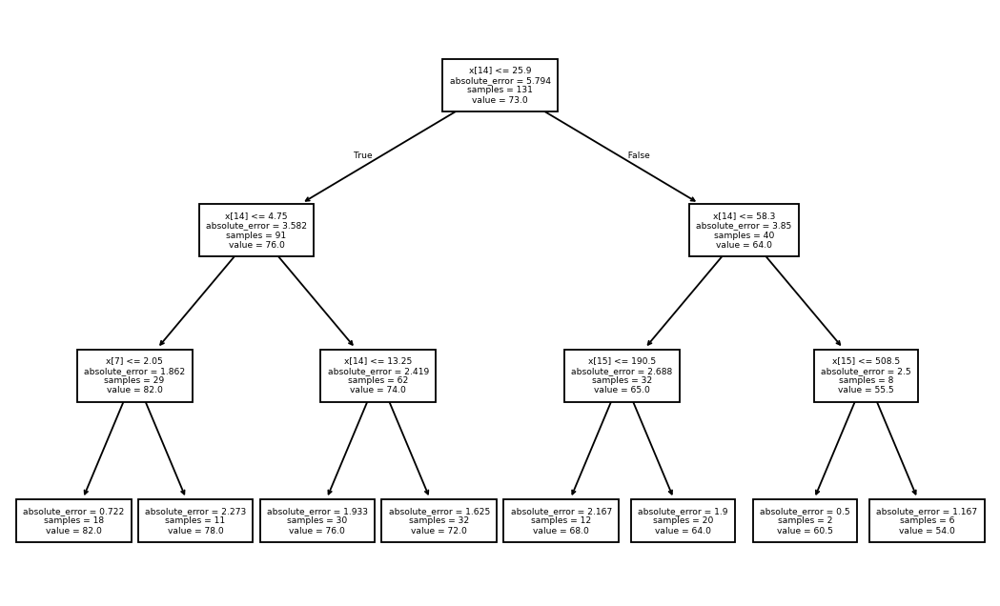

In [ ]:
plt.figure(figsize=(10, 6), dpi=132)
plot_tree(clf, fontsize=5)
plt.show()

# Random Forest Regressor

In [ ]:
from sklearn.ensemble import RandomForestRegressor

In [ ]:
help(RandomForestRegressor)

Help on class RandomForestRegressor in module sklearn.ensemble._forest:

class RandomForestRegressor(ForestRegressor)
 |  RandomForestRegressor(n_estimators=100, *, criterion='squared_error', max_depth=None, min_samples_split=2, min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_features=1.0, max_leaf_nodes=None, min_impurity_decrease=0.0, bootstrap=True, oob_score=False, n_jobs=None, random_state=None, verbose=0, warm_start=False, ccp_alpha=0.0, max_samples=None, monotonic_cst=None)
 |
 |  A random forest regressor.
 |
 |  A random forest is a meta estimator that fits a number of decision tree
 |  regressors on various sub-samples of the dataset and uses averaging to
 |  improve the predictive accuracy and control over-fitting.
 |  Trees in the forest use the best split strategy, i.e. equivalent to passing
 |  `splitter="best"` to the underlying :class:`~sklearn.tree.DecisionTreeRegressor`.
 |  The sub-sample size is controlled with the `max_samples` parameter if
 |  `bootstrap=Tru

In [ ]:
model = RandomForestRegressor()

In [ ]:
model.fit(x_train, y_train)

RandomForestRegressor()

In [ ]:
y_pred = model.predict(x_test)

In [ ]:
y_pred

array([60.28, 78.93, 81.01, 71.16, 73.27, 63.96, 76.  , 74.88, 81.51,
       74.91, 66.81, 63.59, 66.23, 80.19, 79.03, 79.14, 59.99, 65.76,
       73.96, 63.88, 72.95, 79.02, 58.86, 77.68, 56.58, 69.66, 62.16,
       60.31, 75.27, 72.6 , 76.9 , 78.08, 81.08, 77.43, 62.52, 57.2 ,
       71.04, 75.42, 74.98, 66.89, 74.76, 81.85, 70.53, 75.44, 76.85,
       62.33, 77.88, 80.81, 74.86, 80.74, 62.52, 55.94, 75.1 , 74.78,
       72.76, 73.37, 73.05])

In [ ]:
dt = pd.DataFrame({'Predicted':y_pred,'Actual':y_test})
dt

,Predicted,Actual
96,60.28,64.000000
104,78.93,79.000000
83,81.01,83.000000
148,71.16,73.000000
190,73.27,72.000000
57,63.96,66.000000
40,76.00,80.000000
130,74.88,78.000000
81,81.51,82.000000
23,74.91,76.000000


In [ ]:
from sklearn.metrics import r2_score
r2_score(y_test,y_pred)

0.8978475266759608

In [ ]:
from sklearn import metrics
metrics.mean_absolute_error(y_test,y_pred)

2.0104334365325083

In [ ]:
from sklearn.metrics import mean_squared_error
mean_squared_error(y_test,y_pred)

6.100737953014026

In [ ]:
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
rmse

np.float64(2.4699671967485775)

In [ ]:
from sklearn.metrics import mean_absolute_percentage_error
mape = mean_absolute_percentage_error(y_test, y_pred)
print(mape)
mape = mape * 100
mape

0.028604649593481687


2.860464959348169

**Random Forest Resgressor Parameter**

In [ ]:
# Create Random Forest Regressor object
clf = RandomForestRegressor(n_estimators=100, criterion="poisson", max_depth=15, bootstrap=True) # 'absolute_error', 'poisson', 'squared_error', 'friedman_mse'

# Train Random Forest Regressor
clf = clf.fit(x_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(x_test)

In [ ]:
r2_score(y_test,y_pred)

0.8915927876049652

In [ ]:
metrics.mean_absolute_error(y_test,y_pred)

2.018328173374612

In [ ]:
mean_squared_error(y_test,y_pred)

6.474282741455711

In [ ]:
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
rmse

np.float64(2.544461188828729)

In [ ]:
mape = mean_absolute_percentage_error(y_test, y_pred)
print(mape)
mape = mape * 100
mape

0.02877499989666529


2.877499989666529

# Bagging Regressor

In [ ]:
from sklearn.ensemble import BaggingRegressor

In [ ]:
model = BaggingRegressor()

In [ ]:
model.fit(x_train, y_train)

BaggingRegressor()

In [ ]:
y_pred = model.predict(x_test)

In [ ]:
y_pred

array([62.9, 79.8, 81.9, 71.6, 72.1, 65.9, 75.8, 74.8, 81.3, 75.1, 67.9,
       63.9, 65.5, 79.5, 78.9, 79.6, 61.1, 65.2, 73.2, 63.9, 71.5, 78.7,
       58.3, 77.7, 56.2, 67.9, 60.5, 60.2, 76.5, 71.8, 78.9, 79.3, 81.1,
       76.7, 61.9, 56.7, 69.7, 75.6, 71.7, 65. , 74.6, 81.3, 69.6, 74.9,
       77.7, 63.1, 78.8, 80.8, 74.7, 79.6, 63. , 55.5, 75. , 75. , 73.4,
       73.4, 73.3])

In [ ]:
dt = pd.DataFrame({'Predicted':y_pred,'Actual':y_test})
dt

,Predicted,Actual
96,62.9,64.000000
104,79.8,79.000000
83,81.9,83.000000
148,71.6,73.000000
190,72.1,72.000000
57,65.9,66.000000
40,75.8,80.000000
130,74.8,78.000000
81,81.3,82.000000
23,75.1,76.000000


In [ ]:
from sklearn.metrics import r2_score
r2_score(y_test,y_pred)

0.8852608710476638

In [ ]:
from sklearn import metrics
metrics.mean_absolute_error(y_test,y_pred)

2.081836945304437

In [ ]:
from sklearn.metrics import mean_squared_error
mean_squared_error(y_test,y_pred)

6.852436714623931

In [ ]:
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
rmse

np.float64(2.6177159346697514)

In [ ]:
from sklearn.metrics import mean_absolute_percentage_error
mape = mean_absolute_percentage_error(y_test, y_pred)
print(mape)
mape = mape * 100
mape

0.02938013012606401


2.938013012606401

**Bagging Regressor Parameter**

In [ ]:
# Create Bagging Regressor object
from sklearn.tree import DecisionTreeRegressor
base_estimator = DecisionTreeRegressor(max_depth=18, random_state=42)
br = BaggingRegressor(estimator=base_estimator, n_estimators=20, bootstrap=True)

# Train Bagging Regressor
br = br.fit(x_train,y_train)

#Predict the response for test dataset
y_pred = br.predict(x_test)

In [ ]:
r2_score(y_test,y_pred)

0.8941339146182364

In [ ]:
metrics.mean_absolute_error(y_test,y_pred)

2.119556243550052

In [ ]:
mean_squared_error(y_test,y_pred)

6.322521853942818

In [ ]:
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
rmse

np.float64(2.5144625377887055)

In [ ]:
mape = mean_absolute_percentage_error(y_test, y_pred)
print(mape)
mape = mape * 100
mape

0.030339833861732075


3.0339833861732073

# Boosting Regressor

In [ ]:
from sklearn.ensemble import AdaBoostRegressor

In [ ]:
model = AdaBoostRegressor()

In [ ]:
model.fit(x_train, y_train)

AdaBoostRegressor()

In [ ]:
y_pred = model.predict(x_test)

In [ ]:
y_pred

array([61.46153846, 80.1       , 81.61363636, 70.94871795, 73.5       ,
       63.88461538, 76.1       , 76.07407407, 81.4       , 74.9122807 ,
       70.43478261, 63.75      , 65.85714286, 81.06521739, 77.40909091,
       80.26190476, 61.30769231, 65.78947368, 74.16666667, 64.72      ,
       72.75675676, 78.45945946, 58.84615385, 76.73333333, 56.        ,
       72.38461538, 62.57142857, 61.4375    , 75.5       , 72.54166667,
       77.35714286, 77.48148148, 81.92592593, 76.33333333, 63.40909091,
       56.25      , 72.12727273, 74.875     , 75.5       , 66.83870968,
       74.39285714, 82.0952381 , 69.54761905, 74.9122807 , 77.35714286,
       62.69230769, 77.36585366, 81.06521739, 74.875     , 81.61363636,
       61.52631579, 56.2       , 75.58823529, 73.8       , 72.35416667,
       73.8       , 73.75862069])

In [ ]:
dt = pd.DataFrame({'Predicted':y_pred,'Actual':y_test})
dt

,Predicted,Actual
96,61.461538,64.000000
104,80.100000,79.000000
83,81.613636,83.000000
148,70.948718,73.000000
190,73.500000,72.000000
57,63.884615,66.000000
40,76.100000,80.000000
130,76.074074,78.000000
81,81.400000,82.000000
23,74.912281,76.000000


In [ ]:
from sklearn.metrics import r2_score
r2_score(y_test,y_pred)

0.8768441495868781

In [ ]:
from sklearn import metrics
metrics.mean_absolute_error(y_test,y_pred)

2.116533916369299

In [ ]:
from sklearn.metrics import mean_squared_error
mean_squared_error(y_test,y_pred)

7.355099160132038

In [ ]:
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
rmse

np.float64(2.712028606068166)

In [ ]:
from sklearn.metrics import mean_absolute_percentage_error
mape = mean_absolute_percentage_error(y_test, y_pred)
print(mape)
mape = mape * 100
mape

0.03040232853333685


3.040232853333685

# GradientBoost Regressor

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor

In [ ]:
model = GradientBoostingRegressor()

In [ ]:
model.fit(x_train, y_train)

GradientBoostingRegressor()

In [ ]:
y_pred = model.predict(x_test)

In [ ]:
y_pred

array([58.82801008, 80.7636522 , 80.64149748, 70.47203743, 73.29666763,
       64.63639752, 76.55781832, 76.70638674, 81.76468472, 75.01656927,
       67.57491401, 62.9932902 , 66.05773077, 80.91317222, 76.58634236,
       78.1855034 , 60.07695424, 65.7813406 , 72.96320094, 64.46119072,
       73.53076358, 80.46151917, 56.93138575, 77.76848129, 56.28328182,
       69.86891433, 62.24816561, 61.72310284, 74.85601165, 72.58451937,
       77.68914542, 78.83662555, 80.99546887, 76.05062161, 62.56118717,
       56.92082089, 71.83812789, 75.24107418, 73.87560991, 66.2393806 ,
       75.56386126, 82.72431284, 70.4352686 , 74.8068544 , 76.66048959,
       61.76262225, 77.05276798, 81.01803694, 75.09840155, 80.58426842,
       60.77420913, 55.95843871, 74.34136334, 74.21719049, 71.81022133,
       74.02156206, 74.20037976])

In [ ]:
dt = pd.DataFrame({'Predicted':y_pred,'Actual':y_test})
dt

,Predicted,Actual
96,58.828010,64.000000
104,80.763652,79.000000
83,80.641497,83.000000
148,70.472037,73.000000
190,73.296668,72.000000
57,64.636398,66.000000
40,76.557818,80.000000
130,76.706387,78.000000
81,81.764685,82.000000
23,75.016569,76.000000


In [ ]:
from sklearn.metrics import r2_score
r2_score(y_test,y_pred)

0.8921093333793804

In [ ]:
from sklearn import metrics
metrics.mean_absolute_error(y_test,y_pred)

2.1347640460994386

In [ ]:
from sklearn.metrics import mean_squared_error
mean_squared_error(y_test,y_pred)

6.443433655693022

In [ ]:
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
rmse

np.float64(2.538391942882939)

In [ ]:
from sklearn.metrics import mean_absolute_percentage_error
mape = mean_absolute_percentage_error(y_test, y_pred)
print(mape)
mape = mape * 100
mape

0.03068137087377414


3.068137087377414

**GradientBoosting Regressor Parameter**

In [ ]:
# Create Boosting Regressor object
br = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, loss='absolute_error', criterion='squared_error',random_state=45) #'quantile', 'huber', 'absolute_error', 'squared_error'

# Train Boosting Regressor
br = br.fit(x_train,y_train)

#Predict the response for test dataset
y_pred = br.predict(x_test)

In [ ]:
r2_score(y_test,y_pred)

0.9004224894580184

In [ ]:
metrics.mean_absolute_error(y_test,y_pred)

1.9163726710073647

In [ ]:
mean_squared_error(y_test,y_pred)

5.946956329711903

In [ ]:
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
rmse

np.float64(2.438638212140518)

In [ ]:
mape = mean_absolute_percentage_error(y_test, y_pred)
print(mape)
mape = mape * 100
mape

0.02745295240114237


2.745295240114237

# XGBoost Regressor

In [ ]:
from xgboost import XGBRegressor

In [ ]:
model = XGBRegressor()

In [ ]:
model.fit(x_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...)

In [ ]:
y_pred = model.predict(x_test)

In [ ]:
y_pred

array([57.376255, 79.758896, 80.75917 , 70.90947 , 73.26724 , 64.265335,
       76.861244, 75.58224 , 80.87787 , 75.40265 , 67.656075, 62.249638,
       63.338375, 79.118546, 78.237144, 77.81314 , 56.77813 , 66.26415 ,
       71.83891 , 64.66364 , 71.81472 , 78.48878 , 57.395523, 76.54585 ,
       57.292873, 68.60328 , 62.39075 , 63.478325, 74.44239 , 71.40629 ,
       78.21338 , 79.0366  , 82.441345, 76.78293 , 61.93919 , 56.05729 ,
       70.457954, 75.325066, 73.883125, 67.45643 , 75.52611 , 83.05751 ,
       69.80194 , 75.283325, 75.674995, 59.799206, 77.2087  , 81.09871 ,
       75.57639 , 78.93709 , 63.502197, 57.050003, 75.261635, 74.57581 ,
       72.635735, 73.189   , 72.67932 ], dtype=float32)

In [ ]:
dt = pd.DataFrame({'Predicted':y_pred,'Actual':y_test})
dt

,Predicted,Actual
96,57.376255,64.000000
104,79.758896,79.000000
83,80.759171,83.000000
148,70.909470,73.000000
190,73.267242,72.000000
57,64.265335,66.000000
40,76.861244,80.000000
130,75.582237,78.000000
81,80.877869,82.000000
23,75.402649,76.000000


In [ ]:
from sklearn.metrics import r2_score
r2_score(y_test,y_pred)

0.8831482189407384

In [ ]:
from sklearn import metrics
metrics.mean_absolute_error(y_test,y_pred)

2.1318299182305274

In [ ]:
from sklearn.metrics import mean_squared_error
mean_squared_error(y_test,y_pred)

6.97860827436043

In [ ]:
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
rmse

np.float64(2.6417055616325658)

In [ ]:
from sklearn.metrics import mean_absolute_percentage_error
mape = mean_absolute_percentage_error(y_test, y_pred)
print(mape)
mape = mape * 100
mape

0.03038725299774993


3.038725299774993

**XGBoosting Regressor Parameter**

In [ ]:
# Create Boosting Regressor object
br = XGBRegressor(n_estimators=100, learning_rate=0.1, max_depth=6, n_jobs=-1)

# Train Boosting Regressor
br = br.fit(x_train,y_train)

#Predict the response for test dataset
y_pred = br.predict(x_test)

In [ ]:
r2_score(y_test,y_pred)

0.8775601355940441

In [ ]:
metrics.mean_absolute_error(y_test,y_pred)

2.2073168877600637

In [ ]:
mean_squared_error(y_test,y_pred)

7.312339128332426

In [ ]:
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
rmse

np.float64(2.7041337112525383)

In [ ]:
mape = mean_absolute_percentage_error(y_test, y_pred)
print(mape)
mape = mape * 100
mape

0.03167691334689642


3.1676913346896423

# Train,Test for 80-20

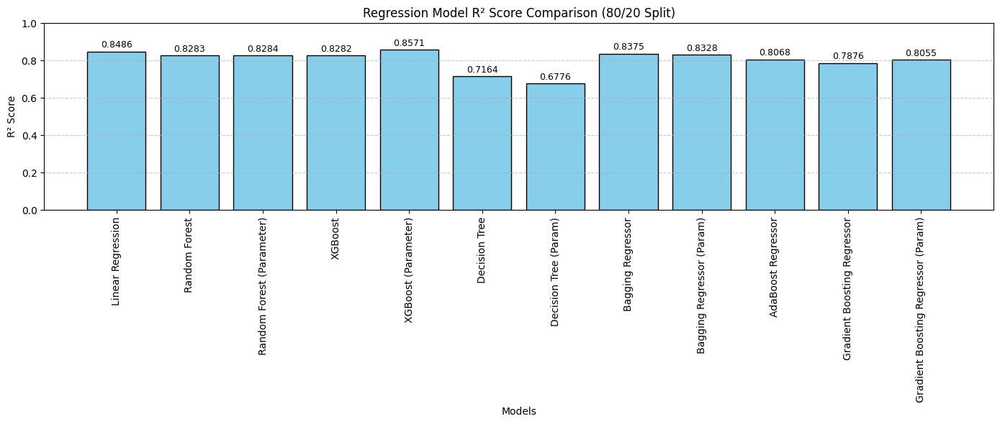

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
import matplotlib.pyplot as plt
import numpy as np

RANDOM_STATE = 42

# Prepare features and continuous target
X = df.drop(['Life expectancy', 'Country'], axis=1)
y = df['Life expectancy']

# Train-test split (no stratify for regression)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=RANDOM_STATE
)

model_scores = {}

# Linear Regression
from sklearn.linear_model import LinearRegression
lr = LinearRegression()
lr.fit(X_train, y_train)
y_pred = lr.predict(X_test)
model_scores["Linear Regression"] = r2_score(y_test, y_pred)

# Random Forest Regressor (Default)
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor(random_state=RANDOM_STATE)
rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)
model_scores["Random Forest"] = r2_score(y_test, y_pred)

# Random Forest Regressor (Tuned)
rf_parameter = RandomForestRegressor(n_estimators=200, max_depth=10,
                                     min_samples_split=5, random_state=RANDOM_STATE)
rf_parameter.fit(X_train, y_train)
y_pred = rf_parameter.predict(X_test)
model_scores["Random Forest (Parameter)"] = r2_score(y_test, y_pred)

# XGBoost Regressor (Default)
from xgboost import XGBRegressor
xgb = XGBRegressor(random_state=RANDOM_STATE, eval_metric='rmse')
xgb.fit(X_train, y_train)
y_pred = xgb.predict(X_test)
model_scores["XGBoost"] = r2_score(y_test, y_pred)

# XGBoost Regressor (Tuned)
xgb_parameter = XGBRegressor(n_estimators=300, max_depth=6, learning_rate=0.1,
                             random_state=RANDOM_STATE, eval_metric='rmse')
xgb_parameter.fit(X_train, y_train)
y_pred = xgb_parameter.predict(X_test)
model_scores["XGBoost (Parameter)"] = r2_score(y_test, y_pred)

# Decision Tree Regressor (Default)
from sklearn.tree import DecisionTreeRegressor
dt = DecisionTreeRegressor(random_state=RANDOM_STATE)
dt.fit(X_train, y_train)
y_pred = dt.predict(X_test)
model_scores["Decision Tree"] = r2_score(y_test, y_pred)

# Decision Tree Regressor (Tuned)
dt_parameter = DecisionTreeRegressor(max_depth=8, min_samples_split=4, random_state=RANDOM_STATE)
dt_parameter.fit(X_train, y_train)
y_pred = dt_parameter.predict(X_test)
model_scores["Decision Tree (Param)"] = r2_score(y_test, y_pred)

# Bagging Regressor (Default)
from sklearn.ensemble import BaggingRegressor
bag = BaggingRegressor(random_state=RANDOM_STATE)
bag.fit(X_train, y_train)
y_pred = bag.predict(X_test)
model_scores["Bagging Regressor"] = r2_score(y_test, y_pred)

# Bagging Regressor (Tuned)
bag_parameter = BaggingRegressor(n_estimators=150, random_state=RANDOM_STATE)
bag_parameter.fit(X_train, y_train)
y_pred = bag_parameter.predict(X_test)
model_scores["Bagging Regressor (Param)"] = r2_score(y_test, y_pred)

# AdaBoost Regressor
from sklearn.ensemble import AdaBoostRegressor
ada = AdaBoostRegressor(random_state=RANDOM_STATE)
ada.fit(X_train, y_train)
y_pred = ada.predict(X_test)
model_scores["AdaBoost Regressor"] = r2_score(y_test, y_pred)

# Gradient Boosting Regressor (Default)
from sklearn.ensemble import GradientBoostingRegressor
gb = GradientBoostingRegressor(random_state=RANDOM_STATE)
gb.fit(X_train, y_train)
y_pred = gb.predict(X_test)
model_scores["Gradient Boosting Regressor"] = r2_score(y_test, y_pred)

# Gradient Boosting Regressor (Tuned)
gb_parameter = GradientBoostingRegressor(n_estimators=200, max_depth=5, random_state=RANDOM_STATE)
gb_parameter.fit(X_train, y_train)
y_pred = gb_parameter.predict(X_test)
model_scores["Gradient Boosting Regressor (Param)"] = r2_score(y_test, y_pred)

# Plotting model R² scores
plt.figure(figsize=(14, 6))
plt.bar(model_scores.keys(), model_scores.values(), color='skyblue', edgecolor='black')
plt.ylim(0, 1)
plt.ylabel('R² Score')
plt.xlabel('Models')
plt.title('Regression Model R² Score Comparison (80/20 Split)')
plt.xticks(rotation=90)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Annotate bars
for i, v in enumerate(model_scores.values()):
    plt.text(i, v + 0.02, f"{v:.4f}", ha='center', fontsize=9)

plt.tight_layout()
plt.show()

# Train,Test for 75-25

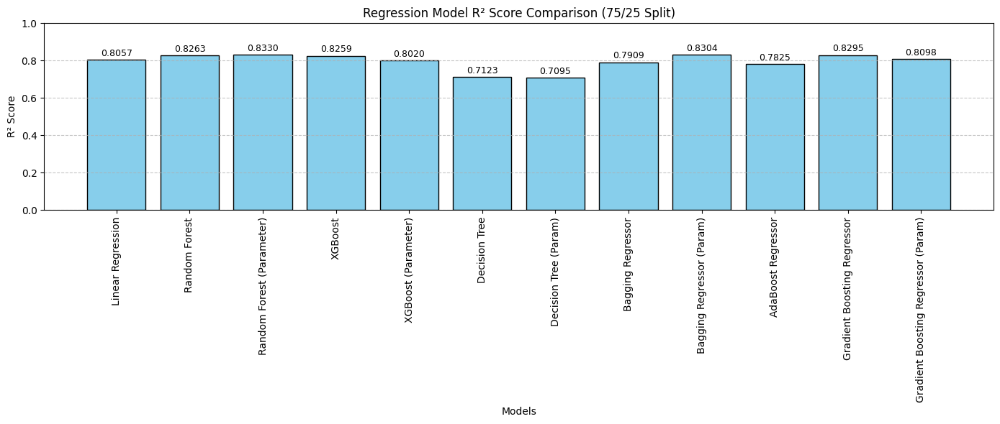

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
import matplotlib.pyplot as plt
import numpy as np

RANDOM_STATE = 42

# Prepare features and continuous target
X = df.drop(['Life expectancy', 'Country'], axis=1)
y = df['Life expectancy']

# Train-test split (no stratify for regression)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.25, random_state=RANDOM_STATE
)

model_scores = {}

# Linear Regression
from sklearn.linear_model import LinearRegression
lr = LinearRegression()
lr.fit(X_train, y_train)
y_pred = lr.predict(X_test)
model_scores["Linear Regression"] = r2_score(y_test, y_pred)

# Random Forest Regressor (Default)
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor(random_state=RANDOM_STATE)
rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)
model_scores["Random Forest"] = r2_score(y_test, y_pred)

# Random Forest Regressor (Tuned)
rf_parameter = RandomForestRegressor(n_estimators=200, max_depth=10,
                                     min_samples_split=5, random_state=RANDOM_STATE)
rf_parameter.fit(X_train, y_train)
y_pred = rf_parameter.predict(X_test)
model_scores["Random Forest (Parameter)"] = r2_score(y_test, y_pred)

# XGBoost Regressor (Default)
from xgboost import XGBRegressor
xgb = XGBRegressor(random_state=RANDOM_STATE, eval_metric='rmse')
xgb.fit(X_train, y_train)
y_pred = xgb.predict(X_test)
model_scores["XGBoost"] = r2_score(y_test, y_pred)

# XGBoost Regressor (Tuned)
xgb_parameter = XGBRegressor(n_estimators=300, max_depth=6, learning_rate=0.1,
                             random_state=RANDOM_STATE, eval_metric='rmse')
xgb_parameter.fit(X_train, y_train)
y_pred = xgb_parameter.predict(X_test)
model_scores["XGBoost (Parameter)"] = r2_score(y_test, y_pred)

# Decision Tree Regressor (Default)
from sklearn.tree import DecisionTreeRegressor
dt = DecisionTreeRegressor(random_state=RANDOM_STATE)
dt.fit(X_train, y_train)
y_pred = dt.predict(X_test)
model_scores["Decision Tree"] = r2_score(y_test, y_pred)

# Decision Tree Regressor (Tuned)
dt_parameter = DecisionTreeRegressor(max_depth=8, min_samples_split=4, random_state=RANDOM_STATE)
dt_parameter.fit(X_train, y_train)
y_pred = dt_parameter.predict(X_test)
model_scores["Decision Tree (Param)"] = r2_score(y_test, y_pred)

# Bagging Regressor (Default)
from sklearn.ensemble import BaggingRegressor
bag = BaggingRegressor(random_state=RANDOM_STATE)
bag.fit(X_train, y_train)
y_pred = bag.predict(X_test)
model_scores["Bagging Regressor"] = r2_score(y_test, y_pred)

# Bagging Regressor (Tuned)
bag_parameter = BaggingRegressor(n_estimators=150, random_state=RANDOM_STATE)
bag_parameter.fit(X_train, y_train)
y_pred = bag_parameter.predict(X_test)
model_scores["Bagging Regressor (Param)"] = r2_score(y_test, y_pred)

# AdaBoost Regressor
from sklearn.ensemble import AdaBoostRegressor
ada = AdaBoostRegressor(random_state=RANDOM_STATE)
ada.fit(X_train, y_train)
y_pred = ada.predict(X_test)
model_scores["AdaBoost Regressor"] = r2_score(y_test, y_pred)

# Gradient Boosting Regressor (Default)
from sklearn.ensemble import GradientBoostingRegressor
gb = GradientBoostingRegressor(random_state=RANDOM_STATE)
gb.fit(X_train, y_train)
y_pred = gb.predict(X_test)
model_scores["Gradient Boosting Regressor"] = r2_score(y_test, y_pred)

# Gradient Boosting Regressor (Tuned)
gb_parameter = GradientBoostingRegressor(n_estimators=200, max_depth=5, random_state=RANDOM_STATE)
gb_parameter.fit(X_train, y_train)
y_pred = gb_parameter.predict(X_test)
model_scores["Gradient Boosting Regressor (Param)"] = r2_score(y_test, y_pred)

# Plotting model R² scores
plt.figure(figsize=(14, 6))
plt.bar(model_scores.keys(), model_scores.values(), color='skyblue', edgecolor='black')
plt.ylim(0, 1)
plt.ylabel('R² Score')
plt.xlabel('Models')
plt.title('Regression Model R² Score Comparison (75/25 Split)')
plt.xticks(rotation=90)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Annotate bars
for i, v in enumerate(model_scores.values()):
    plt.text(i, v + 0.02, f"{v:.4f}", ha='center', fontsize=9)

plt.tight_layout()
plt.show()

# Train,Test for 60-40

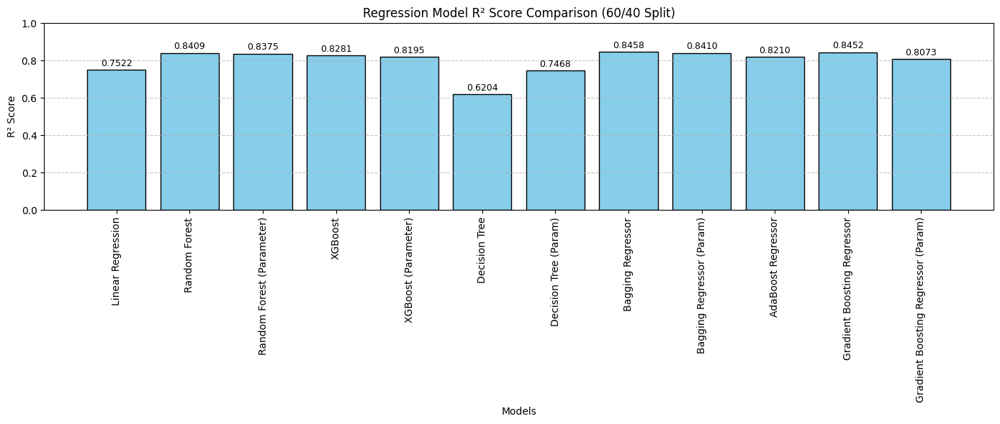

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
import matplotlib.pyplot as plt
import numpy as np

RANDOM_STATE = 42

# Prepare features and continuous target
X = df.drop(['Life expectancy', 'Country'], axis=1)
y = df['Life expectancy']

# Train-test split (no stratify for regression)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.4, random_state=RANDOM_STATE
)

model_scores = {}

# Linear Regression
from sklearn.linear_model import LinearRegression
lr = LinearRegression()
lr.fit(X_train, y_train)
y_pred = lr.predict(X_test)
model_scores["Linear Regression"] = r2_score(y_test, y_pred)

# Random Forest Regressor (Default)
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor(random_state=RANDOM_STATE)
rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)
model_scores["Random Forest"] = r2_score(y_test, y_pred)

# Random Forest Regressor (Tuned)
rf_parameter = RandomForestRegressor(n_estimators=200, max_depth=10,
                                     min_samples_split=5, random_state=RANDOM_STATE)
rf_parameter.fit(X_train, y_train)
y_pred = rf_parameter.predict(X_test)
model_scores["Random Forest (Parameter)"] = r2_score(y_test, y_pred)

# XGBoost Regressor (Default)
from xgboost import XGBRegressor
xgb = XGBRegressor(random_state=RANDOM_STATE, eval_metric='rmse')
xgb.fit(X_train, y_train)
y_pred = xgb.predict(X_test)
model_scores["XGBoost"] = r2_score(y_test, y_pred)

# XGBoost Regressor (Tuned)
xgb_parameter = XGBRegressor(n_estimators=300, max_depth=6, learning_rate=0.1,
                             random_state=RANDOM_STATE, eval_metric='rmse')
xgb_parameter.fit(X_train, y_train)
y_pred = xgb_parameter.predict(X_test)
model_scores["XGBoost (Parameter)"] = r2_score(y_test, y_pred)

# Decision Tree Regressor (Default)
from sklearn.tree import DecisionTreeRegressor
dt = DecisionTreeRegressor(random_state=RANDOM_STATE)
dt.fit(X_train, y_train)
y_pred = dt.predict(X_test)
model_scores["Decision Tree"] = r2_score(y_test, y_pred)

# Decision Tree Regressor (Tuned)
dt_parameter = DecisionTreeRegressor(max_depth=8, min_samples_split=4, random_state=RANDOM_STATE)
dt_parameter.fit(X_train, y_train)
y_pred = dt_parameter.predict(X_test)
model_scores["Decision Tree (Param)"] = r2_score(y_test, y_pred)

# Bagging Regressor (Default)
from sklearn.ensemble import BaggingRegressor
bag = BaggingRegressor(random_state=RANDOM_STATE)
bag.fit(X_train, y_train)
y_pred = bag.predict(X_test)
model_scores["Bagging Regressor"] = r2_score(y_test, y_pred)

# Bagging Regressor (Tuned)
bag_parameter = BaggingRegressor(n_estimators=150, random_state=RANDOM_STATE)
bag_parameter.fit(X_train, y_train)
y_pred = bag_parameter.predict(X_test)
model_scores["Bagging Regressor (Param)"] = r2_score(y_test, y_pred)

# AdaBoost Regressor
from sklearn.ensemble import AdaBoostRegressor
ada = AdaBoostRegressor(random_state=RANDOM_STATE)
ada.fit(X_train, y_train)
y_pred = ada.predict(X_test)
model_scores["AdaBoost Regressor"] = r2_score(y_test, y_pred)

# Gradient Boosting Regressor (Default)
from sklearn.ensemble import GradientBoostingRegressor
gb = GradientBoostingRegressor(random_state=RANDOM_STATE)
gb.fit(X_train, y_train)
y_pred = gb.predict(X_test)
model_scores["Gradient Boosting Regressor"] = r2_score(y_test, y_pred)

# Gradient Boosting Regressor (Tuned)
gb_parameter = GradientBoostingRegressor(n_estimators=200, max_depth=5, random_state=RANDOM_STATE)
gb_parameter.fit(X_train, y_train)
y_pred = gb_parameter.predict(X_test)
model_scores["Gradient Boosting Regressor (Param)"] = r2_score(y_test, y_pred)

# Plotting model R² scores
plt.figure(figsize=(14, 6))
plt.bar(model_scores.keys(), model_scores.values(), color='skyblue', edgecolor='black')
plt.ylim(0, 1)
plt.ylabel('R² Score')
plt.xlabel('Models')
plt.title('Regression Model R² Score Comparison (60/40 Split)')
plt.xticks(rotation=90)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Annotate bars
for i, v in enumerate(model_scores.values()):
    plt.text(i, v + 0.02, f"{v:.4f}", ha='center', fontsize=9)

plt.tight_layout()
plt.show()

# VIF

In [ ]:
import pandas as pd
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [ ]:
 df = pd.read_csv('/content/world-data-2023.csv')
df

,Country,Density\n(P/Km2),Agricultural Land( %),Land Area(Km2),Armed Forces size,Birth Rate,Co2-Emissions,CPI,CPI Change (%),Fertility Rate,Forested Area (%),Gasoline Price,GDP,Gross primary education enrollment (%),Gross tertiary education enrollment (%),Infant mortality,Life expectancy,Maternal mortality ratio,Minimum wage,Out of pocket health expenditure,Physicians per thousand,Population,Population: Labor force participation (%),Tax revenue (%),Total tax rate,Unemployment rate,Urban_population
0,Afghanistan,60.0,58.1,652230.0,323000.000000,32.49,8672.0,149.900000,2.300000,4.47,2.1,0.70,1.910135e+10,104.0,9.700000,47.9,64.000000,638.000000,0.430000,78.4,0.28,38041754.0,48.900000,9.300000,71.400000,11.120000,9797273.0
1,Albania,105.0,43.1,28748.0,9000.000000,11.78,4536.0,119.050000,1.400000,1.62,28.1,1.36,1.527808e+10,107.0,55.000000,7.8,78.000000,15.000000,1.120000,56.9,1.20,2854191.0,55.700000,18.600000,36.600000,12.330000,1747593.0
2,Algeria,18.0,17.4,2381741.0,317000.000000,24.28,150006.0,151.360000,2.000000,3.02,0.8,0.28,1.699882e+11,109.9,51.400000,20.1,77.000000,112.000000,0.950000,28.1,1.72,43053054.0,41.200000,37.200000,66.100000,11.700000,31510100.0
3,Andorra,164.0,40.0,468.0,159274.853801,7.20,469.0,190.460955,6.722346,1.27,34.0,1.51,3.154058e+09,106.4,37.963388,2.7,72.235294,160.392265,6.630000,36.4,3.33,77142.0,62.738068,16.502381,40.822404,6.886364,67873.0
4,Angola,26.0,47.5,1246700.0,117000.000000,40.73,34693.0,261.730000,17.100000,5.52,46.3,0.97,9.463542e+10,113.5,9.300000,51.6,61.000000,241.000000,0.710000,33.4,0.21,31825295.0,77.500000,9.200000,49.100000,6.890000,21061025.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
183,Venezuela,32.0,24.5,912050.0,343000.000000,17.88,164175.0,2740.270000,254.900000,2.27,52.7,0.00,4.823593e+11,97.2,79.300000,21.4,72.000000,125.000000,0.010000,45.8,1.92,28515829.0,59.700000,16.502381,73.300000,8.800000,25162368.0
184,Vietnam,314.0,39.3,331210.0,522000.000000,16.75,192668.0,163.520000,2.800000,2.05,48.1,0.80,2.619212e+11,110.6,28.500000,16.5,75.000000,43.000000,0.730000,43.5,0.82,96462106.0,77.400000,19.100000,37.600000,2.010000,35332140.0
185,Yemen,56.0,44.6,527968.0,40000.000000,30.45,10609.0,157.580000,8.100000,3.79,1.0,0.92,2.691440e+10,93.6,10.200000,42.9,66.000000,164.000000,2.130201,81.0,0.31,29161922.0,38.000000,16.502381,26.600000,12.910000,10869523.0
186,Zambia,25.0,32.1,752618.0,16000.000000,36.19,5141.0,212.310000,9.200000,4.63,65.2,1.40,2.306472e+10,98.7,4.100000,40.4,63.000000,213.000000,0.240000,27.5,1.19,17861030.0,74.600000,16.200000,15.600000,11.430000,7871713.0


In [ ]:
df.shape

(188, 27)

In [ ]:
x = df.drop(['Life expectancy','Country'], axis=1)
x

,Density\n(P/Km2),Agricultural Land( %),Land Area(Km2),Armed Forces size,Birth Rate,Co2-Emissions,CPI,CPI Change (%),Fertility Rate,Forested Area (%),Gasoline Price,GDP,Gross primary education enrollment (%),Gross tertiary education enrollment (%),Infant mortality,Maternal mortality ratio,Minimum wage,Out of pocket health expenditure,Physicians per thousand,Population,Population: Labor force participation (%),Tax revenue (%),Total tax rate,Unemployment rate,Urban_population
0,60.0,58.1,652230.0,323000.000000,32.49,8672.0,149.900000,2.300000,4.47,2.1,0.70,1.910135e+10,104.0,9.700000,47.9,638.000000,0.430000,78.4,0.28,38041754.0,48.900000,9.300000,71.400000,11.120000,9797273.0
1,105.0,43.1,28748.0,9000.000000,11.78,4536.0,119.050000,1.400000,1.62,28.1,1.36,1.527808e+10,107.0,55.000000,7.8,15.000000,1.120000,56.9,1.20,2854191.0,55.700000,18.600000,36.600000,12.330000,1747593.0
2,18.0,17.4,2381741.0,317000.000000,24.28,150006.0,151.360000,2.000000,3.02,0.8,0.28,1.699882e+11,109.9,51.400000,20.1,112.000000,0.950000,28.1,1.72,43053054.0,41.200000,37.200000,66.100000,11.700000,31510100.0
3,164.0,40.0,468.0,159274.853801,7.20,469.0,190.460955,6.722346,1.27,34.0,1.51,3.154058e+09,106.4,37.963388,2.7,160.392265,6.630000,36.4,3.33,77142.0,62.738068,16.502381,40.822404,6.886364,67873.0
4,26.0,47.5,1246700.0,117000.000000,40.73,34693.0,261.730000,17.100000,5.52,46.3,0.97,9.463542e+10,113.5,9.300000,51.6,241.000000,0.710000,33.4,0.21,31825295.0,77.500000,9.200000,49.100000,6.890000,21061025.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
183,32.0,24.5,912050.0,343000.000000,17.88,164175.0,2740.270000,254.900000,2.27,52.7,0.00,4.823593e+11,97.2,79.300000,21.4,125.000000,0.010000,45.8,1.92,28515829.0,59.700000,16.502381,73.300000,8.800000,25162368.0
184,314.0,39.3,331210.0,522000.000000,16.75,192668.0,163.520000,2.800000,2.05,48.1,0.80,2.619212e+11,110.6,28.500000,16.5,43.000000,0.730000,43.5,0.82,96462106.0,77.400000,19.100000,37.600000,2.010000,35332140.0
185,56.0,44.6,527968.0,40000.000000,30.45,10609.0,157.580000,8.100000,3.79,1.0,0.92,2.691440e+10,93.6,10.200000,42.9,164.000000,2.130201,81.0,0.31,29161922.0,38.000000,16.502381,26.600000,12.910000,10869523.0
186,25.0,32.1,752618.0,16000.000000,36.19,5141.0,212.310000,9.200000,4.63,65.2,1.40,2.306472e+10,98.7,4.100000,40.4,213.000000,0.240000,27.5,1.19,17861030.0,74.600000,16.200000,15.600000,11.430000,7871713.0


In [ ]:
vif_data = pd.DataFrame()
vif_data["feature"] = x.columns
vif_data["VIF"] = [variance_inflation_factor(x.values, i) for i in range(x.shape[1])]

In [ ]:
vif_data

,feature,VIF
0,Density\n(P/Km2),1.142163
1,Agricultural Land( %),1.489105
2,Land Area(Km2),2.146105
3,Armed Forces size,5.636926
4,Birth Rate,53.671952
5,Co2-Emissions,25.956197
6,CPI,6.077788
7,CPI Change (%),5.650384
8,Fertility Rate,42.808938
9,Forested Area (%),1.523448


In [ ]:
df.columns

Index(['Country', 'Density\n(P/Km2)', 'Agricultural Land( %)',
       'Land Area(Km2)', 'Armed Forces size', 'Birth Rate', 'Co2-Emissions',
       'CPI', 'CPI Change (%)', 'Fertility Rate', 'Forested Area (%)',
       'Gasoline Price', 'GDP', 'Gross primary education enrollment (%)',
       'Gross tertiary education enrollment (%)', 'Infant mortality',
       'Life expectancy', 'Maternal mortality ratio', 'Minimum wage',
       'Out of pocket health expenditure', 'Physicians per thousand',
       'Population', 'Population: Labor force participation (%)',
       'Tax revenue (%)', 'Total tax rate', 'Unemployment rate',
       'Urban_population'],
      dtype='object')

In [ ]:
x = df.drop(['Life expectancy','Birth Rate', 'Urban_population','Country','Co2-Emissions','GDP'], axis=1)

In [ ]:
vif_data = pd.DataFrame()
vif_data["feature"] = x.columns
vif_data["VIF"] = [variance_inflation_factor(x.values, i) for i in range(x.shape[1])]

In [ ]:
vif_data

,feature,VIF
0,Density\n(P/Km2),1.257600
1,Agricultural Land( %),6.034805
2,Land Area(Km2),1.984893
3,Armed Forces size,6.450885
4,CPI,7.544910
5,CPI Change (%),6.069083
6,Fertility Rate,21.506717
7,Forested Area (%),4.208750
8,Gasoline Price,14.475678
9,Gross primary education enrollment (%),57.827587


In [ ]:
x = df.drop(['Life expectancy','Birth Rate', 'Urban_population','Country','Co2-Emissions','GDP','Population: Labor force participation (%)','Infant mortality','Gross primary education enrollment (%)','Fertility Rate'], axis=1)

In [ ]:
vif_data = pd.DataFrame()
vif_data["feature"] = x.columns
vif_data["VIF"] = [variance_inflation_factor(x.values, i) for i in range(x.shape[1])]

In [ ]:
vif_data

,feature,VIF
0,Density\n(P/Km2),1.202933
1,Agricultural Land( %),5.269087
2,Land Area(Km2),1.912172
3,Armed Forces size,6.346240
4,CPI,7.242645
5,CPI Change (%),5.917319
6,Forested Area (%),3.413891
7,Gasoline Price,13.376356
8,Gross tertiary education enrollment (%),7.620011
9,Maternal mortality ratio,3.255948


In [ ]:
x = df.drop(['Life expectancy','Birth Rate', 'Urban_population','Country','Co2-Emissions','GDP','Population: Labor force participation (%)','Infant mortality','Gross primary education enrollment (%)','Fertility Rate','Gasoline Price'], axis=1)

In [ ]:
vif_data = pd.DataFrame()
vif_data["feature"] = x.columns
vif_data["VIF"] = [variance_inflation_factor(x.values, i) for i in range(x.shape[1])]

In [ ]:
vif_data

,feature,VIF
0,Density\n(P/Km2),1.157820
1,Agricultural Land( %),5.065461
2,Land Area(Km2),1.873220
3,Armed Forces size,6.304777
4,CPI,7.150760
5,CPI Change (%),5.909243
6,Forested Area (%),3.020468
7,Gross tertiary education enrollment (%),7.610669
8,Maternal mortality ratio,2.961542
9,Minimum wage,2.514250


# Models After performing VIF

# Linear Regression

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

In [ ]:
x = df.drop(['Life expectancy','Birth Rate', 'Urban_population','Country','Co2-Emissions','GDP','Population: Labor force participation (%)','Infant mortality','Gross primary education enrollment (%)','Fertility Rate','Gasoline Price'], axis=1)
y = df['Life expectancy']

In [ ]:
x

,Density\n(P/Km2),Agricultural Land( %),Land Area(Km2),Armed Forces size,CPI,CPI Change (%),Forested Area (%),Gross tertiary education enrollment (%),Maternal mortality ratio,Minimum wage,Out of pocket health expenditure,Physicians per thousand,Population,Tax revenue (%),Total tax rate,Unemployment rate
0,60.0,58.1,652230.0,323000.000000,149.900000,2.300000,2.1,9.700000,638.000000,0.430000,78.4,0.28,38041754.0,9.300000,71.400000,11.120000
1,105.0,43.1,28748.0,9000.000000,119.050000,1.400000,28.1,55.000000,15.000000,1.120000,56.9,1.20,2854191.0,18.600000,36.600000,12.330000
2,18.0,17.4,2381741.0,317000.000000,151.360000,2.000000,0.8,51.400000,112.000000,0.950000,28.1,1.72,43053054.0,37.200000,66.100000,11.700000
3,164.0,40.0,468.0,159274.853801,190.460955,6.722346,34.0,37.963388,160.392265,6.630000,36.4,3.33,77142.0,16.502381,40.822404,6.886364
4,26.0,47.5,1246700.0,117000.000000,261.730000,17.100000,46.3,9.300000,241.000000,0.710000,33.4,0.21,31825295.0,9.200000,49.100000,6.890000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
183,32.0,24.5,912050.0,343000.000000,2740.270000,254.900000,52.7,79.300000,125.000000,0.010000,45.8,1.92,28515829.0,16.502381,73.300000,8.800000
184,314.0,39.3,331210.0,522000.000000,163.520000,2.800000,48.1,28.500000,43.000000,0.730000,43.5,0.82,96462106.0,19.100000,37.600000,2.010000
185,56.0,44.6,527968.0,40000.000000,157.580000,8.100000,1.0,10.200000,164.000000,2.130201,81.0,0.31,29161922.0,16.502381,26.600000,12.910000
186,25.0,32.1,752618.0,16000.000000,212.310000,9.200000,65.2,4.100000,213.000000,0.240000,27.5,1.19,17861030.0,16.200000,15.600000,11.430000


In [ ]:
y

,Life expectancy
0,64.000000
1,78.000000
2,77.000000
3,72.235294
4,61.000000
...,...
183,72.000000
184,75.000000
185,66.000000
186,63.000000


In [ ]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size= .3, random_state= 52)

In [ ]:
x_train

,Density\n(P/Km2),Agricultural Land( %),Land Area(Km2),Armed Forces size,CPI,CPI Change (%),Forested Area (%),Gross tertiary education enrollment (%),Maternal mortality ratio,Minimum wage,Out of pocket health expenditure,Physicians per thousand,Population,Tax revenue (%),Total tax rate,Unemployment rate
75,464.0,60.4,3287263.0,3031000.0,180.44,7.7,23.8,28.1,145.0,0.30,65.1,0.86,1.366418e+09,11.2,49.7,5.360000
137,9.0,13.3,17098240.0,1454000.0,180.75,4.5,49.8,81.9,17.0,0.53,36.4,4.01,1.443735e+08,11.4,46.2,4.590000
104,1380.0,32.4,316.0,2000.0,113.45,1.6,1.1,54.3,6.0,5.07,37.1,2.86,5.026530e+05,26.2,44.0,3.470000
67,167.0,36.0,108889.0,43000.0,142.92,3.7,32.7,21.8,95.0,1.60,55.8,0.35,1.660403e+07,10.6,35.2,2.460000
148,214.0,3.4,455.0,0.0,129.96,1.8,88.4,17.1,53.0,2.00,2.5,0.95,9.762500e+04,34.1,30.1,6.886364
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
86,94.0,48.5,580367.0,29000.0,180.51,4.7,7.8,11.5,342.0,0.25,33.4,0.16,5.257397e+07,15.1,37.2,2.640000
151,114.0,39.2,49035.0,16000.0,115.34,2.7,40.4,46.6,5.0,3.11,18.4,3.42,5.454073e+06,18.7,49.7,5.560000
13,1265.0,70.6,148460.0,221000.0,179.68,5.6,11.0,20.6,173.0,0.51,71.8,0.58,1.673108e+08,8.8,33.4,4.190000
11,39.0,1.4,13880.0,1000.0,116.22,2.5,51.4,15.1,70.0,5.25,27.8,1.94,3.894820e+05,14.8,33.8,10.360000


In [ ]:
model = LinearRegression()

In [ ]:
model.fit(x_train, y_train)

LinearRegression()

In [ ]:
y_pred = model.predict(x_test)

In [ ]:
linear = pd.DataFrame({'Predicted':y_pred,'Actual':y_test})

In [ ]:
linear

,Predicted,Actual
94,60.293538,64.000000
102,81.372677,79.000000
81,77.800960,83.000000
142,71.444610,73.000000
183,65.484138,72.000000
56,65.798125,66.000000
40,75.599749,80.000000
125,78.999367,78.000000
79,82.331951,82.000000
23,71.774693,76.000000


In [ ]:
from sklearn.metrics import r2_score
r2_score(y_test,y_pred)

0.7712519516578034

In [ ]:
from sklearn.metrics import mean_absolute_error
mean_absolute_error(y_test,y_pred)

2.9357228376565514

In [ ]:
from sklearn.metrics import mean_squared_error
mean_squared_error(y_test,y_pred)

13.661263939957104

In [ ]:
from sklearn.metrics import mean_absolute_percentage_error
mean_absolute_percentage_error(y_test,y_pred)

0.04131719537208359

In [ ]:
model.coef_

array([ 1.83332609e-03, -4.12254132e-02, -2.04053358e-07, -1.38262669e-06,
        1.58321319e-03, -4.50364070e-02, -2.12938751e-02,  4.55996362e-02,
       -1.64263180e-02,  4.67233422e-01, -2.39553319e-02,  1.00699164e+00,
        4.56566063e-09, -2.71445638e-03, -5.00373291e-03, -1.12706140e-01])

In [ ]:
model.intercept_

np.float64(74.22886295125271)

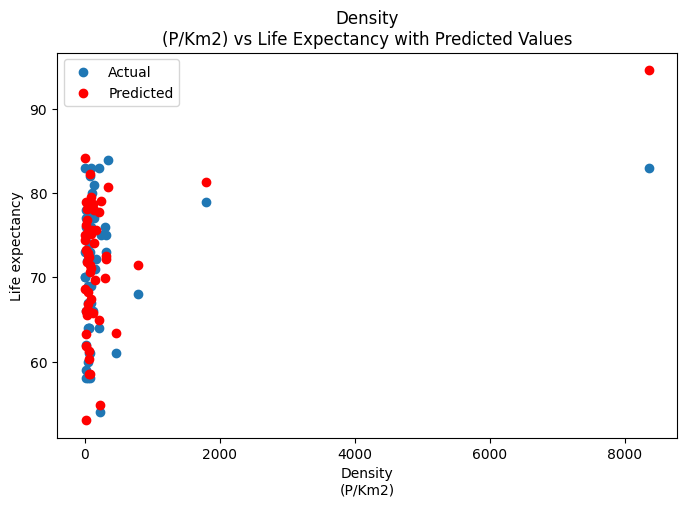

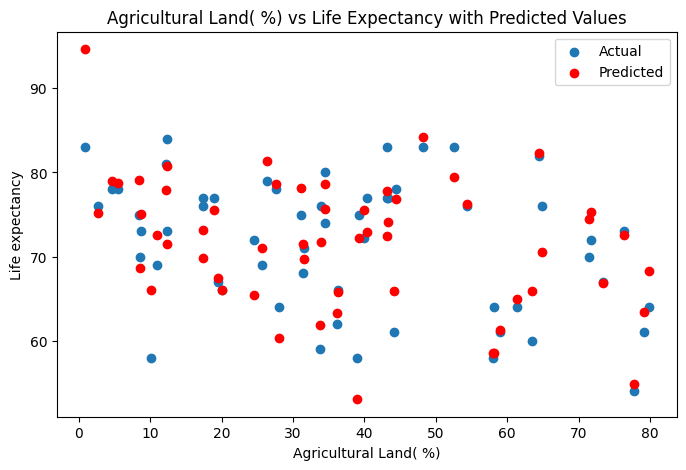

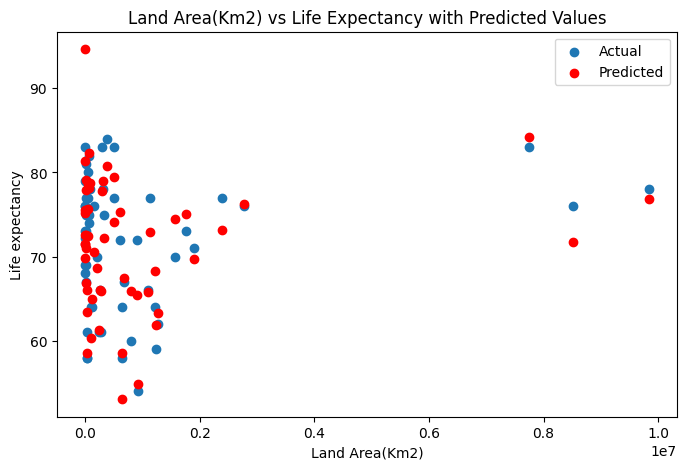

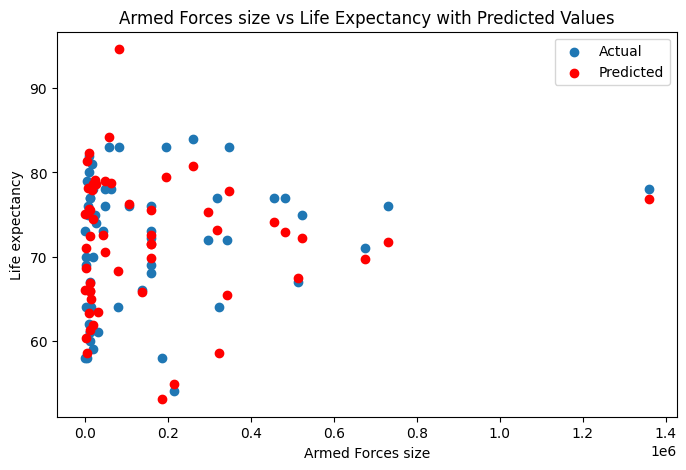

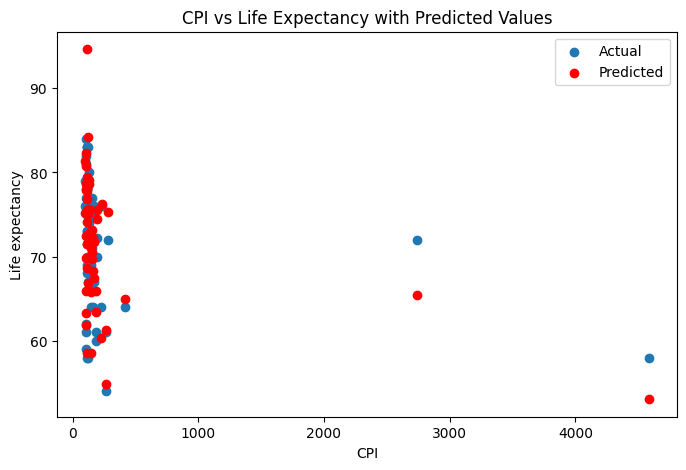

...

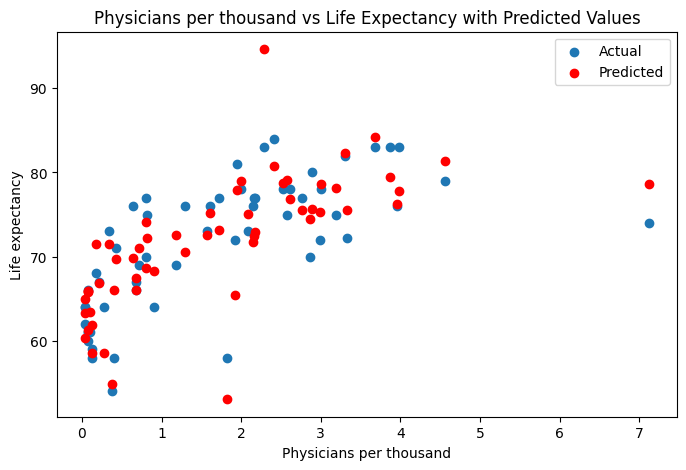

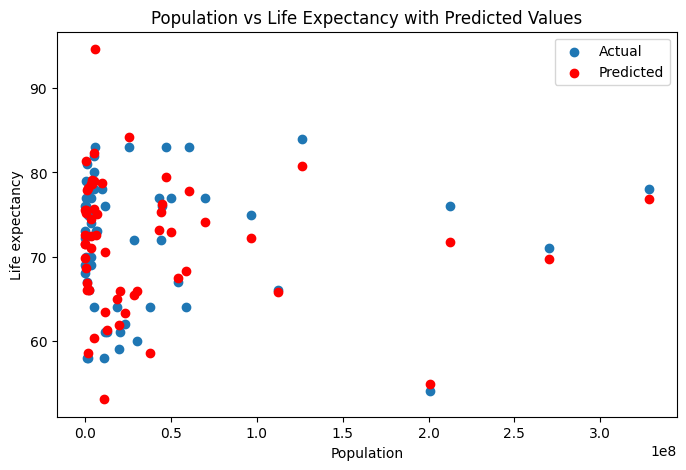

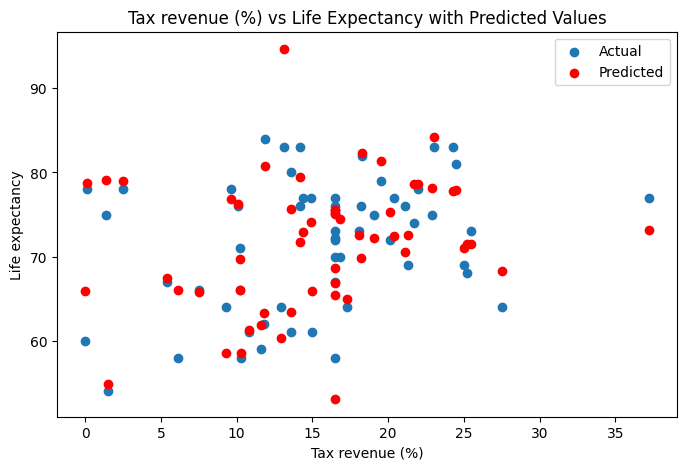

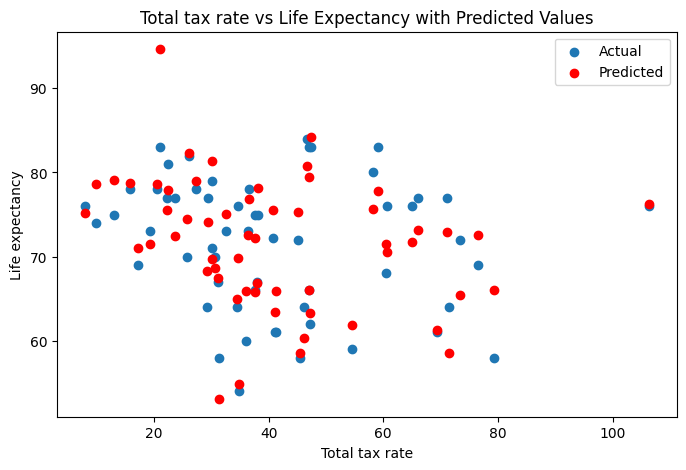

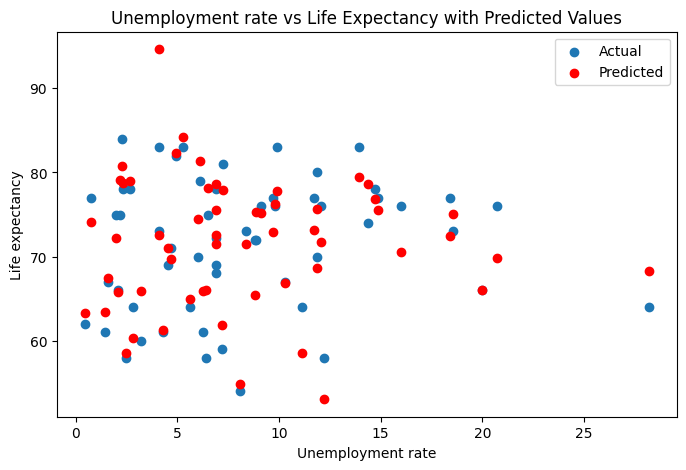

In [ ]:
# Plotting the Least Squares Line for each feature

# Get the list of feature names used in the model
feature_names = x.columns

for i, col in enumerate(feature_names):
    plt.figure(figsize=(8, 5))

    # Scatter plot of actual values
    plt.scatter(x_test[col], y_test, label='Actual')

    # Plot the predicted values
    # The predicted values (y_pred) are for the entire test set, so we plot them against the corresponding feature values
    plt.scatter(x_test[col], y_pred, color='red', label='Predicted')

    plt.xlabel(col)
    plt.ylabel('Life expectancy')
    plt.title(f'{col} vs Life Expectancy with Predicted Values')
    plt.legend()
    plt.show()

# Decision Tree Regressor

In [ ]:
from sklearn.tree import DecisionTreeRegressor

In [ ]:
model = DecisionTreeRegressor()

In [ ]:
model.fit(x_train, y_train)

DecisionTreeRegressor()

In [ ]:
y_pred = model.predict(x_test)

In [ ]:
y_pred

array([54., 74., 81., 71., 74., 61., 78., 79., 81., 81., 67., 64., 63.,
       81., 80., 72., 62., 64., 71., 63., 69., 82., 62., 75., 57., 73.,
       65., 61., 79., 82., 77., 75., 75., 81., 63., 57., 69., 78., 72.,
       72., 78., 73., 72., 74., 82., 57., 75., 78., 82., 75., 69., 57.,
       78., 75., 75., 79., 77.])

In [ ]:
dt = pd.DataFrame({'Predicted':y_pred,'Actual':y_test})
dt

,Predicted,Actual
94,54.0,64.000000
102,74.0,79.000000
81,81.0,83.000000
142,71.0,73.000000
183,74.0,72.000000
56,61.0,66.000000
40,78.0,80.000000
125,79.0,78.000000
79,81.0,82.000000
23,81.0,76.000000


In [ ]:
from sklearn.metrics import r2_score
r2_score(y_test,y_pred)

0.7012305043619149

In [ ]:
from sklearn import metrics
metrics.mean_absolute_error(y_test,y_pred)

3.495356037151703

In [ ]:
from sklearn.metrics import mean_squared_error
mean_squared_error(y_test,y_pred)

17.843076549505252

In [ ]:
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
rmse

np.float64(4.224106597791449)

In [ ]:
from sklearn.metrics import mean_absolute_percentage_error
mape = mean_absolute_percentage_error(y_test, y_pred)
print(mape)
mape = mape * 100
mape

0.04980723752995229


4.980723752995229

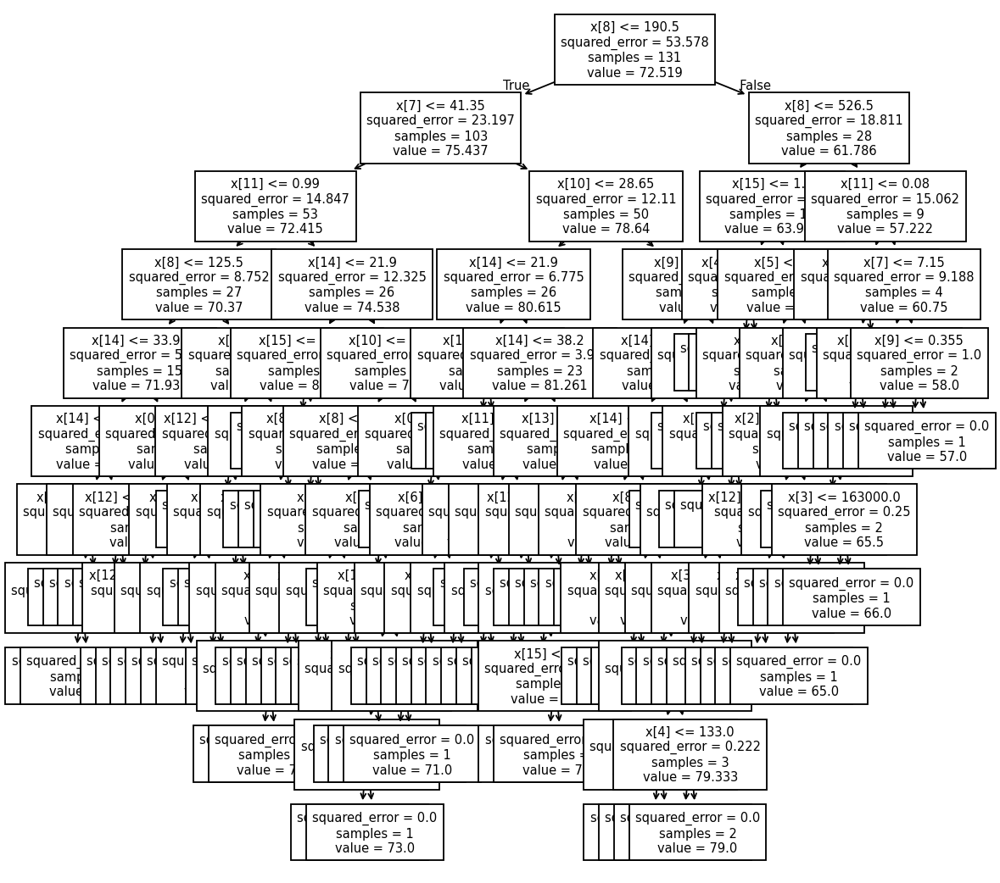

In [ ]:
from sklearn.tree import plot_tree
plt.figure(figsize=(10, 10), dpi=132)
plot_tree(model, fontsize=8)
plt.show()

In [ ]:
help(DecisionTreeRegressor)

Help on class DecisionTreeRegressor in module sklearn.tree._classes:

class DecisionTreeRegressor(sklearn.base.RegressorMixin, BaseDecisionTree)
 |  DecisionTreeRegressor(*, criterion='squared_error', splitter='best', max_depth=None, min_samples_split=2, min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_features=None, random_state=None, max_leaf_nodes=None, min_impurity_decrease=0.0, ccp_alpha=0.0, monotonic_cst=None)
 |
 |  A decision tree regressor.
 |
 |  Read more in the :ref:`User Guide <tree>`.
 |
 |  Parameters
 |  ----------
 |  criterion : {"squared_error", "friedman_mse", "absolute_error",             "poisson"}, default="squared_error"
 |      The function to measure the quality of a split. Supported criteria
 |      are "squared_error" for the mean squared error, which is equal to
 |      variance reduction as feature selection criterion and minimizes the L2
 |      loss using the mean of each terminal node, "friedman_mse", which uses
 |      mean squared error with Fri

**Decision Tree Regressor Parameter**

In [ ]:
# Create Decision Tree Regressor object
clf = DecisionTreeRegressor(criterion="absolute_error", max_depth=3) # 'absolute_error', 'poisson', 'squared_error', 'friedman_mse'

# Train Decision Tree Regressor
clf = clf.fit(x_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(x_test)

In [ ]:
r2_score(y_test,y_pred)

0.7576322945015951

In [ ]:
metrics.mean_absolute_error(y_test,y_pred)

3.0216718266253872

In [ ]:
mean_squared_error(y_test,y_pred)

14.474655496873671

In [ ]:
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
rmse

np.float64(3.8045572011567486)

In [ ]:
mape = mean_absolute_percentage_error(y_test, y_pred)
print(mape)
mape = mape * 100
mape

0.043969820812093094


4.396982081209309

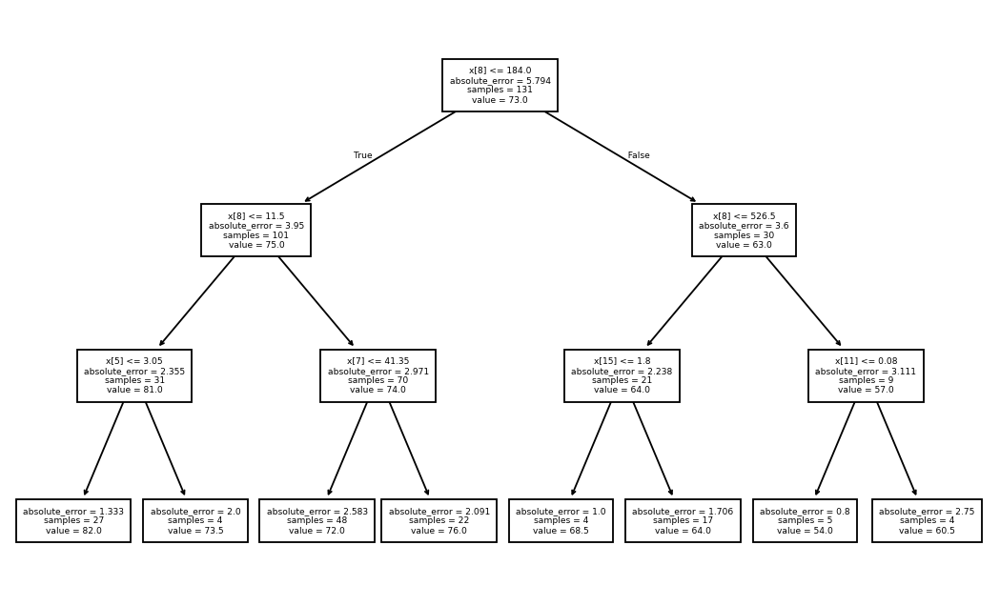

In [ ]:
plt.figure(figsize=(10, 6), dpi=132)
plot_tree(clf, fontsize=5)
plt.show()

# Random Forest Regressor

In [ ]:
from sklearn.ensemble import RandomForestRegressor

In [ ]:
help(RandomForestRegressor)

Help on class RandomForestRegressor in module sklearn.ensemble._forest:

class RandomForestRegressor(ForestRegressor)
 |  RandomForestRegressor(n_estimators=100, *, criterion='squared_error', max_depth=None, min_samples_split=2, min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_features=1.0, max_leaf_nodes=None, min_impurity_decrease=0.0, bootstrap=True, oob_score=False, n_jobs=None, random_state=None, verbose=0, warm_start=False, ccp_alpha=0.0, max_samples=None, monotonic_cst=None)
 |
 |  A random forest regressor.
 |
 |  A random forest is a meta estimator that fits a number of decision tree
 |  regressors on various sub-samples of the dataset and uses averaging to
 |  improve the predictive accuracy and control over-fitting.
 |  Trees in the forest use the best split strategy, i.e. equivalent to passing
 |  `splitter="best"` to the underlying :class:`~sklearn.tree.DecisionTreeRegressor`.
 |  The sub-sample size is controlled with the `max_samples` parameter if
 |  `bootstrap=Tru

In [ ]:
model = RandomForestRegressor()

In [ ]:
model.fit(x_train, y_train)

RandomForestRegressor()

In [ ]:
y_pred = model.predict(x_test)

In [ ]:
y_pred

array([58.16, 76.95, 81.03, 71.22, 73.5 , 62.72, 76.44, 75.24, 81.17,
       75.19, 66.26, 64.69, 64.97, 81.31, 79.62, 74.47, 59.9 , 63.89,
       72.81, 64.22, 69.55, 81.28, 61.49, 77.68, 59.39, 72.55, 61.54,
       63.44, 74.78, 75.22, 76.63, 77.97, 80.21, 74.33, 63.65, 58.82,
       68.96, 75.39, 71.61, 71.5 , 75.8 , 80.39, 69.84, 75.03, 77.23,
       60.36, 77.06, 80.47, 75.45, 81.39, 61.75, 64.88, 76.27, 75.64,
       75.08, 73.77, 76.19])

In [ ]:
dt = pd.DataFrame({'Predicted':y_pred,'Actual':y_test})
dt

,Predicted,Actual
94,58.16,64.000000
102,76.95,79.000000
81,81.03,83.000000
142,71.22,73.000000
183,73.50,72.000000
56,62.72,66.000000
40,76.44,80.000000
125,75.24,78.000000
79,81.17,82.000000
23,75.19,76.000000


In [ ]:
from sklearn.metrics import r2_score
r2_score(y_test,y_pred)

0.8458045235565447

In [ ]:
from sklearn import metrics
metrics.mean_absolute_error(y_test,y_pred)

2.4679772961816306

In [ ]:
from sklearn.metrics import mean_squared_error
mean_squared_error(y_test,y_pred)

9.208844041765312

In [ ]:
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
rmse

np.float64(3.0346077245280503)

In [ ]:
from sklearn.metrics import mean_absolute_percentage_error
mape = mean_absolute_percentage_error(y_test, y_pred)
print(mape)
mape = mape * 100
mape

0.03595365723426852


3.595365723426852

**Random Forest Resgressor Parameter**

In [ ]:
# Create Random Forest Regressor object
clf = RandomForestRegressor(n_estimators=100, criterion="poisson", max_depth=15, bootstrap=True) # 'absolute_error', 'poisson', 'squared_error', 'friedman_mse'

# Train Random Forest Regressor
clf = clf.fit(x_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(x_test)

In [ ]:
r2_score(y_test,y_pred)

0.8561391078900441

In [ ]:
metrics.mean_absolute_error(y_test,y_pred)

2.392538699690402

In [ ]:
mean_squared_error(y_test,y_pred)

8.591643216171915

In [ ]:
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
rmse

np.float64(2.93115049360689)

In [ ]:
mape = mean_absolute_percentage_error(y_test, y_pred)
print(mape)
mape = mape * 100
mape

0.03475848146270147


3.4758481462701467

# Bagging Regressor

In [ ]:
from sklearn.ensemble import BaggingRegressor

In [ ]:
model = BaggingRegressor()

In [ ]:
model.fit(x_train, y_train)

BaggingRegressor()

In [ ]:
y_pred = model.predict(x_test)

In [ ]:
y_pred

array([59.1, 77.5, 82.6, 70.6, 72.9, 64. , 77. , 76.6, 81.8, 75.4, 67.2,
       65.5, 64.6, 80.4, 79.3, 76.8, 58.9, 63.3, 73.4, 64. , 70.9, 81.8,
       60.2, 78.1, 60. , 73.1, 62.8, 63.2, 73.7, 73. , 76.2, 78.1, 78.6,
       76.8, 64.5, 57.1, 70.2, 76. , 71. , 72. , 76.4, 80.4, 71.3, 72.5,
       77.6, 59.9, 77.2, 82.3, 76.1, 80.7, 62.7, 61. , 77.1, 74.7, 74.9,
       73.2, 75.4])

In [ ]:
dt = pd.DataFrame({'Predicted':y_pred,'Actual':y_test})
dt

,Predicted,Actual
94,59.1,64.000000
102,77.5,79.000000
81,82.6,83.000000
142,70.6,73.000000
183,72.9,72.000000
56,64.0,66.000000
40,77.0,80.000000
125,76.6,78.000000
79,81.8,82.000000
23,75.4,76.000000


In [ ]:
from sklearn.metrics import r2_score
r2_score(y_test,y_pred)

0.8596898131228476

In [ ]:
from sklearn import metrics
metrics.mean_absolute_error(y_test,y_pred)

2.223942208462333

In [ ]:
from sklearn.metrics import mean_squared_error
mean_squared_error(y_test,y_pred)

8.379588417410309

In [ ]:
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
rmse

np.float64(2.894751874929924)

In [ ]:
from sklearn.metrics import mean_absolute_percentage_error
mape = mean_absolute_percentage_error(y_test, y_pred)
print(mape)
mape = mape * 100
mape

0.03231111048495436


3.231111048495436

**Bagging Regressor Parameter**

In [ ]:
# Create Bagging Regressor object
from sklearn.tree import DecisionTreeRegressor
base_estimator = DecisionTreeRegressor(max_depth=18, random_state=42)
br = BaggingRegressor(estimator=base_estimator, n_estimators=20, bootstrap=True)

# Train Bagging Regressor
br = br.fit(x_train,y_train)

#Predict the response for test dataset
y_pred = br.predict(x_test)

In [ ]:
r2_score(y_test,y_pred)

0.831615018562672

In [ ]:
metrics.mean_absolute_error(y_test,y_pred)

2.549380804953559

In [ ]:
mean_squared_error(y_test,y_pred)

10.056267983973765

In [ ]:
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
rmse

np.float64(3.171161929636165)

In [ ]:
mape = mean_absolute_percentage_error(y_test, y_pred)
print(mape)
mape = mape * 100
mape

0.03721051096290133


3.721051096290133

# Boosting Regressor

In [ ]:
from sklearn.ensemble import AdaBoostRegressor

In [ ]:
model = AdaBoostRegressor()

In [ ]:
model.fit(x_train, y_train)

AdaBoostRegressor()

In [ ]:
y_pred = model.predict(x_test)

In [ ]:
y_pred

array([56.5       , 80.34782609, 78.68085106, 70.34210526, 73.54166667,
       63.4       , 76.56410256, 77.88888889, 79.97619048, 74.97727273,
       65.57142857, 64.        , 64.47727273, 79.97619048, 79.58536585,
       75.35714286, 59.        , 64.9       , 73.        , 64.11111111,
       71.35294118, 78.07407407, 60.75      , 78.41666667, 60.91666667,
       72.97560976, 60.91666667, 64.33333333, 74.44444444, 74.80952381,
       76.56      , 77.86440678, 78.07407407, 73.40909091, 63.80952381,
       60.05555556, 70.3030303 , 74.94117647, 72.        , 70.54545455,
       76.02040816, 80.34782609, 69.47368421, 75.        , 77.4       ,
       61.45454545, 75.1509434 , 78.26666667, 77.4       , 79.97619048,
       62.53333333, 71.41666667, 76.56      , 74.80952381, 74.94117647,
       73.54166667, 76.33333333])

In [ ]:
dt = pd.DataFrame({'Predicted':y_pred,'Actual':y_test})
dt

,Predicted,Actual
94,56.500000,64.000000
102,80.347826,79.000000
81,78.680851,83.000000
142,70.342105,73.000000
183,73.541667,72.000000
56,63.400000,66.000000
40,76.564103,80.000000
125,77.888889,78.000000
79,79.976190,82.000000
23,74.977273,76.000000


In [ ]:
from sklearn.metrics import r2_score
r2_score(y_test,y_pred)

0.7774959081783658

In [ ]:
from sklearn import metrics
metrics.mean_absolute_error(y_test,y_pred)

2.7372960980960293

In [ ]:
from sklearn.metrics import mean_squared_error
mean_squared_error(y_test,y_pred)

13.28836310571954

In [ ]:
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
rmse

np.float64(3.6453207136985273)

In [ ]:
from sklearn.metrics import mean_absolute_percentage_error
mape = mean_absolute_percentage_error(y_test, y_pred)
print(mape)
mape = mape * 100
mape

0.03966054728510722


3.966054728510722

**ADABoosting Regressor Parameter**

In [ ]:
# Create Boosting Regressor object
from sklearn.ensemble import RandomForestRegressor
base_estimator = RandomForestRegressor(max_depth=12, random_state=42)
br = AdaBoostRegressor(estimator=base_estimator, n_estimators=100, learning_rate=0.05, loss='linear') #'linear', 'square', 'exponential'

# Train Boosting Regressor
br = br.fit(x_train,y_train)

#Predict the response for test dataset
y_pred = br.predict(x_test)

In [ ]:
r2_score(y_test,y_pred)

0.8419855082429573

In [ ]:
metrics.mean_absolute_error(y_test,y_pred)

2.4495668091798124

In [ ]:
mean_squared_error(y_test,y_pred)

9.436922823498165

In [ ]:
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
rmse

np.float64(3.0719574905096203)

In [ ]:
mape = mean_absolute_percentage_error(y_test, y_pred)
print(mape)
mape = mape * 100
mape

0.03570160804395651


3.570160804395651

# GradientBoost Regressor

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor

In [ ]:
model = GradientBoostingRegressor()

In [ ]:
model.fit(x_train, y_train)

GradientBoostingRegressor()

In [ ]:
y_pred = model.predict(x_test)

In [ ]:
y_pred

array([57.89164596, 77.78023477, 80.64027878, 69.9992811 , 71.60538689,
       63.29914505, 76.99873324, 76.2383818 , 80.58490828, 75.17776038,
       69.14763882, 64.25149988, 66.96060213, 82.79961624, 78.99354673,
       75.16645984, 60.58062214, 65.9726025 , 73.70117178, 66.49597891,
       70.29907007, 81.54338755, 59.40014442, 77.63533774, 57.0073923 ,
       71.64760131, 61.07020801, 64.07302977, 75.01829334, 74.57683582,
       77.14416063, 77.66751929, 81.15633092, 75.92154977, 64.30194245,
       59.03180049, 69.60033478, 75.36558282, 71.23788164, 71.43764768,
       78.03647809, 80.38993011, 69.36047983, 75.01654782, 78.05663113,
       60.4250987 , 76.09232604, 79.94333585, 77.28324381, 80.61906113,
       62.44493794, 67.19600806, 75.57832567, 72.53404455, 73.91936768,
       74.25988908, 77.67782094])

In [ ]:
dt = pd.DataFrame({'Predicted':y_pred,'Actual':y_test})
dt

,Predicted,Actual
94,57.891646,64.000000
102,77.780235,79.000000
81,80.640279,83.000000
142,69.999281,73.000000
183,71.605387,72.000000
56,63.299145,66.000000
40,76.998733,80.000000
125,76.238382,78.000000
79,80.584908,82.000000
23,75.177760,76.000000


In [ ]:
from sklearn.metrics import r2_score
r2_score(y_test,y_pred)

0.8283700643892681

In [ ]:
from sklearn import metrics
metrics.mean_absolute_error(y_test,y_pred)

2.4415844042049915

In [ ]:
from sklearn.metrics import mean_squared_error
mean_squared_error(y_test,y_pred)

10.25006275405906

In [ ]:
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
rmse

np.float64(3.201571919238901)

In [ ]:
from sklearn.metrics import mean_absolute_percentage_error
mape = mean_absolute_percentage_error(y_test, y_pred)
print(mape)
mape = mape * 100
mape

0.03589092388276656


3.589092388276656

**GradientBoosting Regressor Parameter**

In [ ]:
# Create Boosting Regressor object
br = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, loss='absolute_error', criterion='squared_error',random_state=45) #'quantile', 'huber', 'absolute_error', 'squared_error'

# Train Boosting Regressor
br = br.fit(x_train,y_train)

#Predict the response for test dataset
y_pred = br.predict(x_test)

In [ ]:
r2_score(y_test,y_pred)

0.8739366096107243

In [ ]:
metrics.mean_absolute_error(y_test,y_pred)

2.235829111007512

In [ ]:
mean_squared_error(y_test,y_pred)

7.528742919360068

In [ ]:
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
rmse

np.float64(2.7438554844160556)

In [ ]:
mape = mean_absolute_percentage_error(y_test, y_pred)
print(mape)
mape = mape * 100
mape

0.03246986172118582


3.246986172118582

# XGBoost Regressor

In [ ]:
from xgboost import XGBRegressor

In [ ]:
model = XGBRegressor()

In [ ]:
model.fit(x_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...)

In [ ]:
y_pred = model.predict(x_test)

In [ ]:
y_pred

array([58.235466, 76.67666 , 81.1739  , 69.15966 , 74.83517 , 63.79635 ,
       78.27486 , 74.51472 , 79.694534, 76.649376, 67.828606, 62.64502 ,
       65.197876, 80.74208 , 78.582344, 73.978455, 60.39449 , 63.178753,
       72.35399 , 66.6374  , 69.11116 , 81.25999 , 57.6506  , 78.008125,
       59.11809 , 70.93951 , 61.88037 , 63.474487, 75.42679 , 78.24188 ,
       76.88277 , 77.57599 , 77.45979 , 79.15763 , 62.971054, 62.21415 ,
       68.575966, 76.32407 , 72.32371 , 68.223595, 79.10885 , 81.121475,
       70.16021 , 74.540886, 77.76993 , 60.359562, 74.715195, 79.57219 ,
       78.10718 , 81.37335 , 63.67776 , 64.044136, 76.59088 , 75.429855,
       73.81608 , 73.01693 , 78.53003 ], dtype=float32)

In [ ]:
dt = pd.DataFrame({'Predicted':y_pred,'Actual':y_test})
dt

,Predicted,Actual
94,58.235466,64.000000
102,76.676659,79.000000
81,81.173897,83.000000
142,69.159660,73.000000
183,74.835167,72.000000
56,63.796349,66.000000
40,78.274857,80.000000
125,74.514717,78.000000
79,79.694534,82.000000
23,76.649376,76.000000


In [ ]:
from sklearn.metrics import r2_score
r2_score(y_test,y_pred)

0.8190694616778581

In [ ]:
from sklearn import metrics
metrics.mean_absolute_error(y_test,y_pred)

2.699411161912853

In [ ]:
from sklearn.metrics import mean_squared_error
mean_squared_error(y_test,y_pred)

10.805512251276975

In [ ]:
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
rmse

np.float64(3.287173900370495)

In [ ]:
from sklearn.metrics import mean_absolute_percentage_error
mape = mean_absolute_percentage_error(y_test, y_pred)
print(mape)
mape = mape * 100
mape

0.03921358636655753


3.9213586366557527

**XGBoosting Regressor Parameter**

In [ ]:
# Create Boosting Regressor object
br = XGBRegressor(n_estimators=100, learning_rate=0.1, max_depth=6, n_jobs=-1)

# Train Boosting Regressor
br = br.fit(x_train,y_train)

#Predict the response for test dataset
y_pred = br.predict(x_test)

In [ ]:
r2_score(y_test,y_pred)

0.8126009993388517

In [ ]:
metrics.mean_absolute_error(y_test,y_pred)

2.67385121789387

In [ ]:
mean_squared_error(y_test,y_pred)

11.191820995501297

In [ ]:
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
rmse

np.float64(3.3454179104412796)

In [ ]:
mape = mean_absolute_percentage_error(y_test, y_pred)
print(mape)
mape = mape * 100
mape

0.03912770463317902


3.9127704633179023

# Model Comparision

*   List item
*   List item




In [ ]:
import pandas as pd

# R^2 values (rounded to 4 decimals as requested, replace values with YOUR results)
data = {
    "Algorithm": [
        "Linear Regression",
        "Decision Tree Regressor",
        "Random Forest Regressor",
        "Bagging Regressor",
        "AdaBoost Regressor",
        "Gradient Boosting Regressor",
        "XGBoost Regressor"
    ],
    "80-20": [
        0.8486,
        0.7164,
        0.8283,
        0.8375,
        0.8068,
        0.8055,
        0.8571
    ],
    "75-25": [
        0.8057,
        0.7123,
        0.8263,
        0.7909,
        0.7825,
        0.8098,
        0.8259
    ],
    "70-30": [
        0.8595,
        0.8153,
        0.8951,
        0.8863,
        0.8705,
        0.8946,
        0.8831
    ],
    "60-40": [
        0.7522,
        0.6204,
        0.8409,
        0.8458,
        0.8210,
        0.8452,
        0.8281
    ]
}

# Create DataFrame
df_r2_comparison = pd.DataFrame(data)

# Show
print(df_r2_comparison)


                     Algorithm   80-20   75-25   70-30   60-40
0            Linear Regression  0.8486  0.8057  0.8595  0.7522
1      Decision Tree Regressor  0.7164  0.7123  0.8153  0.6204
2      Random Forest Regressor  0.8283  0.8263  0.8951  0.8409
3            Bagging Regressor  0.8375  0.7909  0.8863  0.8458
4           AdaBoost Regressor  0.8068  0.7825  0.8705  0.8210
5  Gradient Boosting Regressor  0.8055  0.8098  0.8946  0.8452
6            XGBoost Regressor  0.8571  0.8259  0.8831  0.8281


In [ ]:
df_r2_comparison["Average"] = df_r2_comparison[["60-40", "70-30", "75-25", "80-20"]].mean(axis=1)
print(df_r2_comparison.sort_values(by="Average", ascending=False))

                     Algorithm   80-20   75-25   70-30   60-40   Average
6            XGBoost Regressor  0.8571  0.8259  0.8831  0.8281  0.848550
2      Random Forest Regressor  0.8283  0.8263  0.8951  0.8409  0.847650
3            Bagging Regressor  0.8375  0.7909  0.8863  0.8458  0.840125
5  Gradient Boosting Regressor  0.8055  0.8098  0.8946  0.8452  0.838775
4           AdaBoost Regressor  0.8068  0.7825  0.8705  0.8210  0.820200
0            Linear Regression  0.8486  0.8057  0.8595  0.7522  0.816500
1      Decision Tree Regressor  0.7164  0.7123  0.8153  0.6204  0.716100


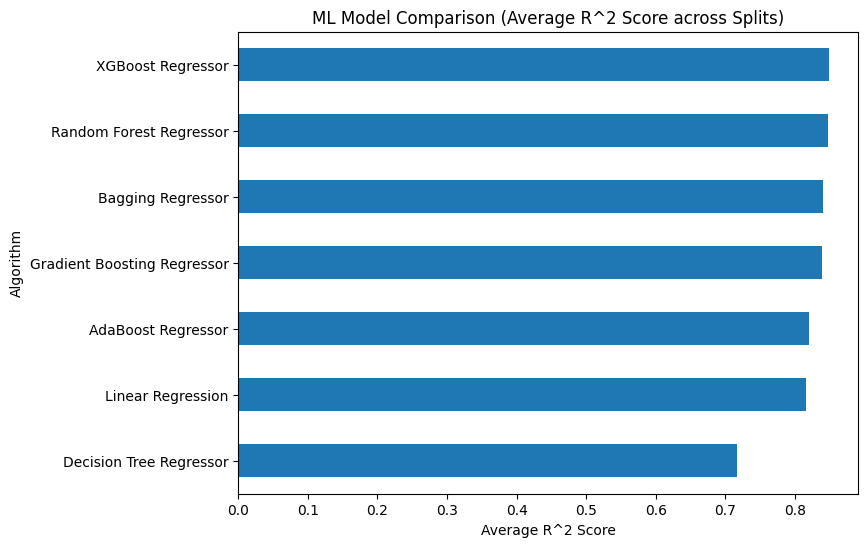

In [ ]:
import matplotlib.pyplot as plt

# Bar chart for average accuracy
df_r2_comparison.set_index("Algorithm")["Average"].sort_values().plot(kind="barh", figsize=(8,6))
plt.xlabel("Average R^2 Score")
plt.title("ML Model Comparison (Average R^2 Score across Splits)")
plt.show()

# ANN

In [ ]:
import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
from sklearn.preprocessing import StandardScaler

# Scale X
scaler_x = StandardScaler()
x_train = scaler_x.fit_transform(x_train)
x_test  = scaler_x.transform(x_test)

# Scale y
scaler_y = StandardScaler()
y_train = scaler_y.fit_transform(y_train.to_numpy().reshape(-1,1)).flatten()
y_test  = scaler_y.transform(y_test.to_numpy().reshape(-1,1)).flatten()




In [ ]:
df = pd.read_csv("/content/world-data-2023.csv")
df
x = df.drop(["Country", "Life expectancy"], axis=1)
y = df["Life expectancy"]
x

,Density\n(P/Km2),Agricultural Land( %),Land Area(Km2),Armed Forces size,Birth Rate,Co2-Emissions,CPI,CPI Change (%),Fertility Rate,Forested Area (%),Gasoline Price,GDP,Gross primary education enrollment (%),Gross tertiary education enrollment (%),Infant mortality,Maternal mortality ratio,Minimum wage,Out of pocket health expenditure,Physicians per thousand,Population,Population: Labor force participation (%),Tax revenue (%),Total tax rate,Unemployment rate,Urban_population
0,60.0,58.1,652230.0,323000.000000,32.49,8672.0,149.900000,2.300000,4.47,2.1,0.70,1.910135e+10,104.0,9.700000,47.9,638.000000,0.430000,78.4,0.28,38041754.0,48.900000,9.300000,71.400000,11.120000,9797273.0
1,105.0,43.1,28748.0,9000.000000,11.78,4536.0,119.050000,1.400000,1.62,28.1,1.36,1.527808e+10,107.0,55.000000,7.8,15.000000,1.120000,56.9,1.20,2854191.0,55.700000,18.600000,36.600000,12.330000,1747593.0
2,18.0,17.4,2381741.0,317000.000000,24.28,150006.0,151.360000,2.000000,3.02,0.8,0.28,1.699882e+11,109.9,51.400000,20.1,112.000000,0.950000,28.1,1.72,43053054.0,41.200000,37.200000,66.100000,11.700000,31510100.0
3,164.0,40.0,468.0,159274.853801,7.20,469.0,190.460955,6.722346,1.27,34.0,1.51,3.154058e+09,106.4,37.963388,2.7,160.392265,6.630000,36.4,3.33,77142.0,62.738068,16.502381,40.822404,6.886364,67873.0
4,26.0,47.5,1246700.0,117000.000000,40.73,34693.0,261.730000,17.100000,5.52,46.3,0.97,9.463542e+10,113.5,9.300000,51.6,241.000000,0.710000,33.4,0.21,31825295.0,77.500000,9.200000,49.100000,6.890000,21061025.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
183,32.0,24.5,912050.0,343000.000000,17.88,164175.0,2740.270000,254.900000,2.27,52.7,0.00,4.823593e+11,97.2,79.300000,21.4,125.000000,0.010000,45.8,1.92,28515829.0,59.700000,16.502381,73.300000,8.800000,25162368.0
184,314.0,39.3,331210.0,522000.000000,16.75,192668.0,163.520000,2.800000,2.05,48.1,0.80,2.619212e+11,110.6,28.500000,16.5,43.000000,0.730000,43.5,0.82,96462106.0,77.400000,19.100000,37.600000,2.010000,35332140.0
185,56.0,44.6,527968.0,40000.000000,30.45,10609.0,157.580000,8.100000,3.79,1.0,0.92,2.691440e+10,93.6,10.200000,42.9,164.000000,2.130201,81.0,0.31,29161922.0,38.000000,16.502381,26.600000,12.910000,10869523.0
186,25.0,32.1,752618.0,16000.000000,36.19,5141.0,212.310000,9.200000,4.63,65.2,1.40,2.306472e+10,98.7,4.100000,40.4,213.000000,0.240000,27.5,1.19,17861030.0,74.600000,16.200000,15.600000,11.430000,7871713.0


In [ ]:
y

,Life expectancy
0,64.000000
1,78.000000
2,77.000000
3,72.235294
4,61.000000
...,...
183,72.000000
184,75.000000
185,66.000000
186,63.000000


In [ ]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size= .3, random_state= 52)
x_train

,Density\n(P/Km2),Agricultural Land( %),Land Area(Km2),Armed Forces size,Birth Rate,Co2-Emissions,CPI,CPI Change (%),Fertility Rate,Forested Area (%),Gasoline Price,GDP,Gross primary education enrollment (%),Gross tertiary education enrollment (%),Infant mortality,Maternal mortality ratio,Minimum wage,Out of pocket health expenditure,Physicians per thousand,Population,Population: Labor force participation (%),Tax revenue (%),Total tax rate,Unemployment rate,Urban_population
75,464.0,60.4,3287263.0,3031000.0,17.86,2407672.0,180.44,7.7,2.22,23.8,0.970000,2.611000e+12,113.0,28.1,29.9,145.0,0.30,65.1,0.86,1.366418e+09,49.300000,11.2,49.7,5.360000,471031528.0
137,9.0,13.3,17098240.0,1454000.0,11.50,1732027.0,180.75,4.5,1.57,49.8,0.590000,1.699877e+12,102.6,81.9,6.1,17.0,0.53,36.4,4.01,1.443735e+08,61.800000,11.4,46.2,4.590000,107683889.0
104,1380.0,32.4,316.0,2000.0,9.20,1342.0,113.45,1.6,1.23,1.1,1.360000,1.478616e+10,105.0,54.3,6.1,6.0,5.07,37.1,2.86,5.026530e+05,56.500000,26.2,44.0,3.470000,475902.0
67,167.0,36.0,108889.0,43000.0,24.56,16777.0,142.92,3.7,2.87,32.7,0.790000,7.671039e+10,101.9,21.8,22.1,95.0,1.60,55.8,0.35,1.660403e+07,62.300000,10.6,35.2,2.460000,8540945.0
148,214.0,3.4,455.0,0.0,17.10,605.0,129.96,1.8,2.41,88.4,0.996724,1.698843e+09,100.4,17.1,12.4,53.0,2.00,2.5,0.95,9.762500e+04,62.738068,34.1,30.1,6.886364,55762.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
86,94.0,48.5,580367.0,29000.0,28.75,17910.0,180.51,4.7,3.49,7.8,0.950000,9.550309e+10,103.2,11.5,30.6,342.0,0.25,33.4,0.16,5.257397e+07,74.700000,15.1,37.2,2.640000,14461523.0
151,114.0,39.2,49035.0,16000.0,10.60,32424.0,115.34,2.7,1.52,40.4,1.320000,1.054223e+11,98.7,46.6,4.6,5.0,3.11,18.4,3.42,5.454073e+06,59.500000,18.7,49.7,5.560000,2930419.0
13,1265.0,70.6,148460.0,221000.0,18.18,84246.0,179.68,5.6,2.04,11.0,1.120000,3.025713e+11,116.5,20.6,25.1,173.0,0.51,71.8,0.58,1.673108e+08,59.000000,8.8,33.4,4.190000,60987417.0
11,39.0,1.4,13880.0,1000.0,13.97,1786.0,116.22,2.5,1.75,51.4,0.920000,1.282700e+10,81.4,15.1,8.3,70.0,5.25,27.8,1.94,3.894820e+05,74.600000,14.8,33.8,10.360000,323784.0


In [ ]:
import tensorflow as tf
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

tf.random.set_seed(42)

# ---------- Custom R2 metric ----------
def r2_metric(y_true, y_pred):
    ss_res = tf.reduce_sum(tf.square(y_true - y_pred))
    ss_tot = tf.reduce_sum(tf.square(y_true - tf.reduce_mean(y_true)))
    return 1 - ss_res / (ss_tot + tf.keras.backend.epsilon())

# ---------- Scale X and y ----------
scaler_x = StandardScaler()
scaler_y = StandardScaler()

x_train = scaler_x.fit_transform(np.array(x_train, dtype=np.float32))
x_test  = scaler_x.transform(np.array(x_test, dtype=np.float32))

y_train = scaler_y.fit_transform(np.array(y_train, dtype=np.float32).reshape(-1,1))
y_test  = scaler_y.transform(np.array(y_test, dtype=np.float32).reshape(-1,1))

# ---------- Model ----------
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation="relu"),
    tf.keras.layers.Dense(64, activation="relu"),
    tf.keras.layers.Dense(32, activation="relu"),
    tf.keras.layers.Dense(1)   # output is scaled y
])

# ---------- Compile ----------
model.compile(
    loss=tf.keras.losses.MeanSquaredError(),
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    metrics=[
        tf.keras.metrics.MeanAbsoluteError(name="mae"),
        tf.keras.metrics.MeanSquaredError(name="mse"),
        tf.keras.metrics.RootMeanSquaredError(name="rmse"),
        r2_metric
    ]
)

# ---------- Train ----------
history = model.fit(
    x_train, y_train,
    epochs=200,
    validation_data=(x_test, y_test),
    verbose=1
)

# ---------- Evaluate on test (inverse transform) ----------
y_pred_scaled = model.predict(x_test)
y_pred = scaler_y.inverse_transform(y_pred_scaled).flatten()
y_true = scaler_y.inverse_transform(y_test).flatten()

print("Final Evaluation on Original Scale:")
print("R²:", r2_score(y_true, y_pred))
print("MAE:", mean_absolute_error(y_true, y_pred))
print("RMSE:", np.sqrt(mean_squared_error(y_true, y_pred)))

Epoch 1/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 3s 85ms/step - loss: 0.6743 - mae: 0.6623 - mse: 0.6743 - r2_metric: 0.3473 - rmse: 0.8196 - val_loss: 0.3614 - val_mae: 0.4887 - val_mse: 0.3614 - val_r2_metric: 0.6766 - val_rmse: 0.6012
Epoch 2/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.2317 - mae: 0.3779 - mse: 0.2317 - r2_metric: 0.7747 - rmse: 0.4810 - val_loss: 0.2339 - val_mae: 0.3720 - val_mse: 0.2339 - val_r2_metric: 0.7866 - val_rmse: 0.4837
Epoch 3/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.1464 - mae: 0.3010 - mse: 0.1464 - r2_metric: 0.8549 - rmse: 0.3818 - val_loss: 0.1681 - val_mae: 0.3224 - val_mse: 0.1681 - val_r2_metric: 0.8488 - val_rmse: 0.4100
Epoch 4/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.1336 - mae: 0.2939 - mse: 0.1336 - r2_metric: 0.8686 - rmse: 0.3648 - val_loss: 0.2439 - val_mae: 0.3676 - val_mse: 0.2439 - val_r2_metric: 0.7669 - val_rmse: 0.4938
Epoch 5/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0988 - mae: 0.2460 - mse: 0.0988 - r

In [ ]:
model.evaluate(x_test, y_test)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2195 - mae: 0.3533 - mse: 0.2195 - r2_metric: 0.8021 - rmse: 0.4684


[0.2244299054145813,
 0.3567354083061218,
 0.2244299054145813,
 0.4737403392791748,
 0.7937597036361694]

In [ ]:
model.summary();

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 128)            │         3,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 41,093 (160.52 KB)

 Trainable params: 13,697 (53.50 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 27,396 (107.02 KB)

Text(0.5, 0, 'epochs')

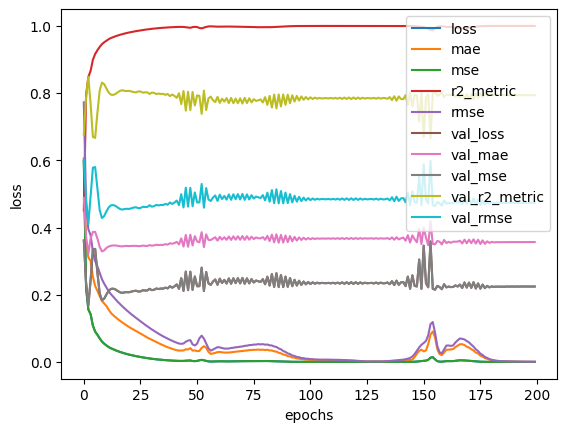

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

In [ ]:
tf.random.set_seed(42)

def r2_score(y_true, y_pred):
    ss_res = tf.reduce_sum(tf.square(y_train - y_pred))
    ss_tot = tf.reduce_sum(tf.square(y_train - tf.reduce_mean(y_true)))
    return 1 - ss_res/(ss_tot + tf.keras.backend.epsilon())
# STEP1: Creating the model

model1= tf.keras.Sequential([
                            tf.keras.layers.Dense(6, activation='relu'),
                            tf.keras.layers.Dense(1, activation='linear')
])

# STEP2: Compiling the model

model1.compile(
    loss=tf.keras.losses.MeanAbsoluteError(),
    optimizer=tf.keras.optimizers.SGD(),
    metrics=[tf.keras.metrics.MeanAbsoluteError(name="mae"),
        tf.keras.metrics.MeanSquaredError(name="mse"),
        tf.keras.metrics.MeanAbsolutePercentageError(name="mape"),
        tf.keras.metrics.RootMeanSquaredError(name="rmse"),
             r2_score])



# STEP1: Fit the model

import numpy as np

x_train = np.array(x_train, dtype=np.float32)
y_train = np.array(y_train, dtype=np.float32)
x_test  = np.array(x_test, dtype=np.float32)
y_test  = np.array(y_test, dtype=np.float32)


history= model.fit(x_train, y_train, epochs= 200, verbose=1)

Epoch 1/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.0740e-07 - mae: 1.9610e-04 - mse: 1.0740e-07 - r2_metric: 1.0000 - rmse: 3.2729e-04  
Epoch 2/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 1.0255e-07 - mae: 1.8518e-04 - mse: 1.0255e-07 - r2_metric: 1.0000 - rmse: 3.1964e-04 
Epoch 3/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 7.2389e-08 - mae: 1.6142e-04 - mse: 7.2389e-08 - r2_metric: 1.0000 - rmse: 2.6872e-04 
Epoch 4/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 7.0056e-08 - mae: 1.5493e-04 - mse: 7.0056e-08 - r2_metric: 1.0000 - rmse: 2.6420e-04 
Epoch 5/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 5.0848e-08 - mae: 1.3623e-04 - mse: 5.0848e-08 - r2_metric: 1.0000 - rmse: 2.2521e-04 
Epoch 6/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 4.8596e-08 - mae: 1.3118e-04 - mse: 4.8596e-08 - r2_metric: 1.0000 - rmse: 2.1998e-04 
Epoch 7/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 3.6039e-08 - mae: 1.1712e-04 - mse: 3.6039e-08 - r2_metric: 1.0000 - rmse: 1.8

In [ ]:
model.evaluate(x_test, y_test)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.2122 - mae: 0.3423 - mse: 0.2122 - r2_metric: 0.8081 - rmse: 0.4605 


[0.21846868097782135,
 0.34641820192337036,
 0.21846868097782135,
 0.46740633249282837,
 0.798462986946106]

Text(0.5, 0, 'epochs')

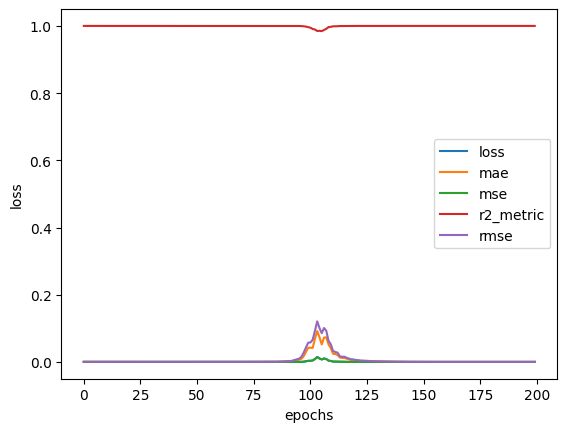

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

In [ ]:
import tensorflow as tf
import numpy as np

tf.random.set_seed(42)

# ---------- Custom R2 ----------
def r2_score(y_true, y_pred):
    ss_res = tf.reduce_sum(tf.square(y_true - y_pred))
    ss_tot = tf.reduce_sum(tf.square(y_true - tf.reduce_mean(y_true)))
    return 1 - ss_res / (ss_tot + tf.keras.backend.epsilon())

# ---------- Model ----------
model2 = tf.keras.Sequential([
    tf.keras.layers.Dense(6, activation='relu'),
    tf.keras.layers.Dense(5, activation='relu'),
    tf.keras.layers.Dense(4, activation='relu'),
    tf.keras.layers.Dense(3, activation='relu'),
    tf.keras.layers.Dense(1, activation='linear')
])

# ---------- Compile ----------
model2.compile(
    loss=tf.keras.losses.MeanAbsoluteError(),
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    metrics=[
        tf.keras.metrics.MeanAbsoluteError(name="mae"),
        tf.keras.metrics.MeanSquaredError(name="mse"),
        tf.keras.metrics.MeanAbsolutePercentageError(name="mape"),
        tf.keras.metrics.RootMeanSquaredError(name="rmse"),
        r2_score
    ]
)

# ---------- Prepare Data ----------
x_train = np.array(x_train, dtype=np.float32)
y_train = np.array(y_train, dtype=np.float32)
x_test  = np.array(x_test, dtype=np.float32)
y_test  = np.array(y_test, dtype=np.float32)

# ---------- Fit ----------
history = model2.fit(
    x_train, y_train,
    epochs=500,
    verbose=1,
    validation_data=(x_test, y_test)
)

Epoch 1/500
5/5 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step - loss: 0.8359 - mae: 0.8359 - mape: 104.5304 - mse: 1.0660 - r2_score: -0.0547 - rmse: 1.0316 - val_loss: 0.8795 - val_mae: 0.8795 - val_mape: 130.3542 - val_mse: 1.1633 - val_r2_score: -0.0373 - val_rmse: 1.0786
Epoch 2/500
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.8299 - mae: 0.8299 - mape: 103.6883 - mse: 1.0524 - r2_score: -0.0426 - rmse: 1.0250 - val_loss: 0.8734 - val_mae: 0.8734 - val_mape: 127.5267 - val_mse: 1.1522 - val_r2_score: -0.0277 - val_rmse: 1.0734
Epoch 3/500
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.8252 - mae: 0.8252 - mape: 103.3720 - mse: 1.0421 - r2_score: -0.0335 - rmse: 1.0200 - val_loss: 0.8682 - val_mae: 0.8682 - val_mape: 125.7891 - val_mse: 1.1433 - val_r2_score: -0.0197 - val_rmse: 1.0693
Epoch 4/500
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.8212 - mae: 0.8212 - mape: 103.2591 - mse: 1.0338 - r2_score: -0.0259 - rmse: 1.0159 - val_loss: 0.8636 - val_mae: 0.8636 - val_mape: 123.9361 - val

In [ ]:
model2.evaluate(x_test, y_test)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.5036 - mae: 0.5036 - mape: 201.9618 - mse: 0.3847 - r2_score: 0.6625 - rmse: 0.6200


[0.4863858222961426,
 0.4863858222961426,
 0.3688601851463318,
 179.12020874023438,
 0.6073386073112488,
 0.673723042011261]

Text(0.5, 0, 'epochs')

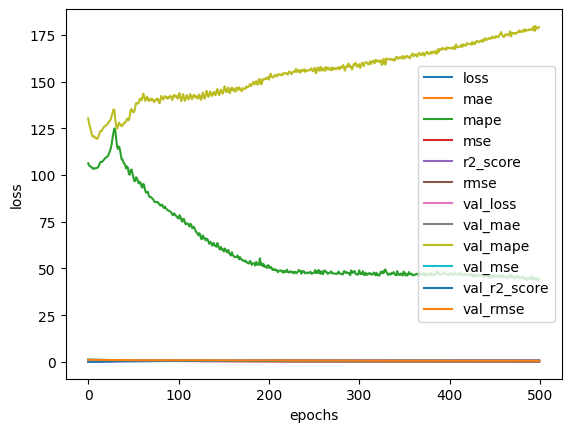

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

In [ ]:
y.describe()

,Life expectancy
count,188.000000
mean,72.235294
std,7.478185
min,53.000000
25%,67.000000
50%,73.000000
75%,77.250000
max,85.000000


In [ ]:
tf.random.set_seed(42)

# STEP1: Creating the model

model2= tf.keras.Sequential([
                            tf.keras.layers.Dense(8, activation='tanh'),
                            tf.keras.layers.Dense(5, activation='tanh'),
                            tf.keras.layers.Dense(2, activation='tanh'),
                            tf.keras.layers.Dense(1, activation='linear')
])

# STEP2: Compiling the model

model2.compile(
    loss=tf.keras.losses.mae,
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    metrics=[tf.keras.metrics.MeanAbsoluteError(name="mae"),
        tf.keras.metrics.MeanSquaredError(name="mse"),
        tf.keras.metrics.MeanAbsolutePercentageError(name="mape"),
        tf.keras.metrics.RootMeanSquaredError(name="rmse"),
        r2_score

    ]
)

# STEP1: Fit the model

history= model2.fit(x_train, y_train, epochs= 100)

Epoch 1/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.0998 - mae: 1.0998 - mape: 163.7194 - mse: 1.7667 - r2_score: -0.7560 - rmse: 1.3284
Epoch 2/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 1.0420 - mae: 1.0420 - mape: 156.0689 - mse: 1.6113 - r2_score: -0.5998 - rmse: 1.2686 
Epoch 3/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.9917 - mae: 0.9917 - mape: 148.8027 - mse: 1.4821 - r2_score: -0.4702 - rmse: 1.2167 
Epoch 4/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.9439 - mae: 0.9439 - mape: 141.6484 - mse: 1.3638 - r2_score: -0.3521 - rmse: 1.1671 
Epoch 5/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.8994 - mae: 0.8994 - mape: 135.3535 - mse: 1.2562 - r2_score: -0.2449 - rmse: 1.1200 
Epoch 6/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.8592 - mae: 0.8592 - mape: 131.2571 - mse: 1.1585 - r2_score: -0.1479 - rmse: 1.0756 
Epoch 7/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.8228 - mae: 0.8228 - mape: 128.3905 - mse: 1.0701 - r2_score: -0.0604 - 

In [ ]:
model2.evaluate(x_test, y_test)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.3616 - mae: 0.3616 - mape: 148.6905 - mse: 0.2279 - r2_score: 0.7901 - rmse: 0.4767 


[0.3729054033756256,
 0.3729054033756256,
 0.2447599172592163,
 134.7904052734375,
 0.49473217129707336,
 0.7690389156341553]

Text(0.5, 0, 'epochs')

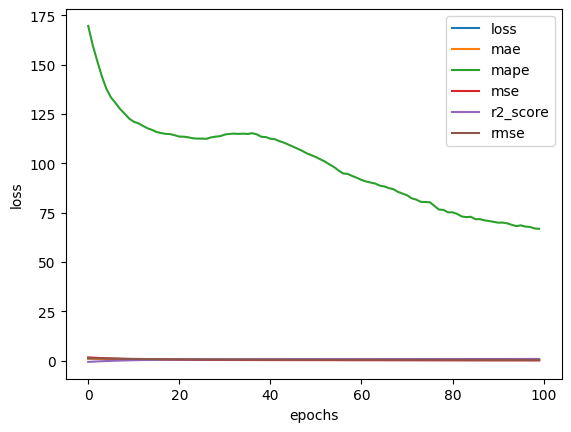

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

In [ ]:
tf.random.set_seed(42)

# STEP1: Creating the model

model2= tf.keras.Sequential([
                            tf.keras.layers.Dense(6, activation='relu'),
                            tf.keras.layers.Dense(5, activation='tanh'),
                            tf.keras.layers.Dense(2, activation='tanh'),
                            tf.keras.layers.Dense(1, activation='linear')

])

# STEP2: Compiling the model

model2.compile(
    loss=tf.keras.losses.mae,
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    metrics=[
             tf.keras.metrics.MeanAbsoluteError(name="mae"),
        tf.keras.metrics.MeanSquaredError(name="mse"),
        tf.keras.metrics.MeanAbsolutePercentageError(name="mape"),
        tf.keras.metrics.RootMeanSquaredError(name="rmse"),
        r2_score

    ]
)

# STEP1: Fit the model

history= model2.fit(x_train, y_train, epochs= 250)

Epoch 1/250
5/5 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - loss: 1.0878 - mae: 1.0878 - mape: 186.2367 - mse: 1.8956 - r2_score: -0.8591 - rmse: 1.3747
Epoch 2/250
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 1.0336 - mae: 1.0336 - mape: 179.4811 - mse: 1.7429 - r2_score: -0.7071 - rmse: 1.3178
Epoch 3/250
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.9908 - mae: 0.9908 - mape: 174.9633 - mse: 1.6224 - r2_score: -0.5869 - rmse: 1.2711
Epoch 4/250
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.9518 - mae: 0.9518 - mape: 170.6607 - mse: 1.5157 - r2_score: -0.4805 - rmse: 1.2283
Epoch 5/250
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.9174 - mae: 0.9174 - mape: 167.0407 - mse: 1.4183 - r2_score: -0.3833 - rmse: 1.1879
Epoch 6/250
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.8839 - mae: 0.8839 - mape: 163.7637 - mse: 1.3265 - r2_score: -0.2914 - rmse: 1.1485
Epoch 7/250
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.8490 - mae: 0.8490 - mape: 159.8665 - mse: 1.2374 - r2_score: -0.2017 -

In [ ]:
model2.evaluate(x_test, y_test)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.3983 - mae: 0.3983 - mape: 222.5083 - mse: 0.3059 - r2_score: 0.7397 - rmse: 0.5515 


[0.3813540041446686,
 0.3813540041446686,
 0.2719617187976837,
 189.98931884765625,
 0.521499514579773,
 0.7711575031280518]

Text(0.5, 0, 'epochs')

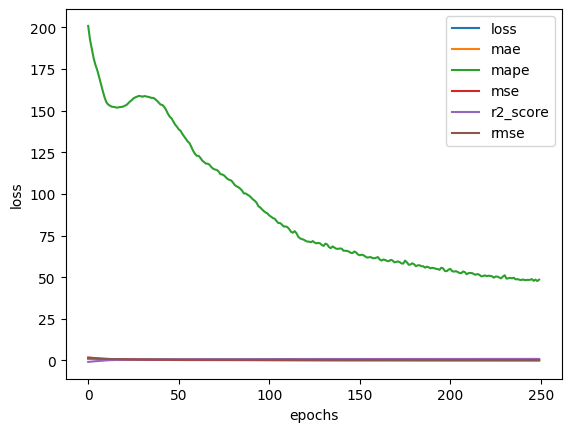

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

In [ ]:
import tensorflow as tf
import numpy as np

tf.random.set_seed(42)

# Custom R² metric
def r2_score(y_true, y_pred):
    ss_res = tf.reduce_sum(tf.square(y_true - y_pred))
    ss_tot = tf.reduce_sum(tf.square(y_true - tf.reduce_mean(y_true)))
    return 1 - ss_res/(ss_tot + tf.keras.backend.epsilon())

# STEP1: Create the model
model2 = tf.keras.Sequential([
    tf.keras.layers.Dense(6, activation='tanh'),
    tf.keras.layers.Dense(6, activation='tanh'),
    tf.keras.layers.Dense(1, activation=None)  # linear activation for regression
])

# STEP2: Compile the model
model2.compile(
    loss="mae",   # or "mse"
    optimizer=tf.keras.optimizers.SGD(learning_rate=0.01, momentum=0.9),
    metrics=[
        tf.keras.metrics.MeanAbsoluteError(name="mae"),
        tf.keras.metrics.MeanSquaredError(name="mse"),
        tf.keras.metrics.MeanAbsolutePercentageError(name="mape"),
        tf.keras.metrics.RootMeanSquaredError(name="rmse"),
        r2_score
    ]
)

# Convert data to numpy (float32)
x_train = np.array(x_train, dtype=np.float32)
y_train = np.array(y_train, dtype=np.float32)
x_test  = np.array(x_test, dtype=np.float32)
y_test  = np.array(y_test, dtype=np.float32)

# STEP3: Fit the model
history = model2.fit(x_train, y_train, epochs=600, validation_data=(x_test, y_test))


Epoch 1/600
5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - loss: 0.8683 - mae: 0.8683 - mape: 160.4807 - mse: 1.1668 - r2_score: -0.1936 - rmse: 1.0790 - val_loss: 0.7629 - val_mae: 0.7629 - val_mape: 146.2530 - val_mse: 0.9434 - val_r2_score: 0.1438 - val_rmse: 0.9713
Epoch 2/600
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.6833 - mae: 0.6833 - mape: 143.0799 - mse: 0.7589 - r2_score: 0.2151 - rmse: 0.8703 - val_loss: 0.6116 - val_mae: 0.6116 - val_mape: 166.7591 - val_mse: 0.6097 - val_r2_score: 0.4381 - val_rmse: 0.7808
Epoch 3/600
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.5067 - mae: 0.5067 - mape: 137.3142 - mse: 0.4414 - r2_score: 0.5479 - rmse: 0.6629 - val_loss: 0.5350 - val_mae: 0.5350 - val_mape: 188.8350 - val_mse: 0.5011 - val_r2_score: 0.5279 - val_rmse: 0.7079
Epoch 4/600
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.4495 - mae: 0.4495 - mape: 146.3260 - mse: 0.3399 - r2_score: 0.6616 - rmse: 0.5807 - val_loss: 0.4969 - val_mae: 0.4969 - val_mape: 187.1924 - val_mse:

In [ ]:
model2.evaluate(x_test, y_test)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.4997 - mae: 0.4997 - mape: 172.6186 - mse: 0.4273 - r2_score: 0.6229 - rmse: 0.6535


[0.49665766954421997,
 0.49665766954421997,
 0.4154597222805023,
 157.09970092773438,
 0.6445616483688354,
 0.6292963027954102]

Text(0.5, 0, 'epochs')

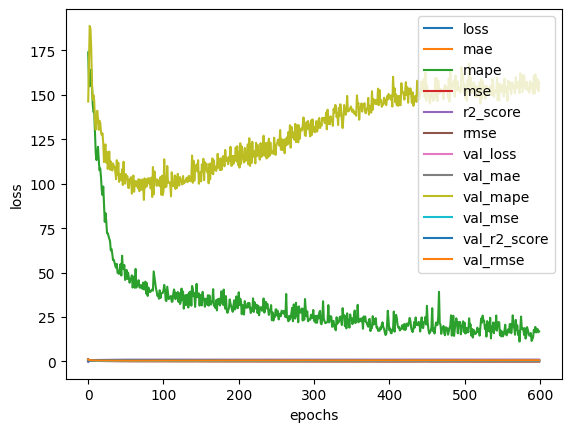

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

In [ ]:
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation="relu"),
    tf.keras.layers.Dense(64, activation="relu"),
    tf.keras.layers.Dense(32, activation="relu"),
    tf.keras.layers.Dense(1)
])

model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    loss="mse",
    metrics=[
        tf.keras.metrics.MeanAbsoluteError(name="mae"),
        tf.keras.metrics.RootMeanSquaredError(name="rmse")
    ]
)
history = model.fit(
    x_train, y_train,
    epochs=200,
    validation_data=(x_test, y_test),
    verbose=1
)

Epoch 1/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - loss: 1.1785 - mae: 0.8203 - rmse: 1.0850 - val_loss: 0.8811 - val_mae: 0.7312 - val_rmse: 0.9387
Epoch 2/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.5464 - mae: 0.5622 - rmse: 0.7380 - val_loss: 0.5492 - val_mae: 0.5958 - val_rmse: 0.7411
Epoch 3/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.3299 - mae: 0.4234 - rmse: 0.5717 - val_loss: 0.5444 - val_mae: 0.5331 - val_rmse: 0.7379
Epoch 4/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.2266 - mae: 0.3454 - rmse: 0.4716 - val_loss: 0.6018 - val_mae: 0.4967 - val_rmse: 0.7757
Epoch 5/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.1804 - mae: 0.3293 - rmse: 0.4213 - val_loss: 0.5835 - val_mae: 0.4542 - val_rmse: 0.7638
Epoch 6/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.1434 - mae: 0.2887 - rmse: 0.3756 - val_loss: 0.4459 - val_mae: 0.4095 - val_rmse: 0.6678
Epoch 7/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1181 - mae: 0.2578 - rmse: 0.3405 - val_

In [ ]:
model2.evaluate(x_test, y_test)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.4997 - mae: 0.4997 - mape: 172.6186 - mse: 0.4273 - r2_score: 0.6229 - rmse: 0.6535


[0.49665766954421997,
 0.49665766954421997,
 0.4154597222805023,
 157.09970092773438,
 0.6445616483688354,
 0.6292963027954102]

Text(0.5, 0, 'epochs')

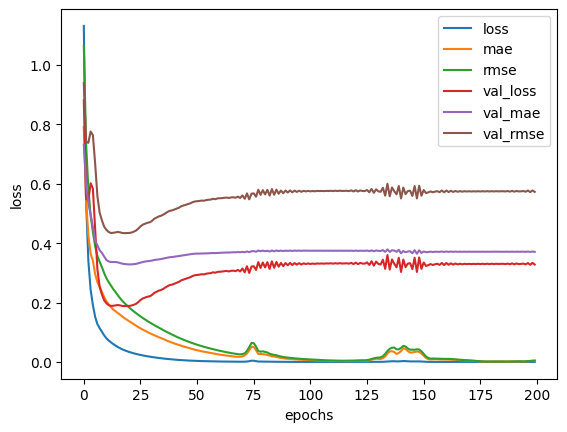

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

# ANN (80-20)

In [ ]:
import tensorflow as tf
import pandas as pd
import matplotlib.pyplot as plt

In [ ]:
from sklearn.preprocessing import StandardScaler

# Scale X
scaler_x = StandardScaler()
x_train = scaler_x.fit_transform(x_train)
x_test  = scaler_x.transform(x_test)

# Scale y
scaler_y = StandardScaler()
y_train = scaler_y.fit_transform(y_train.reshape(-1,1)).flatten()
y_test = scaler_y.transform(y_test.reshape(-1,1)).flatten()

In [ ]:
x.columns

Index(['Density\n(P/Km2)', 'Agricultural Land( %)', 'Land Area(Km2)',
       'Armed Forces size', 'Birth Rate', 'Co2-Emissions', 'CPI',
       'CPI Change (%)', 'Fertility Rate', 'Forested Area (%)',
       'Gasoline Price', 'GDP', 'Gross primary education enrollment (%)',
       'Gross tertiary education enrollment (%)', 'Infant mortality',
       'Maternal mortality ratio', 'Minimum wage',
       'Out of pocket health expenditure', 'Physicians per thousand',
       'Population', 'Population: Labor force participation (%)',
       'Tax revenue (%)', 'Total tax rate', 'Unemployment rate',
       'Urban_population'],
      dtype='object')

In [ ]:
import tensorflow as tf
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

tf.random.set_seed(42)

# ---------- Custom R2 metric ----------
def r2_metric(y_true, y_pred):
    ss_res = tf.reduce_sum(tf.square(y_true - y_pred))
    ss_tot = tf.reduce_sum(tf.square(y_true - tf.reduce_mean(y_true)))
    return 1 - ss_res / (ss_tot + tf.keras.backend.epsilon())

# ---------- Scale X and y ----------
scaler_x = StandardScaler()
scaler_y = StandardScaler()

x_train = scaler_x.fit_transform(np.array(x_train, dtype=np.float32))
x_test  = scaler_x.transform(np.array(x_test, dtype=np.float32))

y_train = scaler_y.fit_transform(np.array(y_train, dtype=np.float32).reshape(-1,1))
y_test  = scaler_y.transform(np.array(y_test, dtype=np.float32).reshape(-1,1))

# ---------- Model ----------
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation="relu"),
    tf.keras.layers.Dense(64, activation="relu"),
    tf.keras.layers.Dense(32, activation="relu"),
    tf.keras.layers.Dense(1)   # output is scaled y
])

# ---------- Compile ----------
model.compile(
    loss=tf.keras.losses.MeanSquaredError(),
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    metrics=[
        tf.keras.metrics.MeanAbsoluteError(name="mae"),
        tf.keras.metrics.MeanSquaredError(name="mse"),
        tf.keras.metrics.RootMeanSquaredError(name="rmse"),
        r2_metric
    ]
)

# ---------- Train ----------
history = model.fit(
    x_train, y_train,
    epochs=200,
    validation_data=(x_test, y_test),
    verbose=1
)

# ---------- Evaluate on test (inverse transform) ----------
y_pred_scaled = model.predict(x_test)
y_pred = scaler_y.inverse_transform(y_pred_scaled).flatten()
y_true = scaler_y.inverse_transform(y_test).flatten()

print("Final Evaluation on Original Scale:")
print("R²:", r2_score(y_true, y_pred))
print("MAE:", mean_absolute_error(y_true, y_pred))
print("RMSE:", np.sqrt(mean_squared_error(y_true, y_pred)))

Epoch 1/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 1.2565 - mae: 0.8949 - mse: 1.2565 - r2_metric: -0.2286 - rmse: 1.1196 - val_loss: 1.2443 - val_mae: 0.8348 - val_mse: 1.2443 - val_r2_metric: -0.1196 - val_rmse: 1.1155
Epoch 2/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.5898 - mae: 0.6226 - mse: 0.5898 - r2_metric: 0.4428 - rmse: 0.7667 - val_loss: 0.4935 - val_mae: 0.5678 - val_mse: 0.4935 - val_r2_metric: 0.5634 - val_rmse: 0.7025
Epoch 3/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.2810 - mae: 0.4355 - mse: 0.2810 - r2_metric: 0.7407 - rmse: 0.5290 - val_loss: 0.2267 - val_mae: 0.3832 - val_mse: 0.2267 - val_r2_metric: 0.8001 - val_rmse: 0.4761
Epoch 4/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1473 - mae: 0.3050 - mse: 0.1473 - r2_metric: 0.8563 - rmse: 0.3827 - val_loss: 0.2188 - val_mae: 0.3758 - val_mse: 0.2188 - val_r2_metric: 0.8018 - val_rmse: 0.4678
Epoch 5/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.1248 - mae: 0.2803 - mse: 0.1248 -

In [ ]:
model.evaluate(x_test, y_test)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1614 - mae: 0.3221 - mse: 0.1614 - r2_metric: 0.8595 - rmse: 0.4014


[0.15180714428424835,
 0.3123264014720917,
 0.15180714428424835,
 0.38962435722351074,
 0.8673210740089417]

In [ ]:
model.summary();

Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_26 (Dense)                │ (None, 128)            │         3,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_27 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_28 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_29 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 41,093 (160.52 KB)

 Trainable params: 13,697 (53.50 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 27,396 (107.02 KB)

Text(0.5, 0, 'epochs')

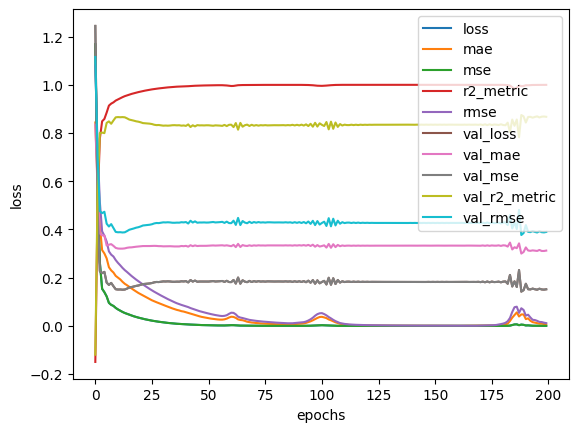

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

In [ ]:
tf.random.set_seed(42)

def r2_score(y_true, y_pred):
    ss_res = tf.reduce_sum(tf.square(y_train - y_pred))
    ss_tot = tf.reduce_sum(tf.square(y_train - tf.reduce_mean(y_true)))
    return 1 - ss_res/(ss_tot + tf.keras.backend.epsilon())
# STEP1: Creating the model

model1= tf.keras.Sequential([
                            tf.keras.layers.Dense(6, activation='relu'),
                            tf.keras.layers.Dense(1, activation='linear')
])

# STEP2: Compiling the model

model1.compile(
    loss=tf.keras.losses.MeanAbsoluteError(),
    optimizer=tf.keras.optimizers.SGD(),
    metrics=[tf.keras.metrics.MeanAbsoluteError(name="mae"),
        tf.keras.metrics.MeanSquaredError(name="mse"),
        tf.keras.metrics.MeanAbsolutePercentageError(name="mape"),
        tf.keras.metrics.RootMeanSquaredError(name="rmse"),
             r2_score])



# STEP1: Fit the model

import numpy as np

x_train = np.array(x_train, dtype=np.float32)
y_train = np.array(y_train, dtype=np.float32)
x_test  = np.array(x_test, dtype=np.float32)
y_test  = np.array(y_test, dtype=np.float32)


history= model.fit(x_train, y_train, epochs= 200, verbose=1)

Epoch 1/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 1.4558e-04 - mae: 0.0055 - mse: 1.4558e-04 - r2_metric: 0.9998 - rmse: 0.0118 
Epoch 2/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.2339e-04 - mae: 0.0051 - mse: 1.2339e-04 - r2_metric: 0.9999 - rmse: 0.0110
Epoch 3/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.0239e-04 - mae: 0.0048 - mse: 1.0239e-04 - r2_metric: 0.9999 - rmse: 0.0100 
Epoch 4/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 8.8077e-05 - mae: 0.0044 - mse: 8.8077e-05 - r2_metric: 0.9999 - rmse: 0.0092 
Epoch 5/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 7.1403e-05 - mae: 0.0039 - mse: 7.1403e-05 - r2_metric: 0.9999 - rmse: 0.0083
Epoch 6/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 5.6650e-05 - mae: 0.0031 - mse: 5.6650e-05 - r2_metric: 0.9999 - rmse: 0.0074 
Epoch 7/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 5.0929e-05 - mae: 0.0030 - mse: 5.0929e-05 - r2_metric: 0.9999 - rmse: 0.0070 
Epoch 8/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/ste

In [ ]:
model.evaluate(x_test, y_test)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1643 - mae: 0.3215 - mse: 0.1643 - r2_metric: 0.8559 - rmse: 0.4052


[0.1573215276002884,
 0.31483298540115356,
 0.1573215276002884,
 0.39663776755332947,
 0.8609700202941895]

Text(0.5, 0, 'epochs')

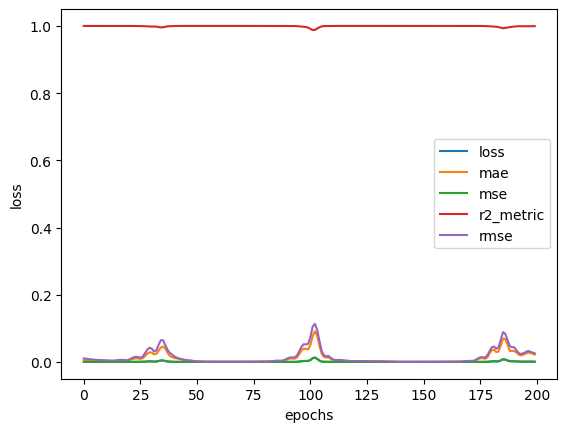

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

In [ ]:
y.describe()

,Life expectancy
count,188.000000
mean,72.235294
std,7.478185
min,53.000000
25%,67.000000
50%,73.000000
75%,77.250000
max,85.000000


In [ ]:
tf.random.set_seed(42)

# STEP1: Creating the model

model2= tf.keras.Sequential([
                            tf.keras.layers.Dense(8, activation='tanh'),
                            tf.keras.layers.Dense(5, activation='tanh'),
                            tf.keras.layers.Dense(2, activation='tanh'),
                            tf.keras.layers.Dense(1, activation='linear')
])

# STEP2: Compiling the model

model2.compile(
    loss=tf.keras.losses.mae,
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    metrics=[tf.keras.metrics.MeanAbsoluteError(name="mae"),
        tf.keras.metrics.MeanSquaredError(name="mse"),
        tf.keras.metrics.MeanAbsolutePercentageError(name="mape"),
        tf.keras.metrics.RootMeanSquaredError(name="rmse"),
        r2_score

    ]
)

# STEP1: Fit the model

history= model.fit(x_train, y_train, epochs= 100)

Epoch 1/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 5.8922e-04 - mae: 0.0211 - mse: 5.8922e-04 - r2_metric: 0.9994 - rmse: 0.0242  
Epoch 2/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 4.6956e-04 - mae: 0.0190 - mse: 4.6956e-04 - r2_metric: 0.9995 - rmse: 0.0216
Epoch 3/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 3.5103e-04 - mae: 0.0163 - mse: 3.5103e-04 - r2_metric: 0.9997 - rmse: 0.0187 
Epoch 4/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 2.4300e-04 - mae: 0.0134 - mse: 2.4300e-04 - r2_metric: 0.9998 - rmse: 0.0155 
Epoch 5/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 1.4479e-04 - mae: 0.0103 - mse: 1.4479e-04 - r2_metric: 0.9999 - rmse: 0.0120 
Epoch 6/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 7.9773e-05 - mae: 0.0076 - mse: 7.9773e-05 - r2_metric: 0.9999 - rmse: 0.0089 
Epoch 7/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 4.0160e-05 - mae: 0.0052 - mse: 4.0160e-05 - r2_metric: 1.0000 - rmse: 0.0063 
Epoch 8/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/ste

In [ ]:

model.evaluate(x_test, y_test)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1631 - mae: 0.3192 - mse: 0.1631 - r2_metric: 0.8562 - rmse: 0.4038


[0.15818777680397034,
 0.31417134404182434,
 0.15818777680397034,
 0.3977282643318176,
 0.8590753674507141]

Text(0.5, 0, 'epochs')

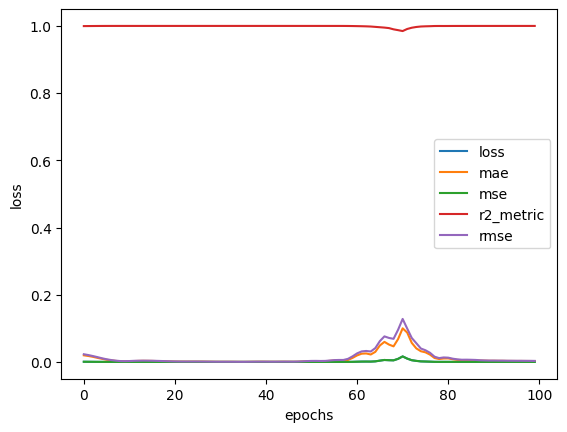

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

In [ ]:
tf.random.set_seed(42)

# STEP1: Creating the model

model2= tf.keras.Sequential([
                            tf.keras.layers.Dense(6, activation='relu'),
                            tf.keras.layers.Dense(5, activation='tanh'),
                            tf.keras.layers.Dense(2, activation='tanh'),
                            tf.keras.layers.Dense(1, activation='linear')

])

# STEP2: Compiling the model

model2.compile(
    loss=tf.keras.losses.mae,
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    metrics=[
             tf.keras.metrics.MeanAbsoluteError(name="mae"),
        tf.keras.metrics.MeanSquaredError(name="mse"),
        tf.keras.metrics.MeanAbsolutePercentageError(name="mape"),
        tf.keras.metrics.RootMeanSquaredError(name="rmse"),
        r2_score

    ]
)

# STEP1: Fit the model

history= model.fit(x_train, y_train, epochs= 250)

Epoch 1/250
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 5.9481e-06 - mae: 0.0020 - mse: 5.9481e-06 - r2_metric: 1.0000 - rmse: 0.0023     
Epoch 2/250
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 5.4842e-06 - mae: 0.0020 - mse: 5.4842e-06 - r2_metric: 1.0000 - rmse: 0.0023     
Epoch 3/250
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 5.1357e-06 - mae: 0.0019 - mse: 5.1357e-06 - r2_metric: 1.0000 - rmse: 0.0022     
Epoch 4/250
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 4.7076e-06 - mae: 0.0018 - mse: 4.7076e-06 - r2_metric: 1.0000 - rmse: 0.0021    
Epoch 5/250
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 4.3312e-06 - mae: 0.0017 - mse: 4.3312e-06 - r2_metric: 1.0000 - rmse: 0.0020     
Epoch 6/250
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 3.9390e-06 - mae: 0.0017 - mse: 3.9390e-06 - r2_metric: 1.0000 - rmse: 0.0019     
Epoch 7/250
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 3.6164e-06 - mae: 0.0016 - mse: 3.6164e-06 - r2_metric: 1.0000 - rmse: 0.0019    
Epoch 8/250
5/5 ━━━

In [ ]:
model.evaluate(x_test, y_test)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1700 - mae: 0.3273 - mse: 0.1700 - r2_metric: 0.8492 - rmse: 0.4123


[0.1672118455171585,
 0.32479041814804077,
 0.1672118455171585,
 0.4089154601097107,
 0.8497775197029114]

Text(0.5, 0, 'epochs')

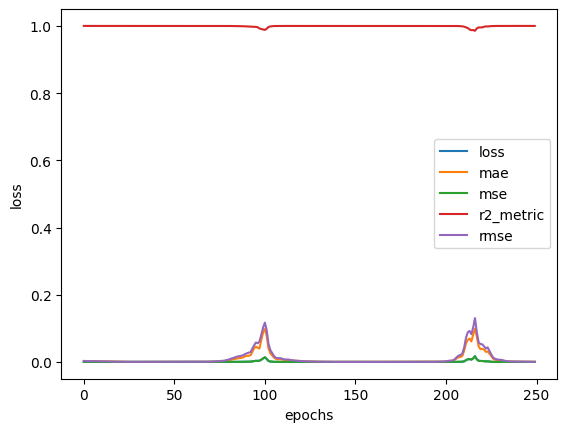

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

In [ ]:
import tensorflow as tf
import numpy as np

tf.random.set_seed(42)

# Custom R² metric
def r2_score(y_true, y_pred):
    ss_res = tf.reduce_sum(tf.square(y_true - y_pred))
    ss_tot = tf.reduce_sum(tf.square(y_true - tf.reduce_mean(y_true)))
    return 1 - ss_res/(ss_tot + tf.keras.backend.epsilon())

# STEP1: Create the model
model2 = tf.keras.Sequential([
    tf.keras.layers.Dense(6, activation='tanh'),
    tf.keras.layers.Dense(6, activation='tanh'),
    tf.keras.layers.Dense(1, activation=None)  # linear activation for regression
])

# STEP2: Compile the model
model2.compile(
    loss="mae",   # or "mse"
    optimizer=tf.keras.optimizers.SGD(learning_rate=0.01, momentum=0.9),
    metrics=[
        tf.keras.metrics.MeanAbsoluteError(name="mae"),
        tf.keras.metrics.MeanSquaredError(name="mse"),
        tf.keras.metrics.MeanAbsolutePercentageError(name="mape"),
        tf.keras.metrics.RootMeanSquaredError(name="rmse"),
        r2_score
    ]
)

# Convert data to numpy (float32)
x_train = np.array(x_train, dtype=np.float32)
y_train = np.array(y_train, dtype=np.float32)
x_test  = np.array(x_test, dtype=np.float32)
y_test  = np.array(y_test, dtype=np.float32)

# STEP3: Fit the model
history = model2.fit(x_train, y_train, epochs=600, validation_data=(x_test, y_test))


Epoch 1/600
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - loss: 0.8090 - mae: 0.8090 - mape: 178.6083 - mse: 1.0735 - r2_score: -0.0203 - rmse: 1.0337 - val_loss: 0.7434 - val_mae: 0.7434 - val_mape: 162.6097 - val_mse: 0.9005 - val_r2_score: 0.1917 - val_rmse: 0.9489
Epoch 2/600
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.6147 - mae: 0.6147 - mape: 152.6052 - mse: 0.6473 - r2_score: 0.3659 - rmse: 0.8029 - val_loss: 0.5886 - val_mae: 0.5886 - val_mape: 174.4292 - val_mse: 0.5888 - val_r2_score: 0.4690 - val_rmse: 0.7674
Epoch 3/600
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.4730 - mae: 0.4730 - mape: 138.3522 - mse: 0.3853 - r2_score: 0.6038 - rmse: 0.6173 - val_loss: 0.5139 - val_mae: 0.5139 - val_mape: 171.8469 - val_mse: 0.4548 - val_r2_score: 0.5863 - val_rmse: 0.6744
Epoch 4/600
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.4163 - mae: 0.4163 - mape: 131.7966 - mse: 0.3080 - r2_score: 0.6783 - rmse: 0.5504 - val_loss: 0.4818 - val_mae: 0.4818 - val_mape: 181.1881 - val_mse: 

In [ ]:
model2.evaluate(x_test, y_test)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.4903 - mae: 0.4903 - mape: 195.7496 - mse: 0.3815 - r2_score: 0.6693 - rmse: 0.6170


[0.47206807136535645,
 0.47206807136535645,
 0.3553141951560974,
 173.2159423828125,
 0.5960823893547058,
 0.6914635896682739]

Text(0.5, 0, 'epochs')

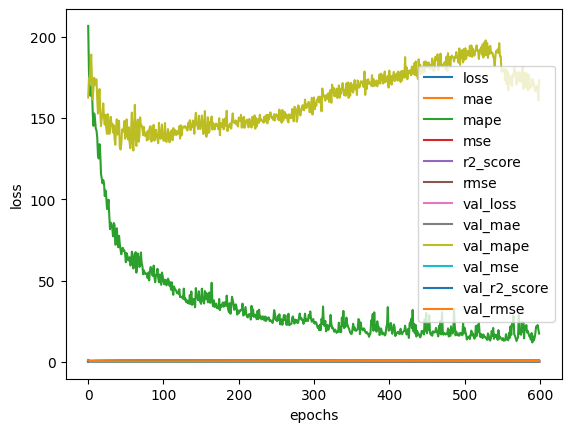

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

In [ ]:
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation="relu"),
    tf.keras.layers.Dense(64, activation="relu"),
    tf.keras.layers.Dense(32, activation="relu"),
    tf.keras.layers.Dense(1)
])

model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    loss="mse",
    metrics=[
        tf.keras.metrics.MeanAbsoluteError(name="mae"),
        tf.keras.metrics.RootMeanSquaredError(name="rmse")
    ]
)
history = model.fit(
    x_train, y_train,
    epochs=200,
    validation_data=(x_test, y_test),
    verbose=1
)

Epoch 1/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step - loss: 0.8111 - mae: 0.7602 - rmse: 0.8997 - val_loss: 0.4786 - val_mae: 0.5653 - val_rmse: 0.6918
Epoch 2/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.3187 - mae: 0.4498 - rmse: 0.5644 - val_loss: 0.2945 - val_mae: 0.4272 - val_rmse: 0.5427
Epoch 3/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.1546 - mae: 0.3070 - rmse: 0.3927 - val_loss: 0.3325 - val_mae: 0.4067 - val_rmse: 0.5767
Epoch 4/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1307 - mae: 0.2917 - rmse: 0.3609 - val_loss: 0.3558 - val_mae: 0.4163 - val_rmse: 0.5965
Epoch 5/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1206 - mae: 0.2805 - rmse: 0.3470 - val_loss: 0.3005 - val_mae: 0.3982 - val_rmse: 0.5482
Epoch 6/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0914 - mae: 0.2462 - rmse: 0.3020 - val_loss: 0.2665 - val_mae: 0.3837 - val_rmse: 0.5163
Epoch 7/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0779 - mae: 0.2206 - rmse: 0.2782 - val_

In [ ]:
model2.evaluate(x_test, y_test)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.4903 - mae: 0.4903 - mape: 195.7496 - mse: 0.3815 - r2_score: 0.6693 - rmse: 0.6170


[0.47206807136535645,
 0.47206807136535645,
 0.3553141951560974,
 173.2159423828125,
 0.5960823893547058,
 0.6914635896682739]

Text(0.5, 0, 'epochs')

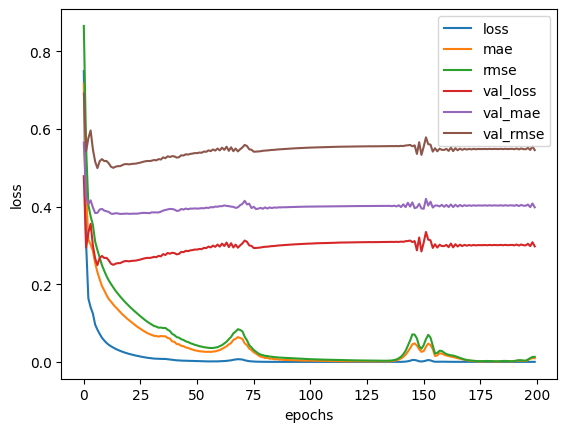

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

# ANN(60-40)

In [ ]:
import tensorflow as tf

In [ ]:
from sklearn.preprocessing import StandardScaler

# Scale X
scaler_x = StandardScaler()
x_train = scaler_x.fit_transform(x_train)
x_test  = scaler_x.transform(x_test)

# Scale y
scaler_y = StandardScaler()
y_train = scaler_y.fit_transform(y_train.reshape(-1,1)).flatten()
y_test = scaler_y.transform(y_test.reshape(-1,1)).flatten()

In [ ]:
x.columns

Index(['Density\n(P/Km2)', 'Agricultural Land( %)', 'Land Area(Km2)',
       'Armed Forces size', 'Birth Rate', 'Co2-Emissions', 'CPI',
       'CPI Change (%)', 'Fertility Rate', 'Forested Area (%)',
       'Gasoline Price', 'GDP', 'Gross primary education enrollment (%)',
       'Gross tertiary education enrollment (%)', 'Infant mortality',
       'Maternal mortality ratio', 'Minimum wage',
       'Out of pocket health expenditure', 'Physicians per thousand',
       'Population', 'Population: Labor force participation (%)',
       'Tax revenue (%)', 'Total tax rate', 'Unemployment rate',
       'Urban_population'],
      dtype='object')

In [ ]:
import tensorflow as tf
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

tf.random.set_seed(42)

# ---------- Custom R2 metric ----------
def r2_metric(y_true, y_pred):
    ss_res = tf.reduce_sum(tf.square(y_true - y_pred))
    ss_tot = tf.reduce_sum(tf.square(y_true - tf.reduce_mean(y_true)))
    return 1 - ss_res / (ss_tot + tf.keras.backend.epsilon())

# ---------- Scale X and y ----------
scaler_x = StandardScaler()
scaler_y = StandardScaler()

x_train = scaler_x.fit_transform(np.array(x_train, dtype=np.float32))
x_test  = scaler_x.transform(np.array(x_test, dtype=np.float32))

y_train = scaler_y.fit_transform(np.array(y_train, dtype=np.float32).reshape(-1,1))
y_test  = scaler_y.transform(np.array(y_test, dtype=np.float32).reshape(-1,1))

# ---------- Model ----------
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation="relu"),
    tf.keras.layers.Dense(64, activation="relu"),
    tf.keras.layers.Dense(32, activation="relu"),
    tf.keras.layers.Dense(1)   # output is scaled y
])

# ---------- Compile ----------
model.compile(
    loss=tf.keras.losses.MeanSquaredError(),
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    metrics=[
        tf.keras.metrics.MeanAbsoluteError(name="mae"),
        tf.keras.metrics.MeanSquaredError(name="mse"),
        tf.keras.metrics.RootMeanSquaredError(name="rmse"),
        r2_metric
    ]
)

# ---------- Train ----------
history = model.fit(
    x_train, y_train,
    epochs=200,
    validation_data=(x_test, y_test),
    verbose=1
)

# ---------- Evaluate on test (inverse transform) ----------
y_pred_scaled = model.predict(x_test)
y_pred = scaler_y.inverse_transform(y_pred_scaled).flatten()
y_true = scaler_y.inverse_transform(y_test).flatten()

print("Final Evaluation on Original Scale:")
print("R²:", r2_score(y_true, y_pred))
print("MAE:", mean_absolute_error(y_true, y_pred))
print("RMSE:", np.sqrt(mean_squared_error(y_true, y_pred)))

Epoch 1/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 81ms/step - loss: 1.1119 - mae: 0.8430 - mse: 1.1119 - r2_metric: -0.0919 - rmse: 1.0531 - val_loss: 0.8440 - val_mae: 0.6785 - val_mse: 0.8440 - val_r2_metric: 0.2416 - val_rmse: 0.9187
Epoch 2/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.5336 - mae: 0.5762 - mse: 0.5336 - r2_metric: 0.4895 - rmse: 0.7298 - val_loss: 0.3627 - val_mae: 0.4827 - val_mse: 0.3627 - val_r2_metric: 0.6799 - val_rmse: 0.6022
Epoch 3/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2762 - mae: 0.4170 - mse: 0.2762 - r2_metric: 0.7391 - rmse: 0.5251 - val_loss: 0.2233 - val_mae: 0.3689 - val_mse: 0.2233 - val_r2_metric: 0.7950 - val_rmse: 0.4725
Epoch 4/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1816 - mae: 0.3335 - mse: 0.1816 - r2_metric: 0.8207 - rmse: 0.4252 - val_loss: 0.2564 - val_mae: 0.3764 - val_mse: 0.2564 - val_r2_metric: 0.7526 - val_rmse: 0.5064
Epoch 5/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1602 - mae: 0.3100 - mse: 0.1602 - 

1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Final Evaluation on Original Scale:
R²: 0.843596875667572
MAE: 0.3319002091884613
RMSE: 0.41753862656292107


In [ ]:
model.evaluate(x_test, y_test)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1824 - mae: 0.3390 - mse: 0.1824 - r2_metric: 0.8402 - rmse: 0.4269


[0.17433851957321167,
 0.3319002091884613,
 0.17433851957321167,
 0.4175386428833008,
 0.8460924625396729]

In [ ]:
model.summary();

Model: "sequential_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_47 (Dense)                │ (None, 128)            │         3,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_48 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_49 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_50 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 41,093 (160.52 KB)

 Trainable params: 13,697 (53.50 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 27,396 (107.02 KB)

Text(0.5, 0, 'epochs')

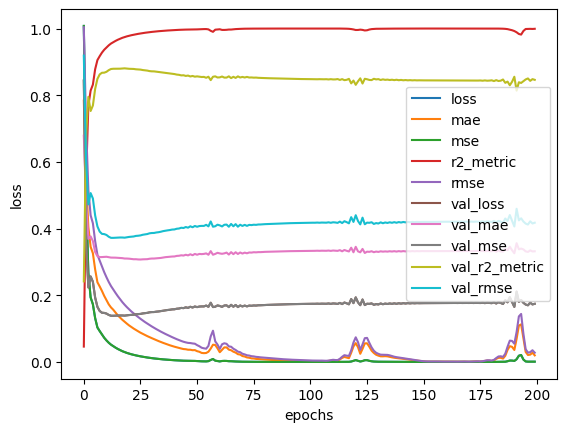

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

In [ ]:
tf.random.set_seed(42)

def r2_score(y_true, y_pred):
    ss_res = tf.reduce_sum(tf.square(y_train - y_pred))
    ss_tot = tf.reduce_sum(tf.square(y_train - tf.reduce_mean(y_true)))
    return 1 - ss_res/(ss_tot + tf.keras.backend.epsilon())
# STEP1: Creating the model

model1= tf.keras.Sequential([
                            tf.keras.layers.Dense(6, activation='relu'),
                            tf.keras.layers.Dense(1, activation='linear')
])

# STEP2: Compiling the model

model1.compile(
    loss=tf.keras.losses.MeanAbsoluteError(),
    optimizer=tf.keras.optimizers.SGD(),
    metrics=[tf.keras.metrics.MeanAbsoluteError(name="mae"),
        tf.keras.metrics.MeanSquaredError(name="mse"),
        tf.keras.metrics.MeanAbsolutePercentageError(name="mape"),
        tf.keras.metrics.RootMeanSquaredError(name="rmse"),
             r2_score])



# STEP1: Fit the model

import numpy as np

x_train = np.array(x_train, dtype=np.float32)
y_train = np.array(y_train, dtype=np.float32)
x_test  = np.array(x_test, dtype=np.float32)
y_test  = np.array(y_test, dtype=np.float32)


history= model.fit(x_train, y_train, epochs= 200, verbose=1)

Epoch 1/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 3.4375e-04 - mae: 0.0148 - mse: 3.4375e-04 - r2_metric: 0.9996 - rmse: 0.0184 
Epoch 2/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 2.5622e-04 - mae: 0.0122 - mse: 2.5622e-04 - r2_metric: 0.9997 - rmse: 0.0156 
Epoch 3/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 3.1222e-04 - mae: 0.0135 - mse: 3.1222e-04 - r2_metric: 0.9997 - rmse: 0.0172 
Epoch 4/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 3.4101e-04 - mae: 0.0136 - mse: 3.4101e-04 - r2_metric: 0.9996 - rmse: 0.0179
Epoch 5/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 2.5706e-04 - mae: 0.0117 - mse: 2.5706e-04 - r2_metric: 0.9997 - rmse: 0.0154 
Epoch 6/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 2.0949e-04 - mae: 0.0104 - mse: 2.0949e-04 - r2_metric: 0.9998 - rmse: 0.0138  
Epoch 7/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.9616e-04 - mae: 0.0106 - mse: 1.9616e-04 - r2_metric: 0.9998 - rmse: 0.0133 
Epoch 8/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/st

In [ ]:
model.evaluate(x_test, y_test)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1932 - mae: 0.3592 - mse: 0.1932 - r2_metric: 0.8303 - rmse: 0.4394


[0.18563103675842285,
 0.3492200970649719,
 0.18563103675842285,
 0.43084919452667236,
 0.8355889916419983]

Text(0.5, 0, 'epochs')

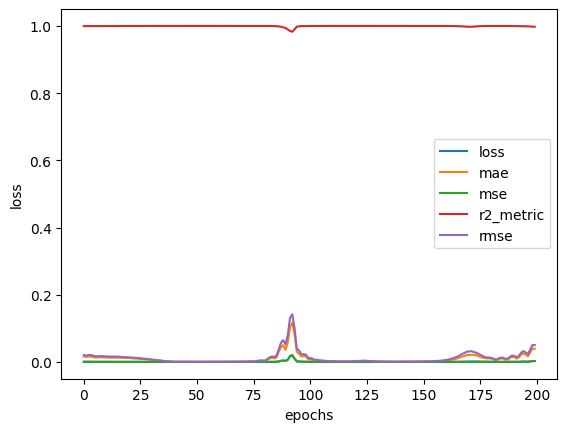

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

In [ ]:
import tensorflow as tf
import numpy as np

tf.random.set_seed(42)

# ---------- Custom R2 ----------
def r2_score(y_true, y_pred):
    ss_res = tf.reduce_sum(tf.square(y_true - y_pred))
    ss_tot = tf.reduce_sum(tf.square(y_true - tf.reduce_mean(y_true)))
    return 1 - ss_res / (ss_tot + tf.keras.backend.epsilon())

# ---------- Model ----------
model2 = tf.keras.Sequential([
    tf.keras.layers.Dense(6, activation='relu'),
    tf.keras.layers.Dense(5, activation='relu'),
    tf.keras.layers.Dense(4, activation='relu'),
    tf.keras.layers.Dense(3, activation='relu'),
    tf.keras.layers.Dense(1, activation='linear')
])

# ---------- Compile ----------
model2.compile(
    loss=tf.keras.losses.MeanAbsoluteError(),
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    metrics=[
        tf.keras.metrics.MeanAbsoluteError(name="mae"),
        tf.keras.metrics.MeanSquaredError(name="mse"),
        tf.keras.metrics.MeanAbsolutePercentageError(name="mape"),
        tf.keras.metrics.RootMeanSquaredError(name="rmse"),
        r2_score
    ]
)

# ---------- Prepare Data ----------
x_train = np.array(x_train, dtype=np.float32)
y_train = np.array(y_train, dtype=np.float32)
x_test  = np.array(x_test, dtype=np.float32)
y_test  = np.array(y_test, dtype=np.float32)

# ---------- Fit ----------
history = model2.fit(
    x_train, y_train,
    epochs=500,
    verbose=1,
    validation_data=(x_test, y_test)
)



Epoch 1/500
5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 78ms/step - loss: 0.8326 - mae: 0.8326 - mape: 106.8303 - mse: 1.0234 - r2_score: -0.0212 - rmse: 1.0110 - val_loss: 0.9093 - val_mae: 0.9093 - val_mape: 124.0129 - val_mse: 1.2784 - val_r2_score: -0.1716 - val_rmse: 1.1307
Epoch 2/500
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.8283 - mae: 0.8283 - mape: 106.7286 - mse: 1.0156 - r2_score: -0.0135 - rmse: 1.0072 - val_loss: 0.9079 - val_mae: 0.9079 - val_mape: 124.4175 - val_mse: 1.2815 - val_r2_score: -0.1749 - val_rmse: 1.1320
Epoch 3/500
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.8239 - mae: 0.8239 - mape: 106.5982 - mse: 1.0078 - r2_score: -0.0058 - rmse: 1.0033 - val_loss: 0.9073 - val_mae: 0.9073 - val_mape: 125.5391 - val_mse: 1.2866 - val_r2_score: -0.1801 - val_rmse: 1.1343
Epoch 4/500
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.8190 - mae: 0.8190 - mape: 106.4425 - mse: 0.9994 - r2_score: 0.0021 - rmse: 0.9991 - val_loss: 0.9071 - val_mae: 0.9071 - val_mape: 127.4417 - val_

In [ ]:
model2.evaluate(x_test, y_test)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.3548 - mae: 0.3548 - mape: 130.1629 - mse: 0.2056 - r2_score: 0.8093 - rmse: 0.4525


[0.3655666410923004,
 0.3655666410923004,
 0.22414648532867432,
 117.57950592041016,
 0.47344112396240234,
 0.7868732810020447]

Text(0.5, 0, 'epochs')

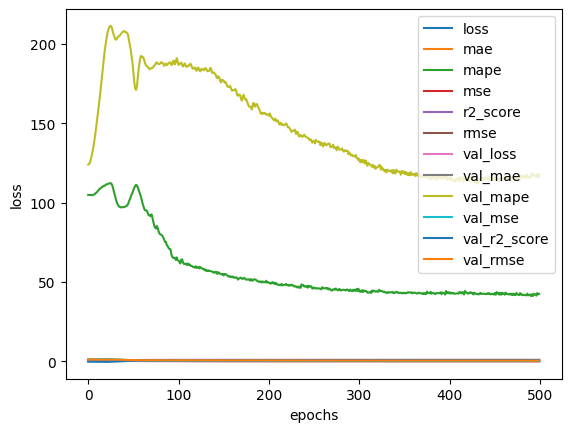

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

In [ ]:
y.describe()

,Life expectancy
count,188.000000
mean,72.235294
std,7.478185
min,53.000000
25%,67.000000
50%,73.000000
75%,77.250000
max,85.000000


In [ ]:
tf.random.set_seed(42)

# STEP1: Creating the model

model2= tf.keras.Sequential([
                            tf.keras.layers.Dense(8, activation='tanh'),
                            tf.keras.layers.Dense(5, activation='tanh'),
                            tf.keras.layers.Dense(2, activation='tanh'),
                            tf.keras.layers.Dense(1, activation='linear')
])

# STEP2: Compiling the model

model2.compile(
    loss=tf.keras.losses.mae,
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    metrics=[tf.keras.metrics.MeanAbsoluteError(name="mae"),
        tf.keras.metrics.MeanSquaredError(name="mse"),
        tf.keras.metrics.MeanAbsolutePercentageError(name="mape"),
        tf.keras.metrics.RootMeanSquaredError(name="rmse"),
        r2_score

    ]
)

# STEP1: Fit the model

history= model2.fit(x_train, y_train, epochs= 100)

Epoch 1/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.8497 - mae: 0.8497 - mape: 117.0940 - mse: 1.0649 - r2_score: -0.0626 - rmse: 1.0313
Epoch 2/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.8339 - mae: 0.8339 - mape: 114.5018 - mse: 1.0301 - r2_score: -0.0267 - rmse: 1.0143 
Epoch 3/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.8207 - mae: 0.8207 - mape: 112.3804 - mse: 1.0015 - r2_score: 0.0031 - rmse: 1.0001 
Epoch 4/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.8084 - mae: 0.8084 - mape: 110.4261 - mse: 0.9757 - r2_score: 0.0301 - rmse: 0.9871 
Epoch 5/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.7967 - mae: 0.7967 - mape: 108.6519 - mse: 0.9519 - r2_score: 0.0550 - rmse: 0.9750 
Epoch 6/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.7854 - mae: 0.7854 - mape: 106.9797 - mse: 0.9295 - r2_score: 0.0784 - rmse: 0.9634 
Epoch 7/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.7746 - mae: 0.7746 - mape: 105.7205 - mse: 0.9083 - r2_score: 0.1005 - rms

In [ ]:
model2.evaluate(x_test, y_test)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.4425 - mae: 0.4425 - mape: 190.8001 - mse: 0.3037 - r2_score: 0.7247 - rmse: 0.5509 


[0.4470506012439728,
 0.4470506012439728,
 0.3144315183162689,
 170.35885620117188,
 0.5607419610023499,
 0.7090790867805481]

Text(0.5, 0, 'epochs')

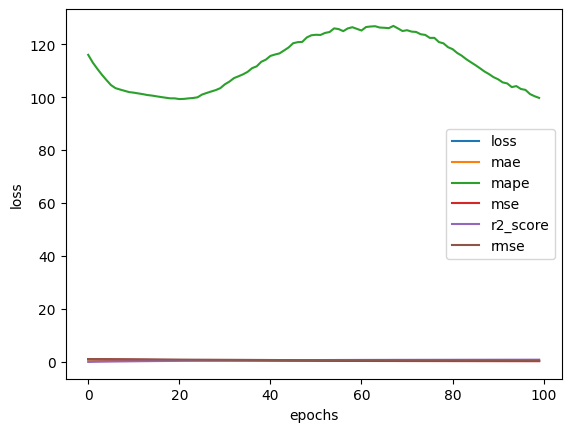

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

In [ ]:
tf.random.set_seed(42)

# STEP1: Creating the model

model2= tf.keras.Sequential([
                            tf.keras.layers.Dense(6, activation='relu'),
                            tf.keras.layers.Dense(5, activation='tanh'),
                            tf.keras.layers.Dense(2, activation='tanh'),
                            tf.keras.layers.Dense(1, activation='linear')

])

# STEP2: Compiling the model

model2.compile(
    loss=tf.keras.losses.mae,
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    metrics=[
             tf.keras.metrics.MeanAbsoluteError(name="mae"),
        tf.keras.metrics.MeanSquaredError(name="mse"),
        tf.keras.metrics.MeanAbsolutePercentageError(name="mape"),
        tf.keras.metrics.RootMeanSquaredError(name="rmse"),
        r2_score

    ]
)

# STEP1: Fit the model

history= model2.fit(x_train, y_train, epochs= 250)

Epoch 1/250
5/5 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - loss: 0.7333 - mae: 0.7333 - mape: 116.5143 - mse: 0.9324 - r2_score: 0.0934 - rmse: 0.9624
Epoch 2/250
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.7118 - mae: 0.7118 - mape: 114.3057 - mse: 0.8925 - r2_score: 0.1338 - rmse: 0.9414
Epoch 3/250
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.6953 - mae: 0.6953 - mape: 112.6073 - mse: 0.8563 - r2_score: 0.1701 - rmse: 0.9219
Epoch 4/250
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.6796 - mae: 0.6796 - mape: 110.9980 - mse: 0.8225 - r2_score: 0.2041 - rmse: 0.9034
Epoch 5/250
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.6646 - mae: 0.6646 - mape: 109.4521 - mse: 0.7915 - r2_score: 0.2344 - rmse: 0.8860
Epoch 6/250
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.6494 - mae: 0.6494 - mape: 107.9398 - mse: 0.7612 - r2_score: 0.2639 - rmse: 0.8689
Epoch 7/250
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.6342 - mae: 0.6342 - mape: 106.4780 - mse: 0.7321 - r2_score: 0.2924 - rmse:

In [ ]:
model2.evaluate(x_test, y_test)

2/2 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.3698 - mae: 0.3698 - mape: 143.6334 - mse: 0.2311 - r2_score: 0.7897 - rmse: 0.4805


[0.37469619512557983,
 0.37469619512557983,
 0.24140943586826324,
 130.2487335205078,
 0.49133434891700745,
 0.7755390405654907]

Text(0.5, 0, 'epochs')

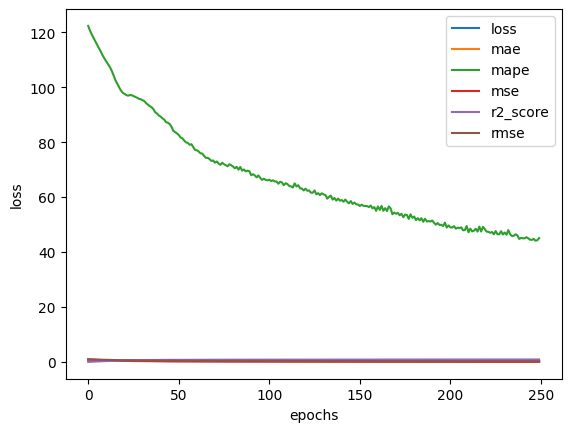

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

In [ ]:
import tensorflow as tf
import numpy as np

tf.random.set_seed(42)

# Custom R² metric
def r2_score(y_true, y_pred):
    ss_res = tf.reduce_sum(tf.square(y_true - y_pred))
    ss_tot = tf.reduce_sum(tf.square(y_true - tf.reduce_mean(y_true)))
    return 1 - ss_res/(ss_tot + tf.keras.backend.epsilon())

# STEP1: Create the model
model2 = tf.keras.Sequential([
    tf.keras.layers.Dense(6, activation='tanh'),
    tf.keras.layers.Dense(6, activation='tanh'),
    tf.keras.layers.Dense(1, activation=None)  # linear activation for regression
])

# STEP2: Compile the model
model2.compile(
    loss="mae",   # or "mse"
    optimizer=tf.keras.optimizers.SGD(learning_rate=0.01, momentum=0.9),
    metrics=[
        tf.keras.metrics.MeanAbsoluteError(name="mae"),
        tf.keras.metrics.MeanSquaredError(name="mse"),
        tf.keras.metrics.MeanAbsolutePercentageError(name="mape"),
        tf.keras.metrics.RootMeanSquaredError(name="rmse"),
        r2_score
    ]
)

# Convert data to numpy (float32)
x_train = np.array(x_train, dtype=np.float32)
y_train = np.array(y_train, dtype=np.float32)
x_test  = np.array(x_test, dtype=np.float32)
y_test  = np.array(y_test, dtype=np.float32)

# STEP3: Fit the model
history = model2.fit(x_train, y_train, epochs=600, validation_data=(x_test, y_test))


Epoch 1/600
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - loss: 0.8729 - mae: 0.8729 - mape: 185.7006 - mse: 1.1925 - r2_score: -0.1691 - rmse: 1.0896 - val_loss: 0.8175 - val_mae: 0.8175 - val_mape: 204.3644 - val_mse: 0.9923 - val_r2_score: 0.1048 - val_rmse: 0.9962
Epoch 2/600
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.6190 - mae: 0.6190 - mape: 140.9001 - mse: 0.6973 - r2_score: 0.3240 - rmse: 0.8328 - val_loss: 0.5821 - val_mae: 0.5821 - val_mape: 198.5944 - val_mse: 0.5372 - val_r2_score: 0.5167 - val_rmse: 0.7330
Epoch 3/600
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.4484 - mae: 0.4484 - mape: 128.5983 - mse: 0.3881 - r2_score: 0.6236 - rmse: 0.6204 - val_loss: 0.4527 - val_mae: 0.4527 - val_mape: 192.7354 - val_mse: 0.3814 - val_r2_score: 0.6571 - val_rmse: 0.6176
Epoch 4/600
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.3852 - mae: 0.3852 - mape: 125.4478 - mse: 0.2821 - r2_score: 0.7232 - rmse: 0.5292 - val_loss: 0.3946 - val_mae: 0.3946 - val_mape: 183.4241 - val_mse: 

In [ ]:
model2.evaluate(x_test, y_test)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.4305 - mae: 0.4305 - mape: 136.4551 - mse: 0.3110 - r2_score: 0.7144 - rmse: 0.5571


[0.43892931938171387,
 0.43892931938171387,
 0.3317285478115082,
 126.2010726928711,
 0.575958788394928,
 0.6881129741668701]

Text(0.5, 0, 'epochs')

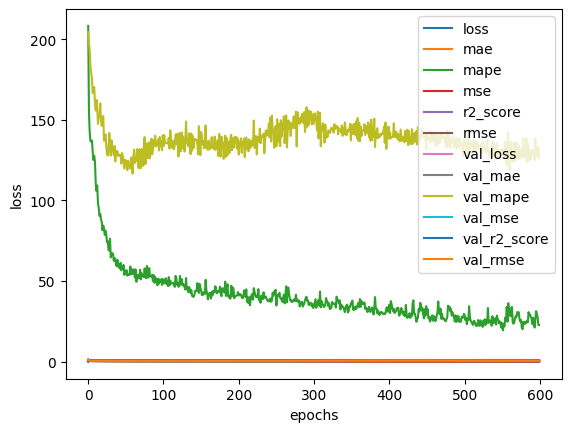

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

In [ ]:
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation="relu"),
    tf.keras.layers.Dense(64, activation="relu"),
    tf.keras.layers.Dense(32, activation="relu"),
    tf.keras.layers.Dense(1)
])

model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    loss="mse",
    metrics=[
        tf.keras.metrics.MeanAbsoluteError(name="mae"),
        tf.keras.metrics.RootMeanSquaredError(name="rmse")
    ]
)
history = model.fit(
    x_train, y_train,
    epochs=200,
    validation_data=(x_test, y_test),
    verbose=1
)

Epoch 1/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 1.1875 - mae: 0.8888 - rmse: 1.0879 - val_loss: 0.6379 - val_mae: 0.6552 - val_rmse: 0.7987
Epoch 2/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.4683 - mae: 0.5569 - rmse: 0.6833 - val_loss: 0.3685 - val_mae: 0.4722 - val_rmse: 0.6071
Epoch 3/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2172 - mae: 0.3823 - rmse: 0.4653 - val_loss: 0.4672 - val_mae: 0.4596 - val_rmse: 0.6835
Epoch 4/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.1655 - mae: 0.3248 - rmse: 0.4053 - val_loss: 0.4933 - val_mae: 0.4675 - val_rmse: 0.7023
Epoch 5/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.1459 - mae: 0.3051 - rmse: 0.3813 - val_loss: 0.3773 - val_mae: 0.4369 - val_rmse: 0.6142
Epoch 6/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.1117 - mae: 0.2634 - rmse: 0.3334 - val_loss: 0.2934 - val_mae: 0.4131 - val_rmse: 0.5416
Epoch 7/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0940 - mae: 0.2327 - rmse: 0.3051 - val_

In [ ]:
model2.evaluate(x_test, y_test)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.4305 - mae: 0.4305 - mape: 136.4551 - mse: 0.3110 - r2_score: 0.7144 - rmse: 0.5571


[0.43892931938171387,
 0.43892931938171387,
 0.3317285478115082,
 126.2010726928711,
 0.575958788394928,
 0.6881129741668701]

Text(0.5, 0, 'epochs')

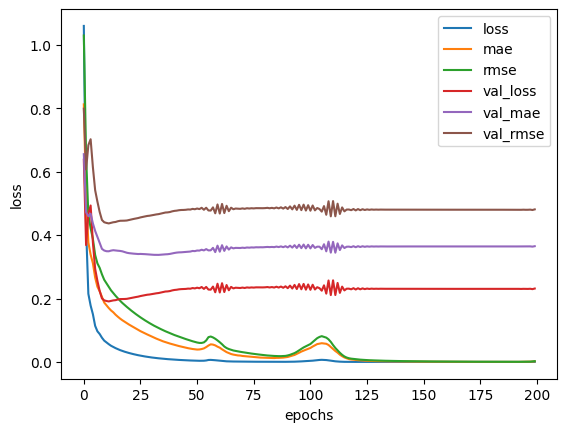

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

# ANN(75-25)

In [ ]:
import tensorflow as tf

In [ ]:
from sklearn.preprocessing import StandardScaler

# Scale X
scaler_x = StandardScaler()
x_train = scaler_x.fit_transform(x_train)
x_test  = scaler_x.transform(x_test)

# Scale y
scaler_y = StandardScaler()
y_train = scaler_y.fit_transform(y_train.reshape(-1,1)).flatten()
y_test = scaler_y.transform(y_test.reshape(-1,1)).flatten()

In [ ]:
import tensorflow as tf
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

tf.random.set_seed(42)

# ---------- Custom R2 metric ----------
def r2_metric(y_true, y_pred):
    ss_res = tf.reduce_sum(tf.square(y_true - y_pred))
    ss_tot = tf.reduce_sum(tf.square(y_true - tf.reduce_mean(y_true)))
    return 1 - ss_res / (ss_tot + tf.keras.backend.epsilon())

# ---------- Scale X and y ----------
scaler_x = StandardScaler()
scaler_y = StandardScaler()

x_train = scaler_x.fit_transform(np.array(x_train, dtype=np.float32))
x_test  = scaler_x.transform(np.array(x_test, dtype=np.float32))

y_train = scaler_y.fit_transform(np.array(y_train, dtype=np.float32).reshape(-1,1))
y_test  = scaler_y.transform(np.array(y_test, dtype=np.float32).reshape(-1,1))

# ---------- Model ----------
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation="relu"),
    tf.keras.layers.Dense(64, activation="relu"),
    tf.keras.layers.Dense(32, activation="relu"),
    tf.keras.layers.Dense(1)   # output is scaled y
])

# ---------- Compile ----------
model.compile(
    loss=tf.keras.losses.MeanSquaredError(),
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    metrics=[
        tf.keras.metrics.MeanAbsoluteError(name="mae"),
        tf.keras.metrics.MeanSquaredError(name="mse"),
        tf.keras.metrics.RootMeanSquaredError(name="rmse"),
        r2_metric
    ]
)

# ---------- Train ----------
history = model.fit(
    x_train, y_train,
    epochs=200,
    validation_data=(x_test, y_test),
    verbose=1
)

# ---------- Evaluate on test (inverse transform) ----------
y_pred_scaled = model.predict(x_test)
y_pred = scaler_y.inverse_transform(y_pred_scaled).flatten()
y_true = scaler_y.inverse_transform(y_test).flatten()

print("Final Evaluation on Original Scale:")
print("R²:", r2_score(y_true, y_pred))
print("MAE:", mean_absolute_error(y_true, y_pred))
print("RMSE:", np.sqrt(mean_squared_error(y_true, y_pred)))

Epoch 1/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.9947 - mae: 0.7746 - mse: 0.9947 - r2_metric: 0.0488 - rmse: 0.9961 - val_loss: 0.7010 - val_mae: 0.6666 - val_mse: 0.7010 - val_r2_metric: 0.3608 - val_rmse: 0.8373
Epoch 2/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.4952 - mae: 0.5365 - mse: 0.4952 - r2_metric: 0.5286 - rmse: 0.7021 - val_loss: 0.4757 - val_mae: 0.5523 - val_mse: 0.4757 - val_r2_metric: 0.5851 - val_rmse: 0.6897
Epoch 3/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.3105 - mae: 0.4141 - mse: 0.3105 - r2_metric: 0.7050 - rmse: 0.5547 - val_loss: 0.4488 - val_mae: 0.4965 - val_mse: 0.4488 - val_r2_metric: 0.6153 - val_rmse: 0.6699
Epoch 4/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.2139 - mae: 0.3518 - mse: 0.2139 - r2_metric: 0.8006 - rmse: 0.4595 - val_loss: 0.4788 - val_mae: 0.4559 - val_mse: 0.4788 - val_r2_metric: 0.5872 - val_rmse: 0.6920
Epoch 5/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1501 - mae: 0.3096 - mse: 0.1501 - r

In [ ]:
model.evaluate(x_test, y_test)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.2980 - mae: 0.3916 - mse: 0.2980 - r2_metric: 0.7416 - rmse: 0.5453


[0.2776948809623718,
 0.3788876533508301,
 0.2776948809623718,
 0.5269676446914673,
 0.7587796449661255]

In [ ]:
model.summary();

Model: "sequential_20"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_73 (Dense)                │ (None, 128)            │         3,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_74 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_75 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_76 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 41,093 (160.52 KB)

 Trainable params: 13,697 (53.50 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 27,396 (107.02 KB)

Text(0.5, 0, 'epochs')

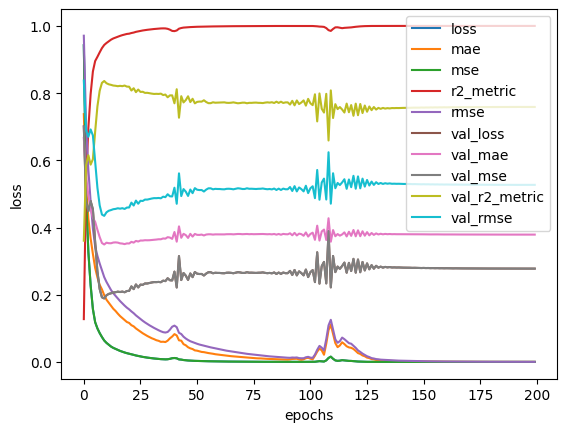

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

In [ ]:
tf.random.set_seed(42)

def r2_score(y_true, y_pred):
    ss_res = tf.reduce_sum(tf.square(y_train - y_pred))
    ss_tot = tf.reduce_sum(tf.square(y_train - tf.reduce_mean(y_true)))
    return 1 - ss_res/(ss_tot + tf.keras.backend.epsilon())
# STEP1: Creating the model

model1= tf.keras.Sequential([
                            tf.keras.layers.Dense(6, activation='relu'),
                            tf.keras.layers.Dense(1, activation='linear')
])

# STEP2: Compiling the model

model1.compile(
    loss=tf.keras.losses.MeanAbsoluteError(),
    optimizer=tf.keras.optimizers.SGD(),
    metrics=[tf.keras.metrics.MeanAbsoluteError(name="mae"),
        tf.keras.metrics.MeanSquaredError(name="mse"),
        tf.keras.metrics.MeanAbsolutePercentageError(name="mape"),
        tf.keras.metrics.RootMeanSquaredError(name="rmse"),
             r2_score])



# STEP1: Fit the model

import numpy as np

x_train = np.array(x_train, dtype=np.float32)
y_train = np.array(y_train, dtype=np.float32)
x_test  = np.array(x_test, dtype=np.float32)
y_test  = np.array(y_test, dtype=np.float32)


history= model.fit(x_train, y_train, epochs= 200, verbose=1)

Epoch 1/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 4.1545e-08 - mae: 1.5184e-04 - mse: 4.1545e-08 - r2_metric: 1.0000 - rmse: 2.0035e-04 
Epoch 2/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 1.2481e-07 - mae: 2.8995e-04 - mse: 1.2481e-07 - r2_metric: 1.0000 - rmse: 3.5115e-04
Epoch 3/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 2.0239e-07 - mae: 3.8277e-04 - mse: 2.0239e-07 - r2_metric: 1.0000 - rmse: 4.4859e-04 
Epoch 4/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 1.2504e-07 - mae: 2.9011e-04 - mse: 1.2504e-07 - r2_metric: 1.0000 - rmse: 3.5229e-04 
Epoch 5/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 8.6789e-08 - mae: 2.0726e-04 - mse: 8.6789e-08 - r2_metric: 1.0000 - rmse: 2.7911e-04 
Epoch 6/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 4.9205e-07 - mae: 5.8042e-04 - mse: 4.9205e-07 - r2_metric: 1.0000 - rmse: 6.9351e-04 
Epoch 7/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.2012e-06 - mae: 9.3633e-04 - mse: 1.2012e-06 - r2_metric: 1.0000 - rmse: 0.

In [ ]:
model.evaluate(x_test, y_test)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3332 - mae: 0.4004 - mse: 0.3332 - r2_metric: 0.7102 - rmse: 0.5767


[0.31282907724380493,
 0.3885250687599182,
 0.31282907724380493,
 0.5593112707138062,
 0.7269505262374878]

Text(0.5, 0, 'epochs')

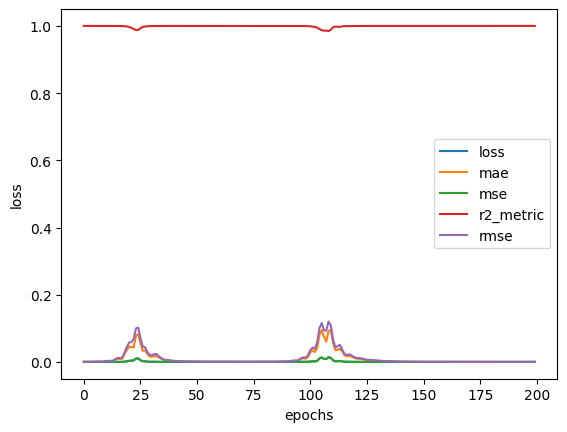

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

In [ ]:
import tensorflow as tf
import numpy as np

tf.random.set_seed(42)

# ---------- Custom R2 ----------
def r2_score(y_true, y_pred):
    ss_res = tf.reduce_sum(tf.square(y_true - y_pred))
    ss_tot = tf.reduce_sum(tf.square(y_true - tf.reduce_mean(y_true)))
    return 1 - ss_res / (ss_tot + tf.keras.backend.epsilon())

# ---------- Model ----------
model2 = tf.keras.Sequential([
    tf.keras.layers.Dense(6, activation='relu'),
    tf.keras.layers.Dense(5, activation='relu'),
    tf.keras.layers.Dense(4, activation='relu'),
    tf.keras.layers.Dense(3, activation='relu'),
    tf.keras.layers.Dense(1, activation='linear')
])

# ---------- Compile ----------
model2.compile(
    loss=tf.keras.losses.MeanAbsoluteError(),
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    metrics=[
        tf.keras.metrics.MeanAbsoluteError(name="mae"),
        tf.keras.metrics.MeanSquaredError(name="mse"),
        tf.keras.metrics.MeanAbsolutePercentageError(name="mape"),
        tf.keras.metrics.RootMeanSquaredError(name="rmse"),
        r2_score
    ]
)

# ---------- Prepare Data ----------
x_train = np.array(x_train, dtype=np.float32)
y_train = np.array(y_train, dtype=np.float32)
x_test  = np.array(x_test, dtype=np.float32)
y_test  = np.array(y_test, dtype=np.float32)

# ---------- Fit ----------
history = model2.fit(
    x_train, y_train,
    epochs=500,
    verbose=1,
    validation_data=(x_test, y_test)
)



Epoch 1/500
5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 82ms/step - loss: 0.8297 - mae: 0.8297 - mape: 100.8011 - mse: 1.0270 - r2_score: -0.0187 - rmse: 1.0126 - val_loss: 0.8635 - val_mae: 0.8635 - val_mape: 100.1564 - val_mse: 1.0746 - val_r2_score: 0.0448 - val_rmse: 1.0366
Epoch 2/500
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.8236 - mae: 0.8236 - mape: 99.8512 - mse: 1.0160 - r2_score: -0.0072 - rmse: 1.0071 - val_loss: 0.8617 - val_mae: 0.8617 - val_mape: 101.5592 - val_mse: 1.0721 - val_r2_score: 0.0474 - val_rmse: 1.0354
Epoch 3/500
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.8187 - mae: 0.8187 - mape: 99.4496 - mse: 1.0076 - r2_score: 0.0016 - rmse: 1.0029 - val_loss: 0.8615 - val_mae: 0.8615 - val_mape: 105.2830 - val_mse: 1.0700 - val_r2_score: 0.0494 - val_rmse: 1.0344
Epoch 4/500
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.8137 - mae: 0.8137 - mape: 99.3754 - mse: 0.9979 - r2_score: 0.0108 - rmse: 0.9981 - val_loss: 0.8612 - val_mae: 0.8612 - val_mape: 109.4347 - val_mse: 1.

In [ ]:
model2.evaluate(x_test, y_test)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.4471 - mae: 0.4471 - mape: 160.0403 - mse: 0.3573 - r2_score: 0.6756 - rmse: 0.5975


[0.4604476988315582,
 0.4604476988315582,
 0.37143105268478394,
 150.2209930419922,
 0.609451413154602,
 0.655556321144104]

Text(0.5, 0, 'epochs')

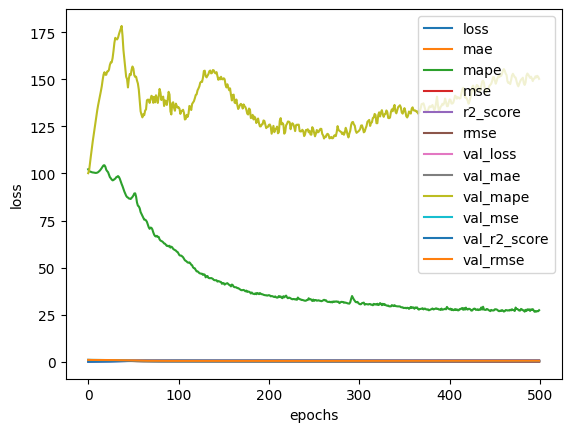

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

In [ ]:
y.describe()

,Life expectancy
count,188.000000
mean,72.235294
std,7.478185
min,53.000000
25%,67.000000
50%,73.000000
75%,77.250000
max,85.000000


In [ ]:
tf.random.set_seed(42)

# STEP1: Creating the model

model2= tf.keras.Sequential([
                            tf.keras.layers.Dense(8, activation='tanh'),
                            tf.keras.layers.Dense(5, activation='tanh'),
                            tf.keras.layers.Dense(2, activation='tanh'),
                            tf.keras.layers.Dense(1, activation='linear')
])

# STEP2: Compiling the model

model2.compile(
    loss=tf.keras.losses.mae,
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    metrics=[tf.keras.metrics.MeanAbsoluteError(name="mae"),
        tf.keras.metrics.MeanSquaredError(name="mse"),
        tf.keras.metrics.MeanAbsolutePercentageError(name="mape"),
        tf.keras.metrics.RootMeanSquaredError(name="rmse"),
        r2_score

    ]
)

# STEP1: Fit the model

history= model2.fit(x_train, y_train, epochs= 100)

Epoch 1/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.8784 - mae: 0.8784 - mape: 149.8835 - mse: 1.1141 - r2_score: -0.1161 - rmse: 1.0549
Epoch 2/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.8402 - mae: 0.8402 - mape: 145.6372 - mse: 1.0286 - r2_score: -0.0307 - rmse: 1.0137 
Epoch 3/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.8073 - mae: 0.8073 - mape: 142.1330 - mse: 0.9573 - r2_score: 0.0407 - rmse: 0.9780  
Epoch 4/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.7779 - mae: 0.7779 - mape: 140.4341 - mse: 0.8931 - r2_score: 0.1047 - rmse: 0.9446 
Epoch 5/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.7514 - mae: 0.7514 - mape: 139.6674 - mse: 0.8355 - r2_score: 0.1621 - rmse: 0.9137 
Epoch 6/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.7267 - mae: 0.7267 - mape: 138.5039 - mse: 0.7845 - r2_score: 0.2130 - rmse: 0.8853
Epoch 7/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.7039 - mae: 0.7039 - mape: 137.4682 - mse: 0.7388 - r2_score: 0.2585 - rms

In [ ]:
model2.evaluate(x_test, y_test)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.4285 - mae: 0.4285 - mape: 176.5509 - mse: 0.2995 - r2_score: 0.7244 - rmse: 0.5465 


[0.43852341175079346,
 0.43852341175079346,
 0.3210354745388031,
 156.03988647460938,
 0.5665999054908752,
 0.6973614692687988]

Text(0.5, 0, 'epochs')

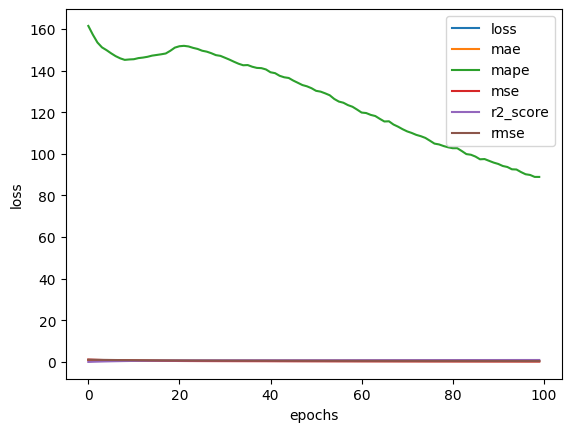

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

In [ ]:
tf.random.set_seed(42)

# STEP1: Creating the model

model2= tf.keras.Sequential([
                            tf.keras.layers.Dense(6, activation='relu'),
                            tf.keras.layers.Dense(5, activation='tanh'),
                            tf.keras.layers.Dense(2, activation='tanh'),
                            tf.keras.layers.Dense(1, activation='linear')

])

# STEP2: Compiling the model

model2.compile(
    loss=tf.keras.losses.mae,
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    metrics=[
             tf.keras.metrics.MeanAbsoluteError(name="mae"),
        tf.keras.metrics.MeanSquaredError(name="mse"),
        tf.keras.metrics.MeanAbsolutePercentageError(name="mape"),
        tf.keras.metrics.RootMeanSquaredError(name="rmse"),
        r2_score

    ]
)

# STEP1: Fit the model

history= model2.fit(x_train, y_train, epochs= 250)

Epoch 1/250
5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.9932 - mae: 0.9932 - mape: 162.6018 - mse: 1.4375 - r2_score: -0.4362 - rmse: 1.1973
Epoch 2/250
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.9669 - mae: 0.9669 - mape: 156.8748 - mse: 1.3689 - r2_score: -0.3671 - rmse: 1.1682
Epoch 3/250
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.9446 - mae: 0.9446 - mape: 152.2866 - mse: 1.3082 - r2_score: -0.3062 - rmse: 1.1420 
Epoch 4/250
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.9237 - mae: 0.9237 - mape: 148.3032 - mse: 1.2505 - r2_score: -0.2482 - rmse: 1.1165 
Epoch 5/250
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.9036 - mae: 0.9036 - mape: 144.4565 - mse: 1.1957 - r2_score: -0.1929 - rmse: 1.0917 
Epoch 6/250
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.8844 - mae: 0.8844 - mape: 140.8393 - mse: 1.1433 - r2_score: -0.1396 - rmse: 1.0676
Epoch 7/250
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.8658 - mae: 0.8658 - mape: 137.3936 - mse: 1.0933 - r2_score: -0.0877 -

In [ ]:
model2.evaluate(x_test, y_test)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.3278 - mae: 0.3278 - mape: 135.2527 - mse: 0.2114 - r2_score: 0.8007 - rmse: 0.4577 


[0.3476406931877136,
 0.3476406931877136,
 0.23901136219501495,
 124.3658676147461,
 0.48888787627220154,
 0.7686069011688232]

Text(0.5, 0, 'epochs')

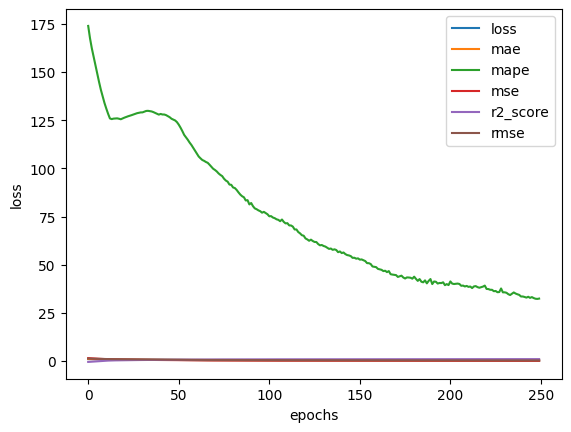

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

In [ ]:
import tensorflow as tf
import numpy as np

tf.random.set_seed(42)

# Custom R² metric
def r2_score(y_true, y_pred):
    ss_res = tf.reduce_sum(tf.square(y_true - y_pred))
    ss_tot = tf.reduce_sum(tf.square(y_true - tf.reduce_mean(y_true)))
    return 1 - ss_res/(ss_tot + tf.keras.backend.epsilon())

# STEP1: Create the model
model2 = tf.keras.Sequential([
    tf.keras.layers.Dense(6, activation='tanh'),
    tf.keras.layers.Dense(6, activation='tanh'),
    tf.keras.layers.Dense(1, activation=None)  # linear activation for regression
])

# STEP2: Compile the model
model2.compile(
    loss="mae",   # or "mse"
    optimizer=tf.keras.optimizers.SGD(learning_rate=0.01, momentum=0.9),
    metrics=[
        tf.keras.metrics.MeanAbsoluteError(name="mae"),
        tf.keras.metrics.MeanSquaredError(name="mse"),
        tf.keras.metrics.MeanAbsolutePercentageError(name="mape"),
        tf.keras.metrics.RootMeanSquaredError(name="rmse"),
        r2_score
    ]
)

# Convert data to numpy (float32)
x_train = np.array(x_train, dtype=np.float32)
y_train = np.array(y_train, dtype=np.float32)
x_test  = np.array(x_test, dtype=np.float32)
y_test  = np.array(y_test, dtype=np.float32)

# STEP3: Fit the model
history = model2.fit(x_train, y_train, epochs=600, validation_data=(x_test, y_test))


Epoch 1/600
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step - loss: 1.0219 - mae: 1.0219 - mape: 201.6865 - mse: 1.6412 - r2_score: -0.6704 - rmse: 1.2797 - val_loss: 1.0609 - val_mae: 1.0609 - val_mape: 223.3687 - val_mse: 1.5967 - val_r2_score: -0.4423 - val_rmse: 1.2636
Epoch 2/600
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.7880 - mae: 0.7880 - mape: 152.9281 - mse: 1.0309 - r2_score: -0.0330 - rmse: 1.0142 - val_loss: 0.7677 - val_mae: 0.7677 - val_mape: 175.6304 - val_mse: 0.8276 - val_r2_score: 0.2418 - val_rmse: 0.9097
Epoch 3/600
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.5615 - mae: 0.5615 - mape: 110.9104 - mse: 0.5574 - r2_score: 0.4373 - rmse: 0.7460 - val_loss: 0.5721 - val_mae: 0.5721 - val_mape: 135.7222 - val_mse: 0.5083 - val_r2_score: 0.5242 - val_rmse: 0.7129
Epoch 4/600
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.4930 - mae: 0.4930 - mape: 129.2782 - mse: 0.4113 - r2_score: 0.5811 - rmse: 0.6410 - val_loss: 0.5050 - val_mae: 0.5050 - val_mape: 140.6275 - val_mse

In [ ]:
model2.evaluate(x_test, y_test)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.5703 - mae: 0.5703 - mape: 190.6023 - mse: 0.4990 - r2_score: 0.5618 - rmse: 0.7062


[0.557079017162323,
 0.557079017162323,
 0.4795110523700714,
 180.08175659179688,
 0.6924673914909363,
 0.5752562880516052]

Text(0.5, 0, 'epochs')

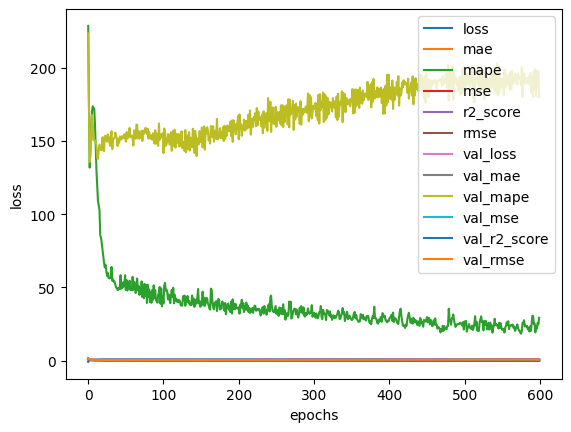

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

In [ ]:
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation="relu"),
    tf.keras.layers.Dense(64, activation="relu"),
    tf.keras.layers.Dense(32, activation="relu"),
    tf.keras.layers.Dense(1)
])

model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    loss="mse",
    metrics=[
        tf.keras.metrics.MeanAbsoluteError(name="mae"),
        tf.keras.metrics.RootMeanSquaredError(name="rmse")
    ]
)
history = model.fit(
    x_train, y_train,
    epochs=200,
    validation_data=(x_test, y_test),
    verbose=1
)

Epoch 1/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - loss: 1.1440 - mae: 0.8724 - rmse: 1.0676 - val_loss: 0.6633 - val_mae: 0.6823 - val_rmse: 0.8144
Epoch 2/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.5510 - mae: 0.5936 - rmse: 0.7412 - val_loss: 0.3231 - val_mae: 0.4781 - val_rmse: 0.5684
Epoch 3/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.2844 - mae: 0.4253 - rmse: 0.5323 - val_loss: 0.2041 - val_mae: 0.3642 - val_rmse: 0.4518
Epoch 4/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.1714 - mae: 0.3206 - rmse: 0.4123 - val_loss: 0.2279 - val_mae: 0.3737 - val_rmse: 0.4774
Epoch 5/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.1343 - mae: 0.2889 - rmse: 0.3645 - val_loss: 0.3344 - val_mae: 0.4347 - val_rmse: 0.5783
Epoch 6/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1118 - mae: 0.2643 - rmse: 0.3329 - val_loss: 0.3368 - val_mae: 0.4328 - val_rmse: 0.5803
Epoch 7/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0938 - mae: 0.2388 - rmse: 0.3051 - val_

In [ ]:
model2.evaluate(x_test, y_test)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.5703 - mae: 0.5703 - mape: 190.6023 - mse: 0.4990 - r2_score: 0.5618 - rmse: 0.7062


[0.557079017162323,
 0.557079017162323,
 0.4795110523700714,
 180.08175659179688,
 0.6924673914909363,
 0.5752562880516052]

Text(0.5, 0, 'epochs')

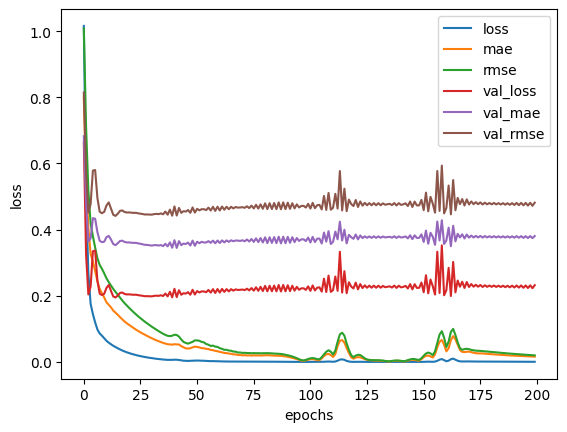

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")